___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Fraud Detection Project***". This is the last project of the Capstone Series.

One of the challenges in this project is the absence of domain knowledge. So without knowing what the column names are, you will only be interested in their values. The other one is the class frequencies of the target variable are quite imbalanced.

You will implement ***Logistic Regression, Random Forest, XGBoost,and Neural Network*** algorithms and ***Unbalanced Data Techniques*** . Also visualize performances of the models using ***Seaborn, Matplotlib*** and ***other libraries*** in a variety of ways.

Data drift and model drirft are key consepts about ML and MLOPS, you can monitor and check your data and models with plenty of ways and tools. ***Deepchecks*** is one of them and the leading tool for testing and for validating your machine learning models and data, and it enables doing so with minimal effort. In this project, you will apply ***Data Integrity, Train-Test Validation, and Model Evaluation*** checks.
Deepchecks Introduction : https://youtu.be/7ELdizoi6BU

At the end of the project, you will have the opportunity to deploy your model by ***Streamlit API***.

Before diving into the project, please take a look at the Determines and Tasks.

---
---


# #Determines
The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where it has **492 frauds** out of **284,807** transactions. The dataset is **highly unbalanced**, the positive class (frauds) account for 0.172% of all transactions.

**Feature Information:**

**Time**: This feature is contains the seconds elapsed between each transaction and the first transaction in the dataset.

**Amount**:  This feature is the transaction Amount, can be used for example-dependant cost-senstive learning.

**Class**: This feature is the target variable and it takes value 1 in case of fraud and 0 otherwise.

---

The aim of this project is to predict whether a credit card transaction is fraudulent. Of course, this is not easy to do.
First of all, you need to analyze and recognize your data well in order to draw your roadmap and choose the correct arguments you will use. Accordingly, you can examine the frequency distributions of variables. You can observe variable correlations and want to explore multicollinearity. You can display the distribution of the target variable s classes over other variables.
Also, it is useful to take missing values and outliers.

After these procedures, you can move on to the model building stage by doing the basic data pre-processing you are familiar with.

Start with Logistic Regression and evaluate model performance. You will apply the Unbalanced Data Techniques used to increase the performance. Next, observe their effects.

Then, you will use four different algorithms in the model building phase.

In the final step, you will deploy your model using ***Streamlit API***.

---
---


# #Tasks

#### 1. Exploratory Data Analysis & Data Cleaning

- Import Modules, Load Data & Data Review
- Apply data integrity checks
- Exploratory Data Analysis
- Data Cleaning
    
#### 2. Data Preprocessing

- Train - Test Split
- Train - Test Split Validation Checks
- Scaling

#### 3. Model Building

- Logistic Regression
- Random Forest Classifier
- XGBoost Classifier
- Neural Network
-

#### 4. Model Deployement

- Save and Export the Best Model
- Save and Export Variables




---
---


## 1. Exploratory Data Analysis & Data Cleaning

### Import Modules, Load Data & Data Review

In [1]:
# import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


from sklearn.model_selection import  train_test_split

plt.rcParams["figure.figsize"] = (7,4)
import warnings

# ignore warning
warnings.filterwarnings("ignore")
warnings.warn("this will not show")


In [2]:
# pip install deepchecks


In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import recall_score,\
                            f1_score, precision_recall_curve,\
                            average_precision_score
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV,\
                                    HalvingGridSearchCV,\
                                    RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import HalvingRandomSearchCV

from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    recall_score,
    precision_score,
    make_scorer,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    average_precision_score,
    roc_curve,
    auc,
)


from sklearn.experimental import enable_halving_search_cv # noqa
# now you can import normally from model_selection
from sklearn.model_selection import HalvingGridSearchCV


from sklearn.ensemble import RandomForestClassifier

from scikitplot.metrics import plot_roc, plot_precision_recall


# equalizes or approximates minority classes to the majority class.
from imblearn.over_sampling import SMOTE

# equalizes or converges the majority class to the minority class
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline
from xgboost import XGBClassifier

In [5]:
df = pd.DataFrame(pd.read_csv("creditcard.csv"))
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [7]:
# Round it
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [8]:
original_shape = df.shape

In [9]:
# Check missing values
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [10]:
df.columns.values

array(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9',
       'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18',
       'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27',
       'V28', 'Amount', 'Class'], dtype=object)

## Apply Data Integrity Checks
* link: https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_data_integrity.html

In [11]:
#!pip install deepchecks

In [12]:
import deepchecks

In [13]:
from deepchecks.tabular import Dataset

In [14]:
ds = Dataset(df,label= "Class" )

deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.


In [15]:
import deepchecks
from deepchecks.tabular.suites import data_integrity

# Run the data integrity suite
integ_suite = data_integrity()
suite_result = integ_suite.run(ds)



In [16]:
# Display the results
suite_result.show()

Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_IKP2NTC666X12KVGHCE1NDHMN">Data Integrity Sui…

In [17]:
# Check that all transaction amounts are positive
print(df[df[ "Amount" ] < 0].shape[0])

0


### Exploratory Data Analysis

In [18]:
Class_Distribution=df[ "Class" ].value_counts().sort_values(ascending=False)
Class_Distribution

Class
0    284315
1       492
Name: count, dtype: int64

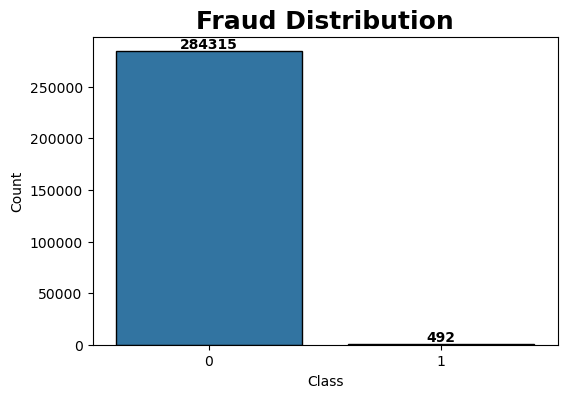

In [19]:
# Calculate class distribution
Class_Distribution = df[ "Class" ].value_counts().sort_values(ascending=False)

# Set the width and height of the figure
plt.figure(figsize=(6, 4))

# Add title
plt.title("Fraud Distribution", fontsize=18, weight= "bold" )

# Create a bar plot
sns.barplot(x=Class_Distribution.index, y=Class_Distribution, ci=False, edgecolor="black")

# Rotate x-labels for better visibility
plt.xticks(rotation=0)

# Add labels to axes
plt.xlabel("Class")
plt.ylabel("Count")

# Add numbers inside the bars
for i, count in enumerate(Class_Distribution):
    plt.text(i, count, count, ha='center', va='bottom', fontweight='bold')


# Show the plot
plt.show()

In [20]:
# plt.figure(figsize=(8, 6))

# # Add title
# plt.title("Top Ten Amounts Distribution", fontsize=18, weight= bold )

# # Select the top ten values from Amount_Distribution
# top_ten_amounts = Amount_Distribution.nlargest(10)

# # Create a bar plot for the top ten values
# sns.barplot(x=top_ten_amounts.index, y=top_ten_amounts, ci=False, edgecolor="black")

# # Rotate x-labels, otherwise it s utterly hectic
# plt.xticks(rotation=90)

# plt.ylabel("Count")
# plt.show()

In [21]:
df.Amount.describe()

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

(0.0, 5000.0)

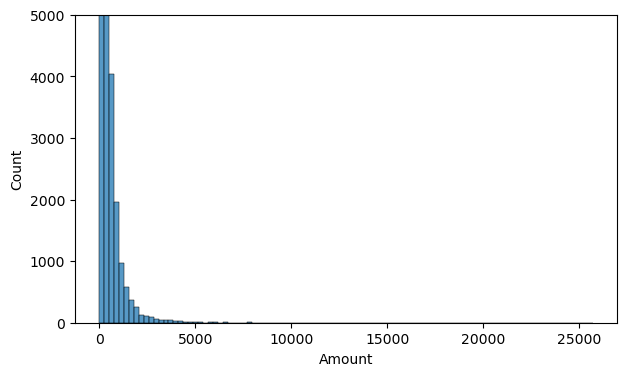

In [22]:
sns.histplot(x="Amount", data=df, bins=100)
plt.ylim(0, 5000)

(0.0, 6000.0)

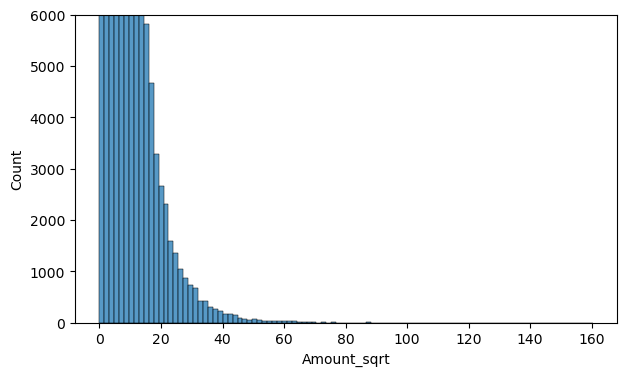

In [23]:
# Check if square root transfromation is good
df["Amount_sqrt"] = df["Amount"] ** 0.5
sns.histplot(x="Amount_sqrt", data=df, bins=100)
plt.ylim(0, 6000)

count    284807.000
mean          3.152
std           1.657
min           0.000
25%           1.887
50%           3.135
75%           4.359
max          10.154
Name: Amount_ln, dtype: float64


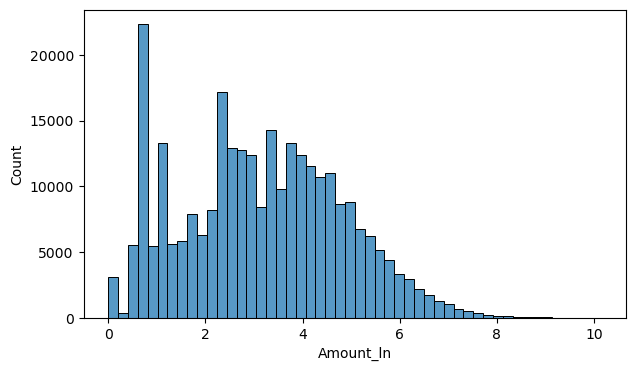

In [24]:
# Check if square root transfromation is good


# Adding a small constant (e.g., 1) to all values to avoid issues with zero
constant = 0.0000001
df["Amount_ln"] = np.log1p(df["Amount"] + constant)

sns.histplot(x="Amount_ln", data=df, bins=50)
#plt.ylim(0, 6000)

print(round(df["Amount_ln"].describe(),3))

<Figure size 1600x1200 with 0 Axes>

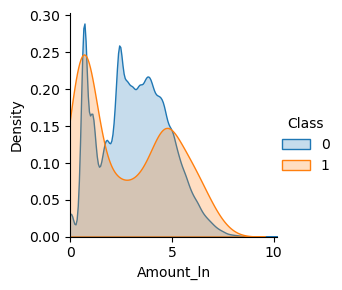

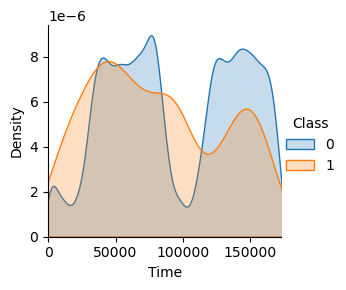

In [25]:
import seaborn as maps
plt.figure(figsize=(16, 12))
plot_features = [ "Amount_ln" , "Time" ]
for pf in plot_features:
    g = maps.FacetGrid(df, hue="Class")
    g.map(maps.kdeplot,pf,shade= True)
    g.set(xlim=(0, df[pf].max()))
    g.add_legend()

- The mutual areas is large                  (which is a problem)
- The areas with unique class 0 is small     (which is a problem)

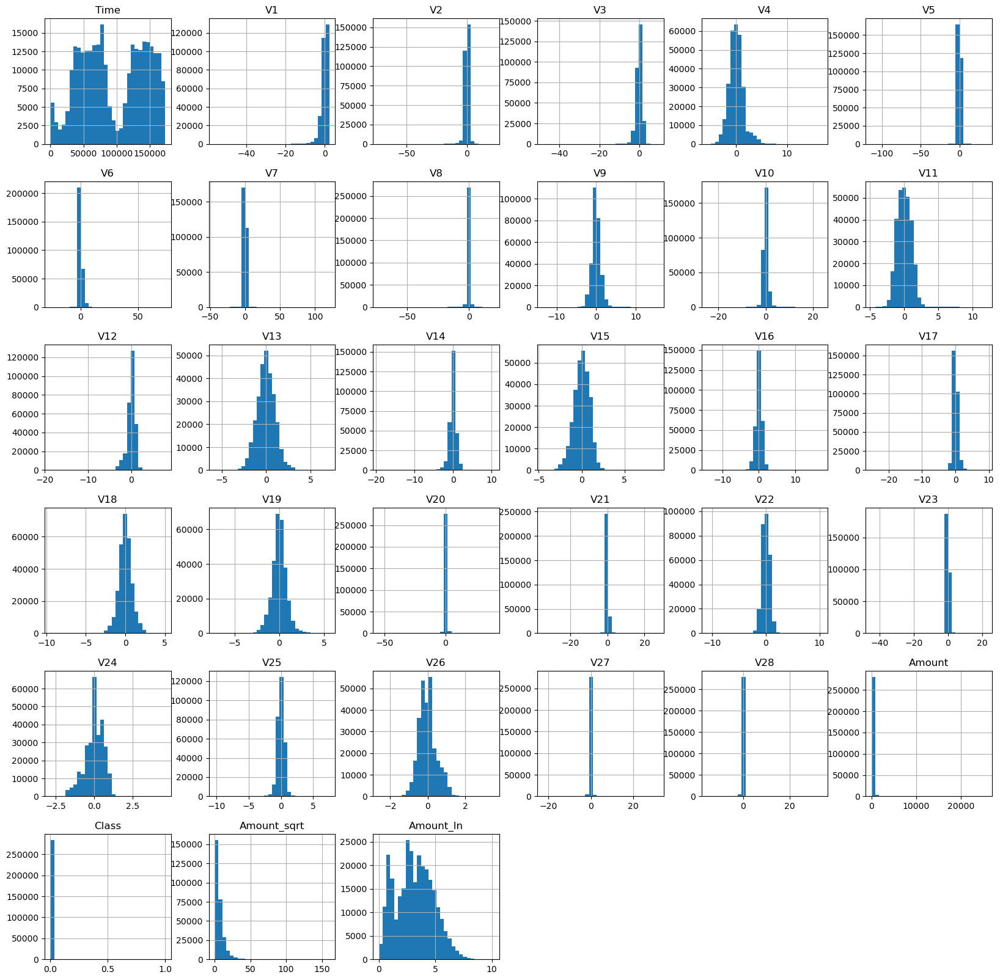

In [26]:
# Visualize histograms of numerical features
df.hist(figsize=(20,20),  bins=30)
plt.show()

In [27]:
df = df.drop(["Amount", "Amount_sqrt", "Time"],axis=1)

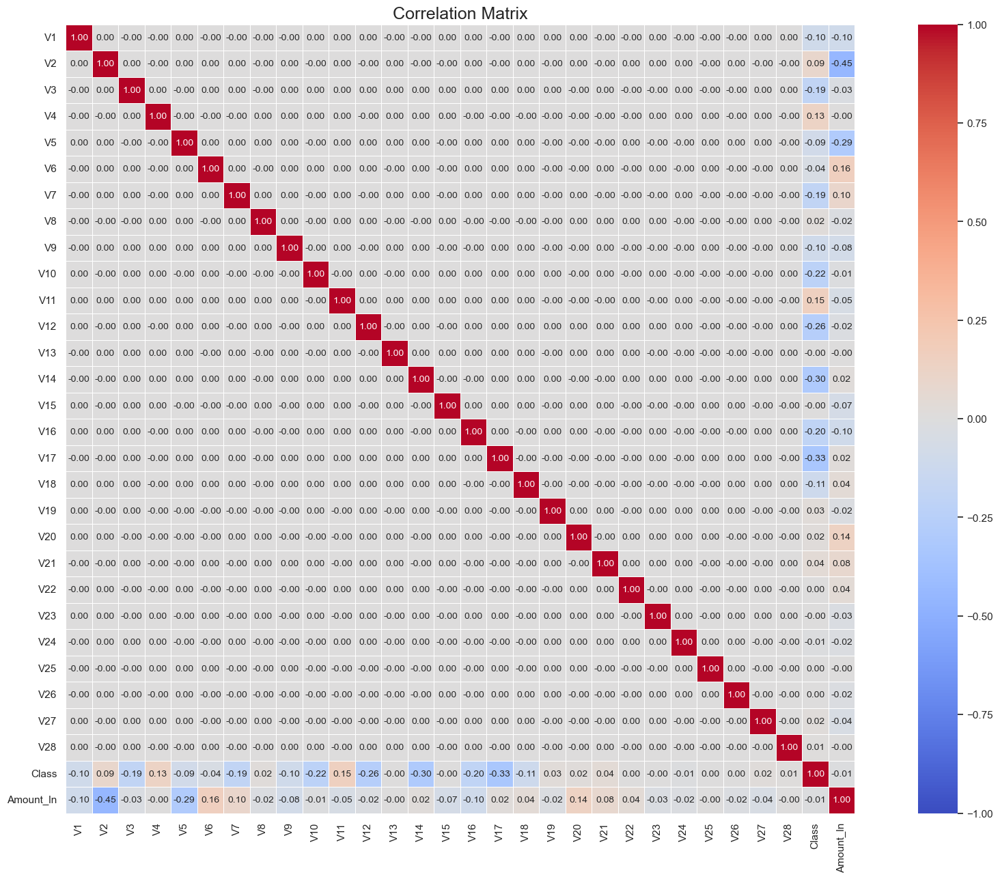

In [28]:
# Set the style for the plot
sns.set(style="white")
plt.figure(figsize=(24, 15))

# Calculate correlation matrix
corr_matrix = df.corr().round(2)

# Create a heatmap with coolwarm color map
sns.heatmap(
    corr_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5, square=True,  vmin=-1, vmax=1, annot_kws={"fontsize": 10})

# Set plot title
plt.title("Correlation Matrix", fontsize=18)

# Display the plot
plt.show()


#sns.heatmap(X_scaled_df.corr().round(2), vmin=-1, vmax=1, annot=True, cmap="coolwarm")


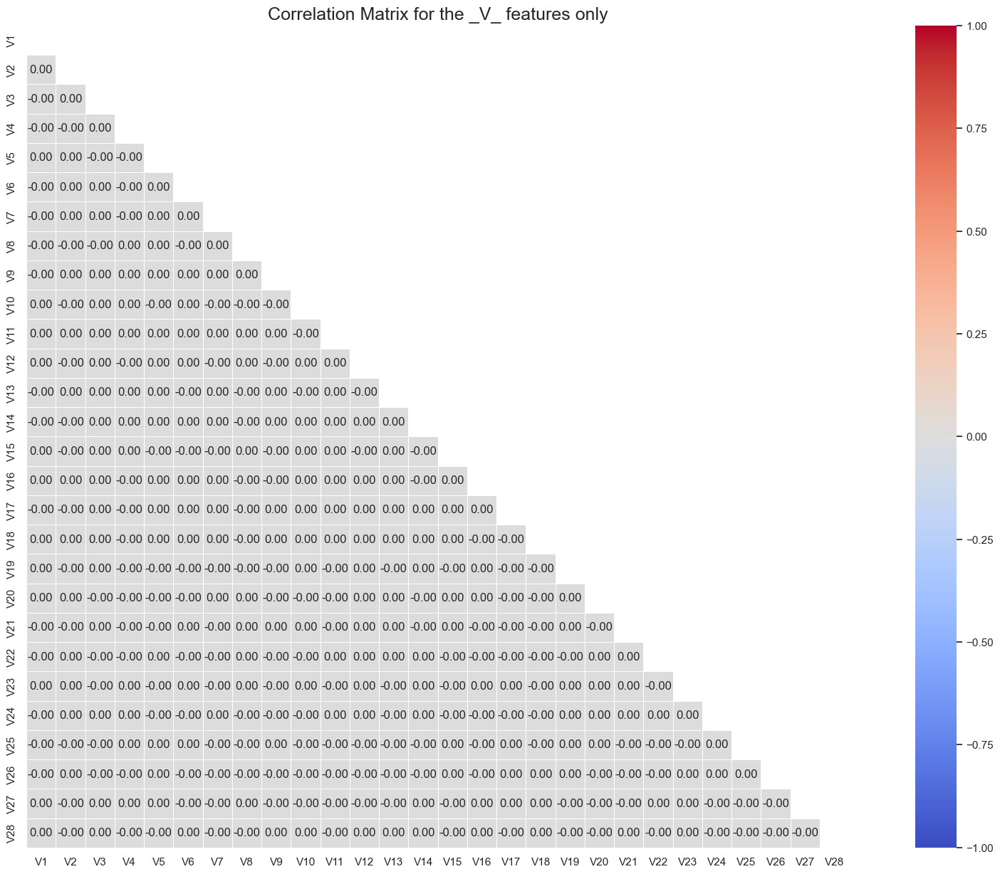

In [29]:
# Set the style for the plot
sns.set(style="white")
plt.figure(figsize=(24, 15))




# Calculate correlation matrix
corr_matrix = df.drop(["Class", "Amount_ln"], axis=1).corr().round(2)
# Upper triangle of an array
matrix = np.triu(corr_matrix.corr())


# Create a heatmap with coolwarm color map
sns.heatmap(
    corr_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5, square=True,  vmin=-1, vmax=1,mask=matrix)

# Set plot title
plt.title("Correlation Matrix for the _V_ features only", fontsize=18)

# Display the plot
plt.show()


#sns.heatmap(X_scaled_df.corr().round(2), vmin=-1, vmax=1, annot=True, cmap="coolwarm")


As seen in this correlation heat map, all correlations between the "V" components are 0 which means these are independent variables, which points to the fact that they are components after applying PCA.
<br>
Another support to this assumption is the fact that the dataset is regarding bank information where *PRIVACY* is crucial.
<br>
In summary, PCA was applied to the dataset before giving the dataset to the anyalsys team.
<br>
<br>

##### make sure ##########
Since PCA is applied on a dataset after removing the outliers, we will not delete any new observations that is classified so
##### make sure ##########


In [30]:
# # Create a copy for only observations of class 0
# df_delete0 = df.copy()
# df_delete0 = df_delete0.query( Class==0 )

# # Create a copy for only observations of class 1
# df_delete1 = df.copy()
# df_delete1 = df_delete1.query( Class==1 )

# # print shapes 
# print( shape of 0:  , df_delete0.shape)
# print( shape of 1:  , df_delete1.shape)

In [31]:
# # # Check for outliers per class and remove them
# df_delete0 = df.copy()
# df_delete0 = df_delete0.query( Class==0 )
# for column in df_delete0.query( Class==0 ).columns:
#     # Calculate the interquartile range (IQR)
#     iqr = df_delete0[column].quantile(0.75) - df_delete0[column].quantile(0.25)

#     # Calculate the upper and lower whiskers
#     upper_whisker = df_delete0[column].quantile(0.75) + 2 * iqr
#     lower_whisker = df_delete0[column].quantile(0.25) - 2 * iqr

#     # Identify outliers
#     outliers_index = (df_delete0[column] > upper_whisker) | (df_delete0[column] < lower_whisker)

#     # Remove outliers by keeping only non-outliers
#     df_delete0 = df_delete0[outliers_index==False]

# # Print the DataFrame after removing outliers
# print("shape after removing outlires:",df_delete0.shape)
# print("The original shape:", df.query( Class==0 ).shape)

In [32]:
# df_delete1 = df.copy()
# df_delete1 = df_delete1.query( Class==1 )

# for column in df.query( Class==1 ).columns:
#     # Calculate the interquartile range (IQR)
#     iqr = df_delete1[column].quantile(0.75) - df_delete1[column].quantile(0.25)

#     # Calculate the upper and lower whiskers
#     upper_whisker = df_delete1[column].quantile(0.75) + 3 * iqr
#     lower_whisker = df_delete1[column].quantile(0.25) - 3 * iqr

#     # Identify outliers
#     outliers_index = (df_delete1[column] > upper_whisker) | (df_delete1[column] < lower_whisker)

#     # Remove outliers by keeping only non-outliers
#     df_delete1 = df_delete1[outliers_index==False]

# # Print the DataFrame after removing outliers
# print("shape after removing outlires:", df_delete1.shape)
# print("The original shape:",df.query( Class==1 ).shape)

In [33]:
# # Concatenate the dataframes vertically
# df = pd.concat([df_delete0, df_delete1])

# # Reset the index of the merged dataframe
# df.reset_index(drop=True, inplace=True)
# df.head()

In [34]:
# print("shape after removing outlires:", df.shape)
# print("The original shape:", original_shape)
# print("The deleted observations are:", original_shape[0]- df.shape[0])

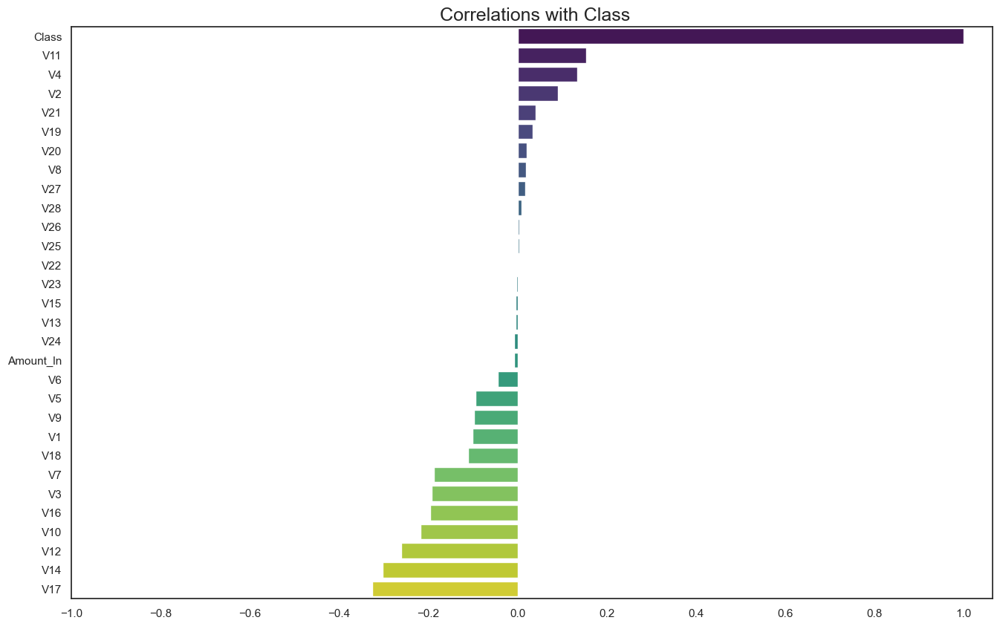

In [35]:
# Set the style for the plot
sns.set(style="white")
plt.figure(figsize=(16, 10))

# Calculate correlation matrix
corr_matrix = df.corr()

# Choose your target variable (assuming  target_variable  is your target variable)
target_variable = "Class"

# Extract correlations with the target variable
correlations = corr_matrix[target_variable].sort_values(ascending=False)

# Create a bar plot for the most important features
sns.barplot(x=correlations.values, y=correlations.index, palette="viridis")

# Set plot title
plt.title(f" Correlations with {target_variable}", fontsize=18)
plt.xticks(np.arange(-1, 1.0001, step=0.2))
# Display the plot
plt.show()

### Data Cleaning
Check Missing Values and Outliers

In [36]:
df.duplicated().sum()

9144

In [37]:
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

<Figure size 600x400 with 0 Axes>

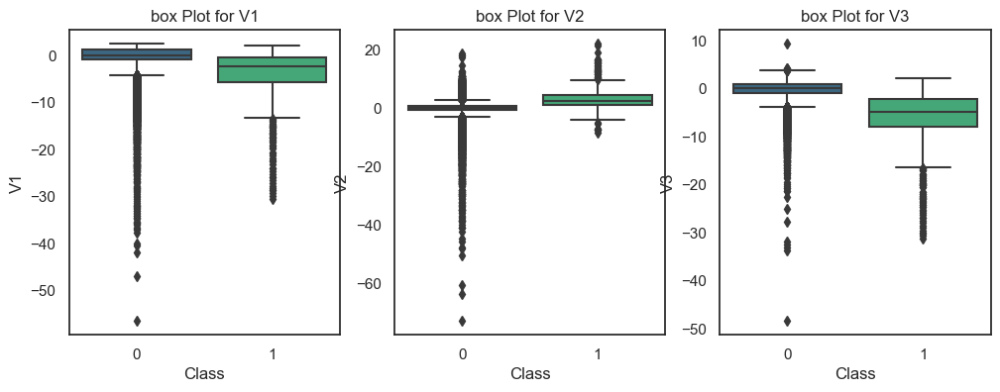

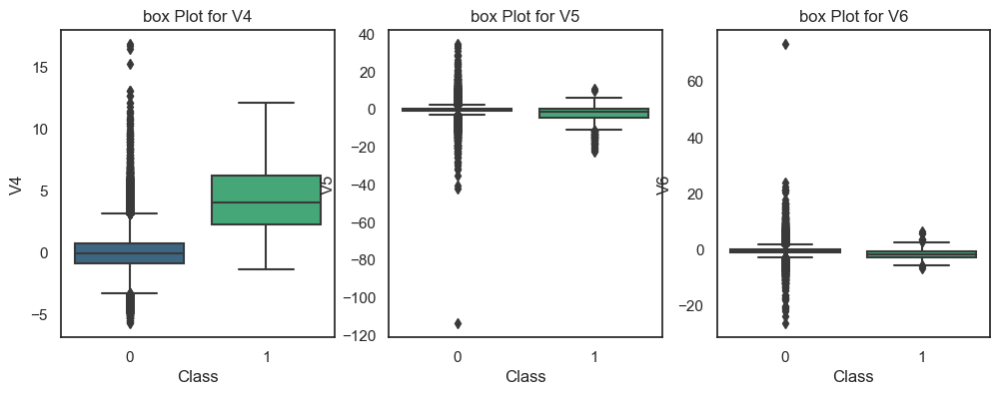

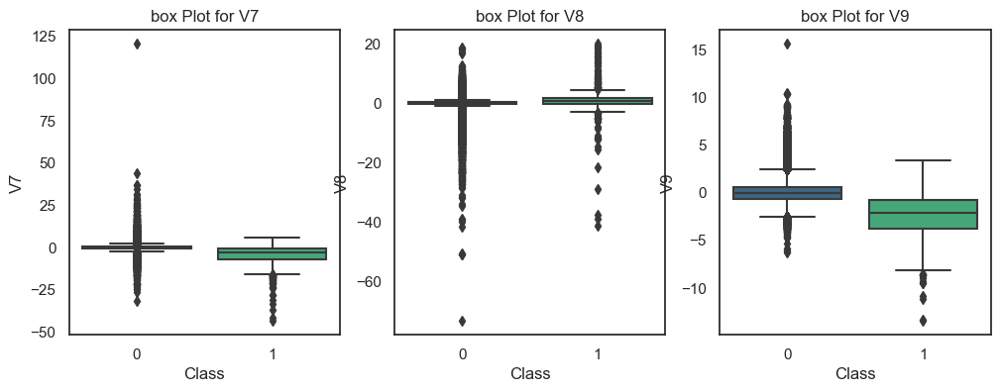

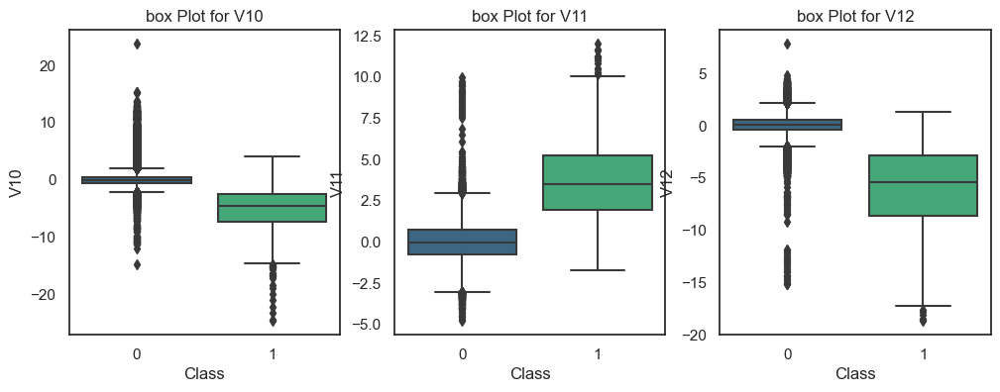

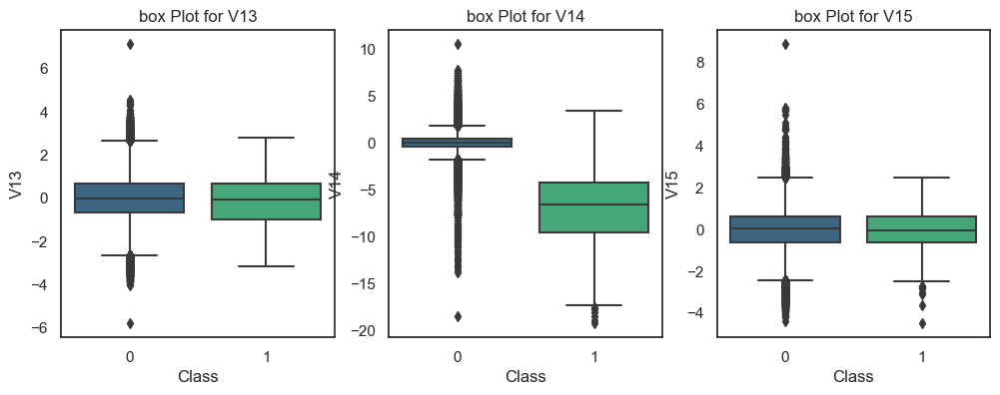

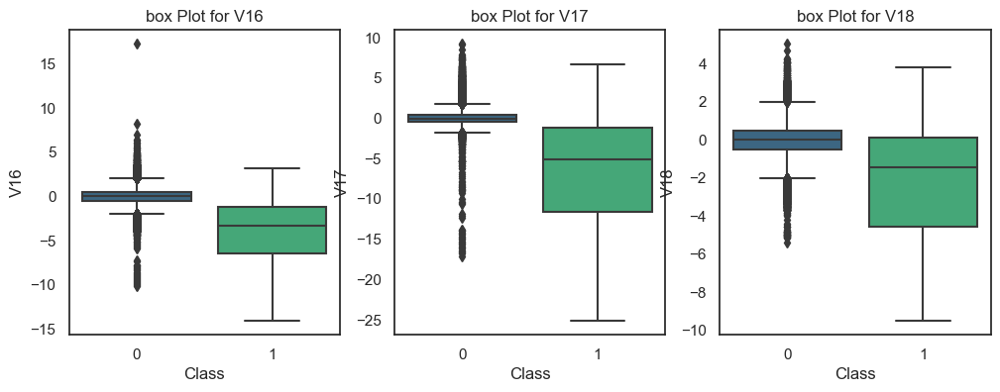

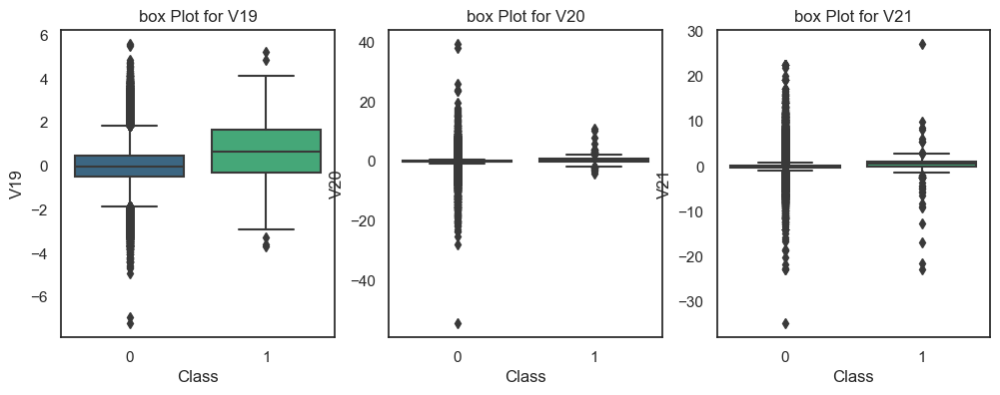

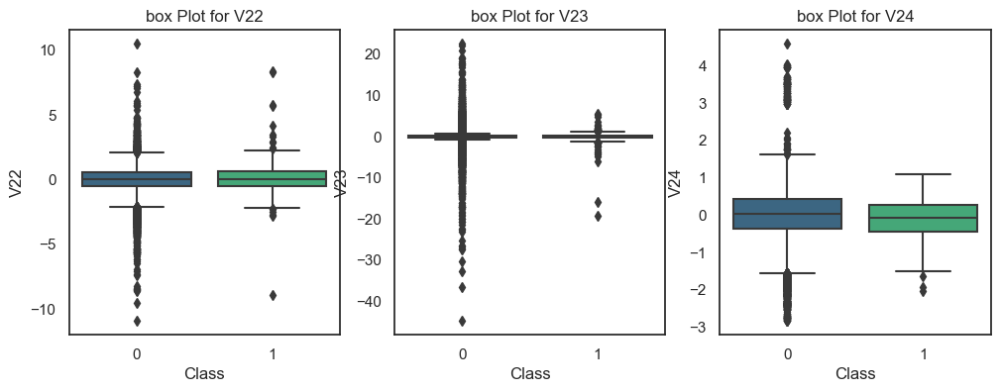

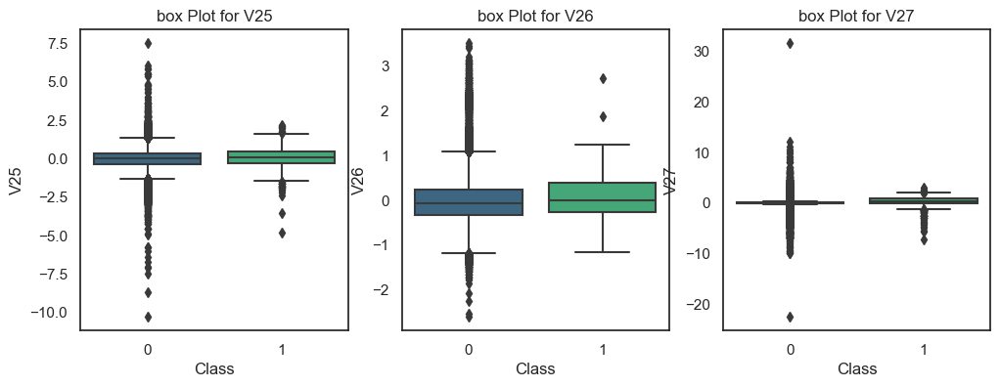

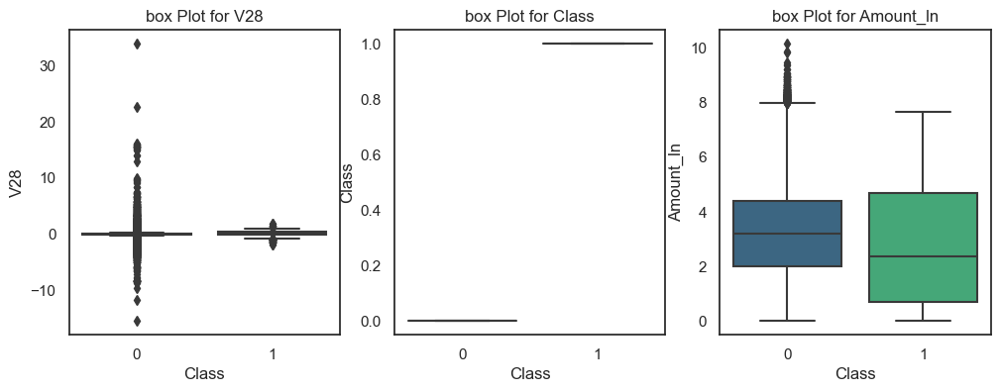

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns
numerical_cols = df.select_dtypes(include= "number" ).columns

# Create violin plots for each numerical column
plt.figure(figsize=(6, 4))
for i, col in enumerate(numerical_cols):
    if i % 3 == 0:
        plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, i % 3 + 1)
    sns.boxplot(x =  "Class" , y = col, data = df, palette="viridis")
    plt.title(f"box Plot for {col}" )
    if i % 3 == 2 or i == len(numerical_cols) - 1:
        plt.show()



# index = 0
# plt.figure(figsize=(20,20))
# for feature in df.columns :
#     if feature !=  class  :
#         index += 1
#         plt.subplot(8,4,index)
#         sns.boxplot(x =  class , y = feature, data = df, palette="viridis")
# plt.tight_layout()

# plt.show();

<Figure size 1500x500 with 0 Axes>

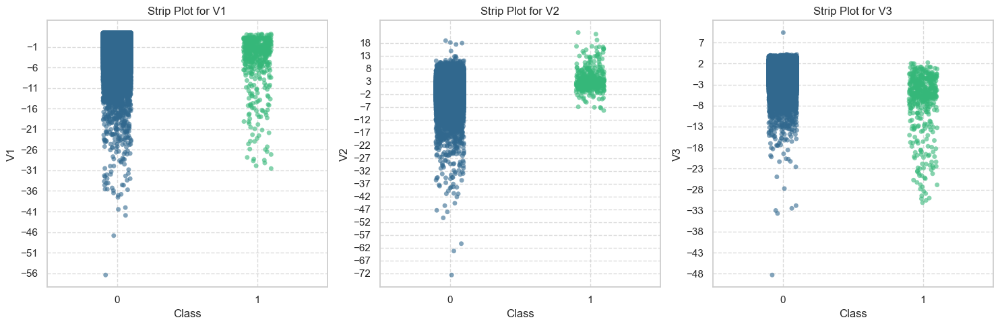

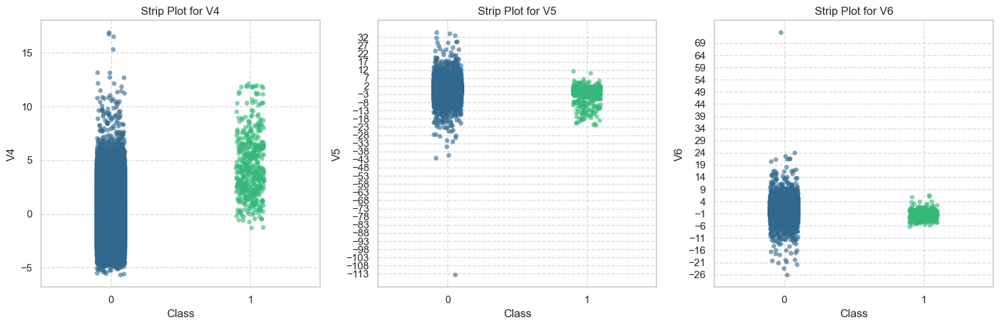

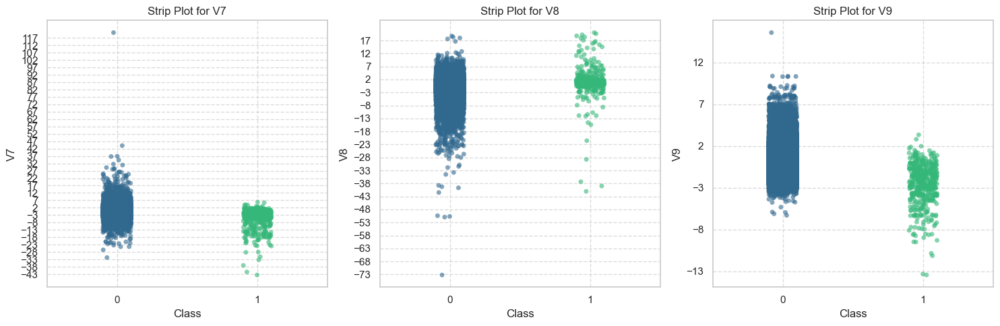

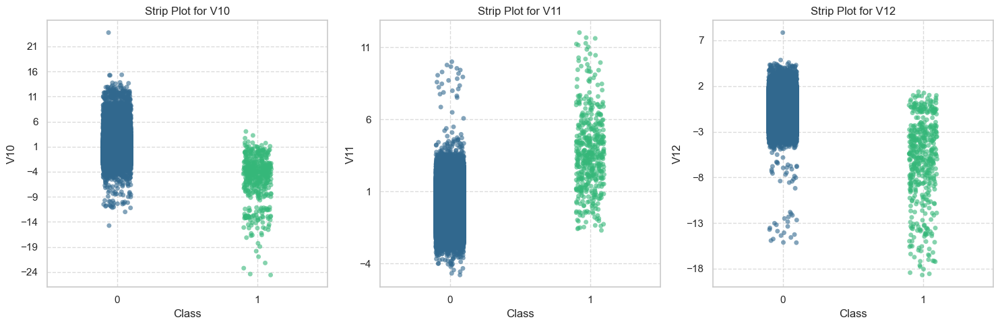

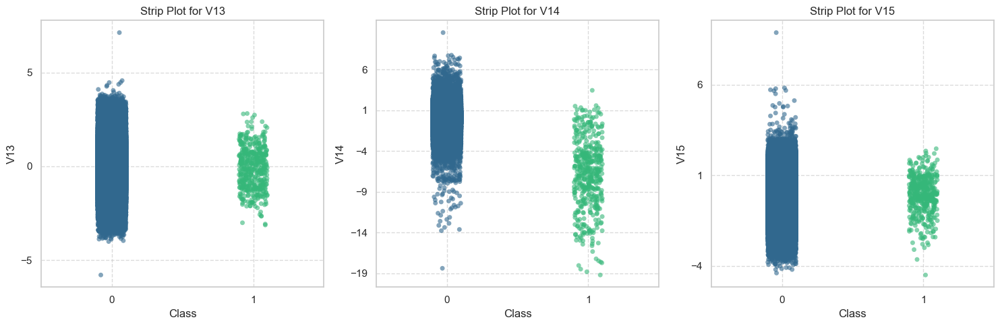

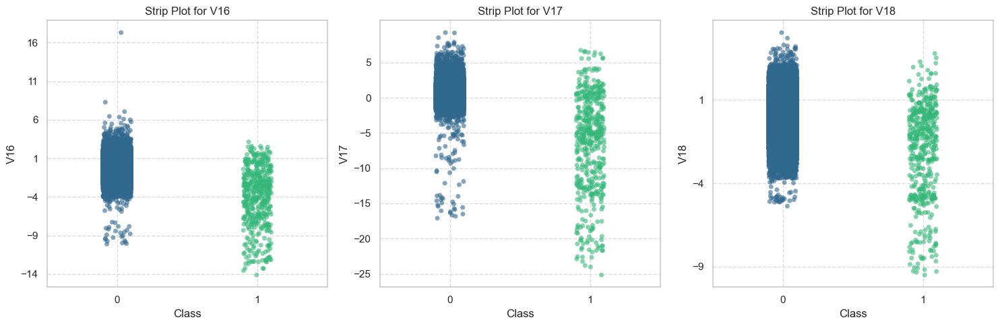

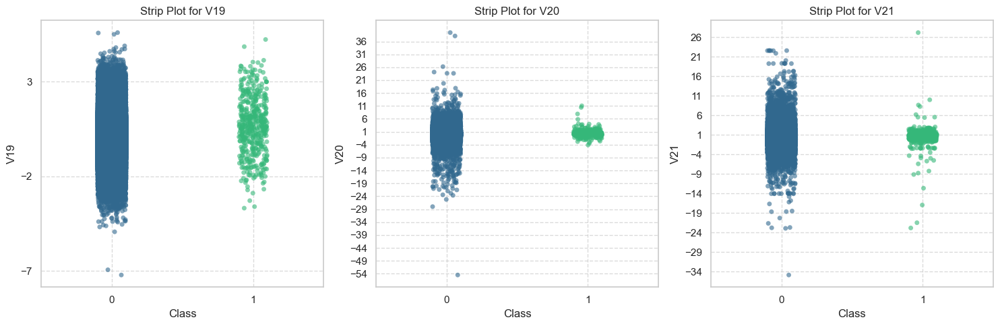

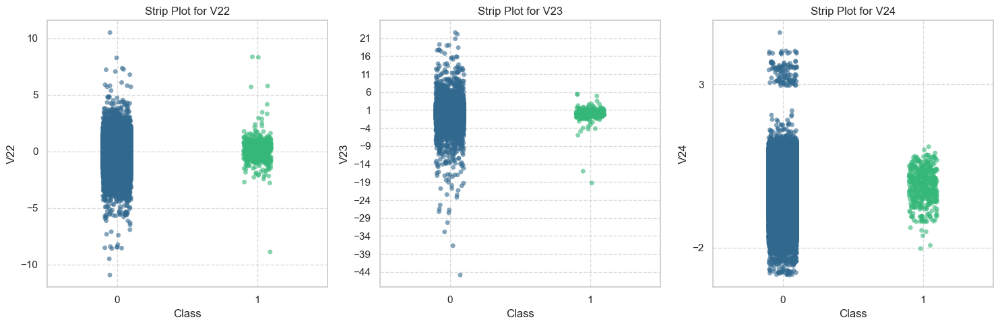

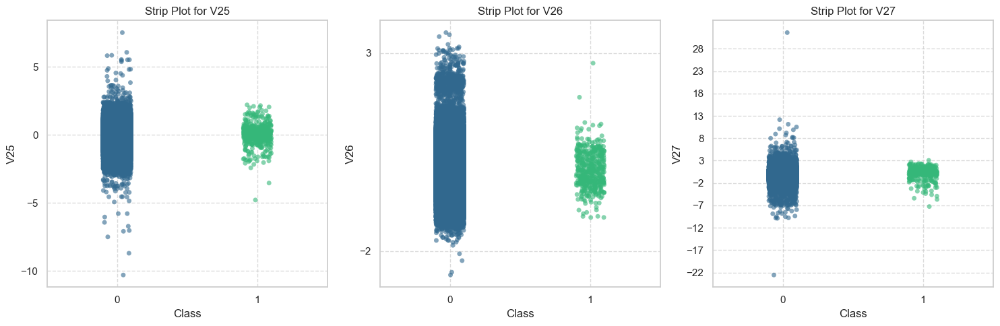

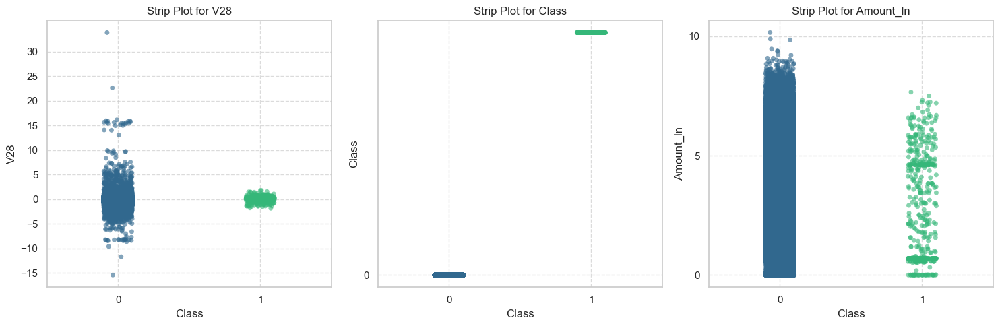

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns
numerical_cols = df.select_dtypes(include= "number" ).columns

# Set the style and context for seaborn
sns.set(style="whitegrid")
sns.set_context("notebook", rc={"lines.linewidth": 2.5})

# Create strip plots for each numerical column
plt.figure(figsize=(15, 5))
for i, col in enumerate(numerical_cols):
    if i % 3 == 0:
        plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, i % 3 + 1)
    sns.stripplot(x= "Class" , y=col, data=df, palette="viridis", alpha=0.6)
    plt.title(f"Strip Plot for {col}" )
    plt.yticks(range(int(df[col].min()), int(df[col].max()) + 1, 5))  # Set y ticks for each 5 units
    plt.grid(True, linestyle= "--" , alpha=0.7)
    if i % 3 == 2 or i == len(numerical_cols) - 1:
        plt.tight_layout()
        plt.show()


In [40]:
# Assuming your dataset is named  df 
conditions = (
    (df[ "V1" ] < -36) |
    (df[ "V2" ] < -42) |
    ((df[ "V3" ] < -18) | (df["V3" ] > 7)) |
    (df[ "V4" ] > 15) |
    (df[ "V5" ] < -43) |
    (df[ "V6" ] > 29) |
    (df[ "V7" ] > 45) |
    (df[ "V8" ] < -38) |
    (df[ "V9" ] > 12) |
    (df[ "V10" ] > 16) |
    (df[ "V11" ] > 6) |
    (df[ "V12" ] < -7) |
    ((df[ "V13" ] < -5) | (df["V13" ] > 5)) |
    (df[ "V14" ] < -10) |
    (df[ "V15" ] > 6) |
    (df[ "V16" ] > 10) |
    (df[ "V20" ] < -30) |
    (df[ "V23" ] < -25) |
    ((df[ "V25" ] > 5) | (df[ "V25" ] < -5)) |
    ((df[ "V27" ] < -13) | (df[ "V27" ] > 7)) |
    (df[ "V28" ] > 20)
)

# Assuming conditions is defined as mentioned in your question
# Assuming df is your DataFrame

# Identify rows to delete based on conditions and Class == 0
rows_to_delete = df[(conditions) & (df["Class"] == 0)].index

# Delete rows from the DataFrame
df_filtered = df.drop(rows_to_delete)

# # Reset index if needed
# df_filtered.reset_index(drop=True, inplace=True)


In [41]:
print("Orignial shape:", df.shape)

print("Filtered shape:", df_filtered.shape)
print("-----------------------")
print("Orignial target distribution:\n", df["Class"].value_counts())
print("Filtered target distribution:\n", df_filtered["Class"].value_counts())
print("-----------------------")

print("The deleted observations per calss:",df["Class"].value_counts() -  df_filtered["Class"].value_counts())


Orignial shape: (275663, 30)
Filtered shape: (275572, 30)
-----------------------
Orignial target distribution:
 Class
0    275190
1       473
Name: count, dtype: int64
Filtered target distribution:
 Class
0    275099
1       473
Name: count, dtype: int64
-----------------------
The deleted observations per calss: Class
0    91
1     0
Name: count, dtype: int64


<Figure size 1500x500 with 0 Axes>

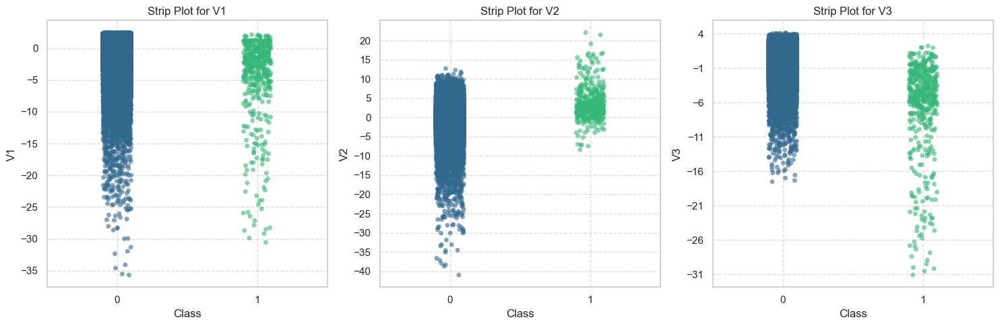

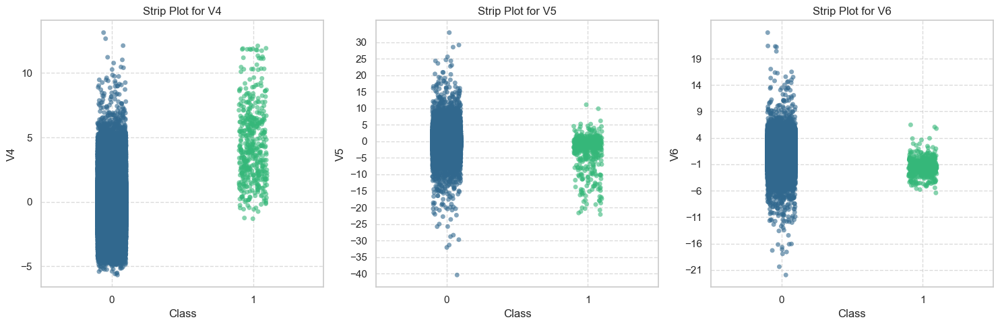

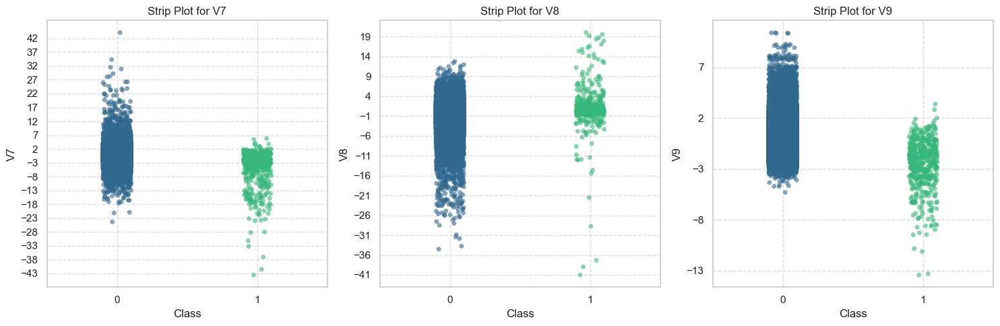

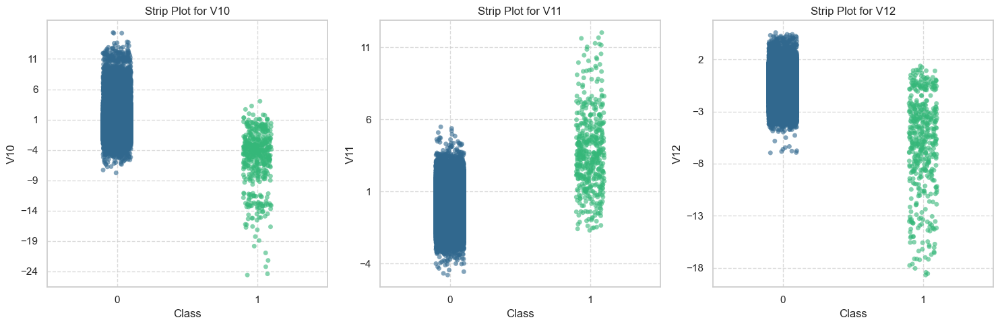

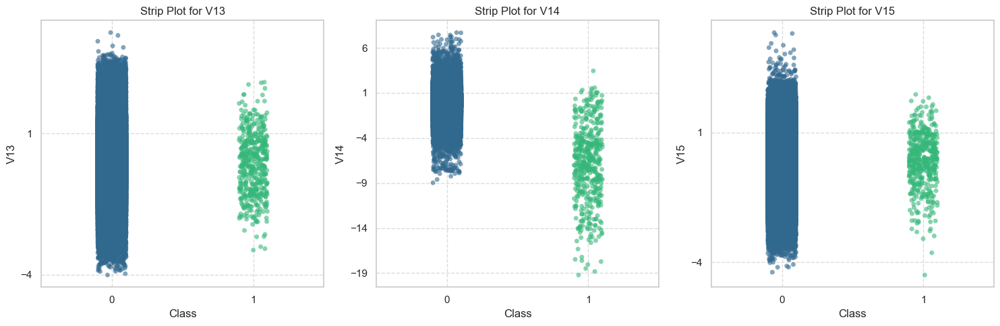

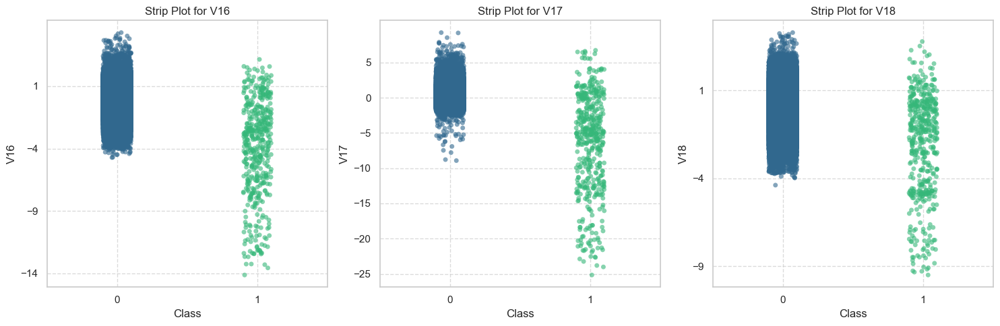

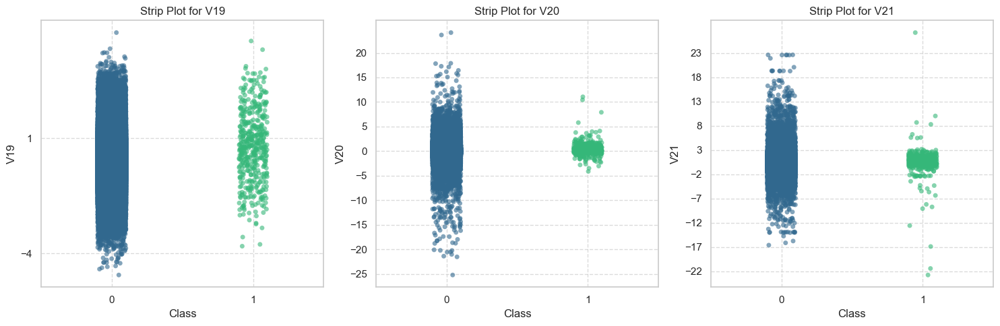

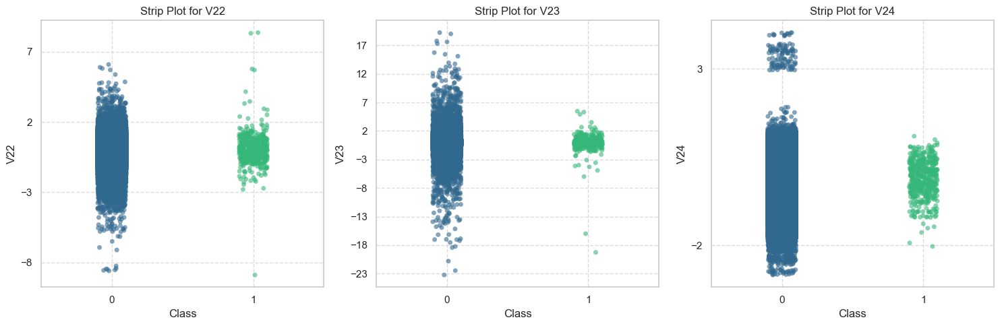

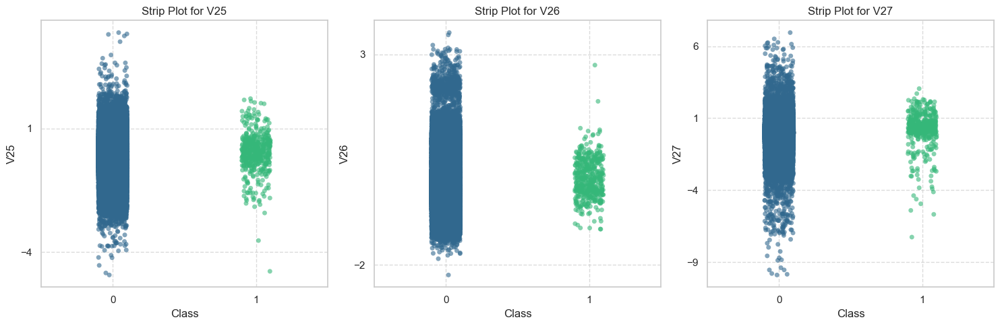

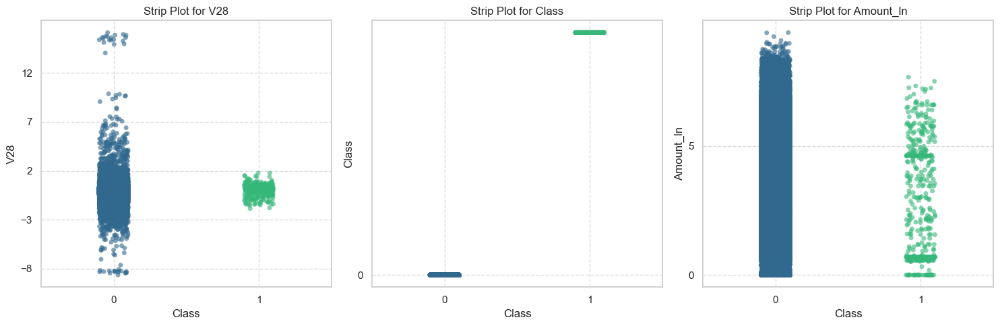

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns
numerical_cols = df.select_dtypes(include= "number" ).columns

# Set the style and context for seaborn
sns.set(style="whitegrid")
sns.set_context("notebook", rc={"lines.linewidth": 2.5})

# Create strip plots for each numerical column
plt.figure(figsize=(15, 5))
for i, col in enumerate(numerical_cols):
    if i % 3 == 0:
        plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, i % 3 + 1)
    sns.stripplot(x= "Class" , y=col, data=df_filtered, palette="viridis", alpha=0.6)
    plt.title(f"Strip Plot for {col}" )
    plt.yticks(range(int(df_filtered[col].min()), int(df_filtered[col].max()) + 1, 5))  # Set y ticks for each 5 units
    plt.grid(True, linestyle= "--" , alpha=0.7)
    if i % 3 == 2 or i == len(numerical_cols) - 1:
        plt.tight_layout()
        plt.show()


In [43]:
trial = df.copy()
#trial

The PCA transformation has already removed most of the outliers. PCA is a dimensionality reduction technique that preserves as much of the variance in the data as possible.
<br>
This means that the principal components will capture the most important features of the data, while outliers are often less important. As a result, the PCA transformation may already remove most of the outliers from the data.

---
---


## 2. Data Preprocessing

#### Train - Test Split

In [44]:
df = df_filtered

In [45]:
df.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Class', 'Amount_ln'],
      dtype='object')

In [46]:
#Splitting the data to X and y
X = df.drop( "Class" , axis=1)
y = df.Class

In [47]:
#Seeing the shape of X and y
print( "Shape of X: " , X.shape)
print( "Shape of y: " , y.shape)

Shape of X:  (275572, 29)
Shape of y:  (275572,)


In [48]:
#Seed value
s = 101
#Splitting value
t = 0.2

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=t, stratify=y, random_state=s)

In [50]:
#Seeing the shape of X_train and X_test
print( "X_train shape:"  , X_train.shape)
print(" X_test shape:"  , X_test.shape)
print(" y_train shape:"  , y_train.shape)
print(" y_test shape: " , y_test.shape)

X_train shape: (220457, 29)
 X_test shape: (55115, 29)
 y_train shape: (220457,)
 y_test shape:  (55115,)


## Train-Test Validation Checks
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_train_test_validation.html

In [51]:
train_ds = Dataset(X_train, label=y_train)
test_ds = Dataset(X_test, label=y_test)

deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.
deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.


In [52]:
from deepchecks.tabular.suites import train_test_validation

validation_suite = train_test_validation()
suite_result = validation_suite.run(train_ds, test_ds)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_MREI43M0EKME6RE9MREQAO4ON">Train Test Validat…

#### Scaling

In [53]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()


In [54]:
df["Amount_ln"]

0         5.014760
1         1.305626
2         5.939276
3         4.824306
4         4.262539
            ...   
284802    0.570980
284803    3.249987
284804    4.232366
284805    2.397895
284806    5.384495
Name: Amount_ln, Length: 275572, dtype: float64

In [55]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [56]:
X_train_scaled

array([[ 0.89562163, -0.15136746, -0.2847194 , ...,  0.30164317,
        -0.3907966 , -0.87613637],
       [ 0.57122164,  0.37303015, -0.29272397, ...,  0.14892799,
         0.19305595, -1.04451308],
       [-0.57662247, -0.42924287,  0.5812175 , ...,  0.82249004,
        -0.1713234 ,  0.48736081],
       ...,
       [-0.12499316, -0.11261856,  0.14640637, ...,  1.0632909 ,
         0.0909064 , -0.18098739],
       [-1.44096209,  1.80955776,  0.02202326, ...,  0.22654507,
         2.21395285,  0.16714397],
       [-1.18000047, -1.42375575, -1.29317973, ...,  1.34423625,
        -1.24835687,  1.00525827]])

---
---


## 3. Model Building
It was previously stated that you need to make class prediction with four different algorithms. As in this case, different approaches are required to obtain better performance on unbalanced data.

This dataset is severely **unbalanced** (most of the transactions are non-fraud). So the algorithms are much more likely to classify new observations to the majority class and high accuracy won t tell us anything. To address the problem of imbalanced dataset, we can use undersampling and oversampling or class weight and optimum thresold techniques.

In [57]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)

    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [58]:
scoring = {
    "precision_Fraud": make_scorer(
        precision_score, average=None, labels=[1]
    ),
    "recall_Fraud": make_scorer(recall_score, average=None, labels=[1]),
    "f1_Fraud": make_scorer(f1_score, average=None, labels=[1]),
    "AP_Fraud": make_scorer(average_precision_score, average=None, pos_label=1)
}

In [59]:
# For resampling"

under_class0 = int(y_train.value_counts()[0] - (0.2 * y.value_counts()[0]))
over_class1 = int(y_train.value_counts()[1] + (0.2 * y.value_counts()[1]))


over = SMOTE(sampling_strategy={1:over_class1})
under = RandomUnderSampler(sampling_strategy={0: under_class0})

steps = [( "over" , over), ( "under" , under)]

pipeline = imbpipeline(steps=steps)

X_resampled_lg, y_resampled_lg = pipeline.fit_resample(X_train_scaled, y_train)

### Logistic Regression

- The steps you are going to cover for this algorithm are as follows:

   *i. Import Libraries*
   
   *ii. Model Training*
   
   *iii. Prediction and Model Evaluating and Tuning*
   
   *iv. Plot Precision and Recall Curve*

***i. Import Libraries***

In [60]:
from sklearn.linear_model import LogisticRegression

-------------------
**Vanilla LR**

***ii. Model Training***

In [62]:
# Building logistic model without class weight
logistic = LogisticRegression(random_state=s)
#Fitting the model with train data
logistic.fit(X_train_scaled, y_train)

LogisticRegression(random_state=101)

***iii. Prediction and Model Evaluating  and Tuning***

In [63]:
#Seeing the evaluation of the model
eval_metric(logistic, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[55016     4]
 [   17    78]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.95      0.82      0.88        95

    accuracy                           1.00     55115
   macro avg       0.98      0.91      0.94     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[220065     14]
 [    89    289]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220079
           1       0.95      0.76      0.85       378

    accuracy                           1.00    220457
   macro avg       0.98      0.88      0.92    220457
weighted avg       1.00      1.00      1.00    220457




You re evaluating "accuracy score"? Is your performance metric reflect real success? You may need to use different metrics to evaluate performance on unbalanced data. You should use **[precision and recall metrics](https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#:~:text=The%20precision%2Drecall%20curve%20shows,a%20low%20false%20negative%20rate.)**.

***iv. Plot Precision and Recall Curve***


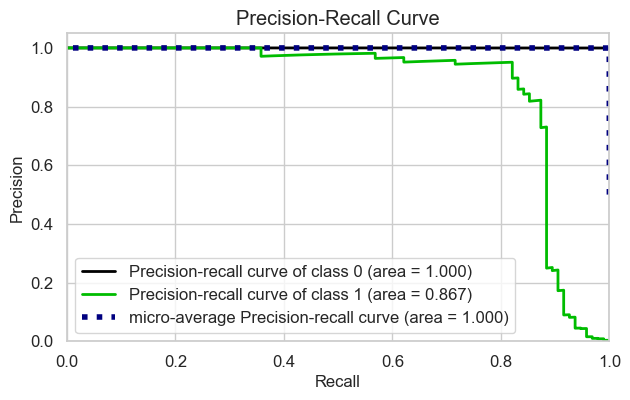

In [64]:
from scikitplot.metrics import plot_roc, plot_precision_recall

# Get the predicted probabilities for the test data
y_proba = logistic.predict_proba(X_test_scaled)
plot_precision_recall(y_test, y_proba)
plt.show();

-------------------
**CrossValidation LR**

***ii. Model Training***

In [67]:
#
logistic = LogisticRegression(random_state=s)

from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5


scores = cross_validate(
    logistic, X_train_scaled, y_train, scoring=scoring, cv=skf, return_train_score=True, n_jobs=-1
)
df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()



fit_time                 2.429312
score_time               0.161411
test_precision_Fraud     0.944075
train_precision_Fraud    0.950034
test_recall_Fraud        0.764667
train_recall_Fraud       0.767862
test_f1_Fraud            0.844552
train_f1_Fraud           0.849244
test_AP_Fraud            0.722840
train_AP_Fraud           0.729969
dtype: float64

-------------------
**GridSearch LR**

***ii. Model Training***

In [68]:
# Define an objective (scoring)
recall_Fraud = make_scorer(recall_score, average=None, labels=[1])


# Grid
param_grid = {
    "C": [0.01 , 0.1, 1, 10],
    "penalty": ["l1", "l2"],
    "solver": ["liblinear", "lbfgs", "saga"],
}

logistic_g = LogisticRegression(max_iter=1000, random_state=s)


grid_LR = HalvingGridSearchCV(logistic_g, param_grid, n_jobs=-1,  return_train_score=True, cv=5)


grid_LR.fit(X_train_scaled, y_train)

HalvingGridSearchCV(estimator=LogisticRegression(max_iter=1000,
                                                 random_state=101),
                    n_jobs=-1,
                    param_grid={'C': [0.01, 0.1, 1, 10],
                                'penalty': ['l1', 'l2'],
                                'solver': ['liblinear', 'lbfgs', 'saga']})

***iii. Prediction and Model Evaluating  and Tuning***

In [69]:
eval_metric(grid_LR, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[55016     4]
 [   17    78]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.95      0.82      0.88        95

    accuracy                           1.00     55115
   macro avg       0.98      0.91      0.94     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[220065     14]
 [    88    290]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220079
           1       0.95      0.77      0.85       378

    accuracy                           1.00    220457
   macro avg       0.98      0.88      0.93    220457
weighted avg       1.00      1.00      1.00    220457



In [70]:
print(grid_LR.best_params_)
print(grid_LR.best_score_)


{'C': 10, 'penalty': 'l2', 'solver': 'saga'}
0.999528242016672


In [75]:
# Create the table that has all folds results
overfit = pd.DataFrame(grid_LR.cv_results_)

# create a new column that has the difference between mean training and testing scores of a combination
# Then, round it to 3 digits
overfit["diff"] = round(abs(overfit["mean_test_score"] -  overfit["mean_train_score"]),3)

# We don t want time or std or a spicific fold score, so wi will filter our columns
# Then, we will sort the values based on the best scores
df_overfit = overfit.loc[
   :,["params","mean_test_score", "mean_train_score", "std_train_score", "diff", "rank_test_score"]
].sort_values("rank_test_score")
df_overfit.head(10)

,params,mean_test_score,mean_train_score,std_train_score,diff,rank_test_score
9,"{'C': 0.1, 'penalty': 'l2', 'solver': 'libline...",0.999633,0.999500,0.000082,0.0,1
15,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}",0.999633,0.999592,0.000046,0.0,1
11,"{'C': 0.1, 'penalty': 'l2', 'solver': 'saga'}",0.999633,0.999592,0.000085,0.0,3
16,"{'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.999592,0.999612,0.000041,0.0,4
12,"{'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}",0.999592,0.999592,0.000046,0.0,4
14,"{'C': 1, 'penalty': 'l1', 'solver': 'saga'}",0.999592,0.999592,0.000072,0.0,4
10,"{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.999592,0.999602,0.000050,0.0,7
17,"{'C': 1, 'penalty': 'l2', 'solver': 'saga'}",0.999551,0.999582,0.000060,0.0,8
23,"{'C': 10, 'penalty': 'l2', 'solver': 'saga'}",0.999551,0.999582,0.000060,0.0,8
20,"{'C': 10, 'penalty': 'l1', 'solver': 'saga'}",0.999551,0.999582,0.000060,0.0,8


In [76]:
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)

#
logistic = LogisticRegression(random_state=s, C = 0.1, penalty =  l2 , solver =  liblinear )

scores = cross_validate(
    logistic, X_train_scaled, y_train, scoring=scoring, cv=skf, return_train_score=True, n_jobs=-1
)
df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()


fit_time                 5.193909
score_time               0.179661
test_precision_Fraud     0.969926
train_precision_Fraud    0.969618
test_recall_Fraud        0.764702
train_recall_Fraud       0.759930
test_f1_Fraud            0.854560
train_f1_Fraud           0.852017
test_AP_Fraud            0.742154
train_AP_Fraud           0.737265
dtype: float64

In [77]:
rec_lg = df_scores.mean()[2:][2]
f1_lg = df_scores.mean()[2:][4]
AP_lg = df_scores.mean()[2:][6]

In [78]:
print(rec_lg, f1_lg, AP_lg)

0.7647017543859649 0.8545599005287883 0.7421539522444096



You re evaluating "accuracy score"? Is your performance metric reflect real success? You may need to use different metrics to evaluate performance on unbalanced data. You should use **[precision and recall metrics](https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#:~:text=The%20precision%2Drecall%20curve%20shows,a%20low%20false%20negative%20rate.)**.

***iv. Plot Precision and Recall Curve***


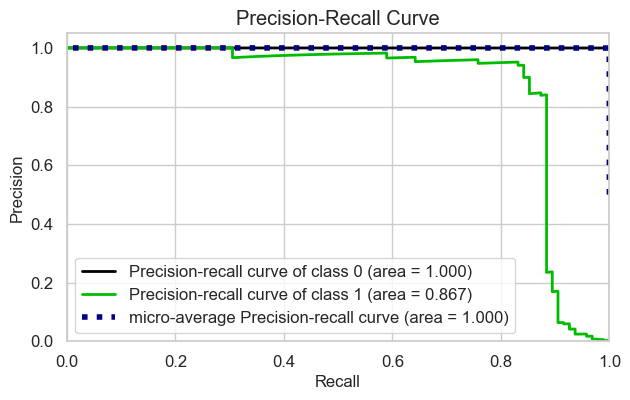

In [79]:
from scikitplot.metrics import plot_roc, plot_precision_recall
from sklearn.metrics import average_precision_score

log_m = LogisticRegression(random_state=s, C = 10, penalty =  l1 , solver =  saga )

log_m.fit(X_train_scaled, y_train)


# Get the predicted probabilities for the test data
y_proba = log_m.predict_proba(X_test_scaled)
plot_precision_recall(y_test, y_proba)
plt.show();

In [80]:
y_pred = log_m.predict(X_test_scaled)
y_pred_proba = log_m.predict_proba(X_test_scaled)


rec_lg = recall_score(y_test, y_pred, labels = [1], average = None)
f1_lg = f1_score(y_test, y_pred, labels = [1], average = None)
AP_lg = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)

In [81]:
import pickle
# To save a pipeline using pickle
pickle.dump(log_m, open("LR_model", "wb"))

--------------
Thresholding trial

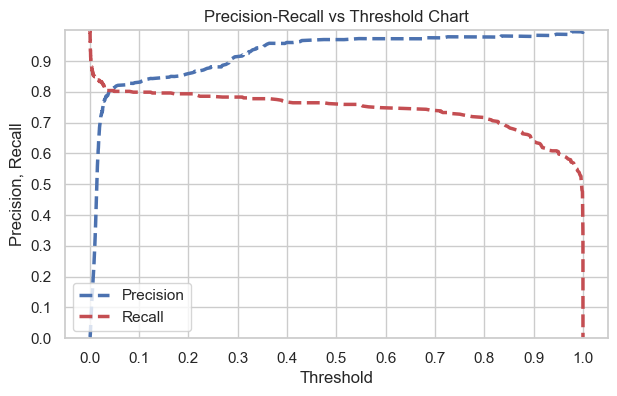

In [83]:
### Predict test_y values and probabilities based on fitted logistic regression model

y_proba = log_m.predict_proba(X_train_scaled)
probs_y= y_proba
  # probs_y is a 2-D array of probability of being labeled as 0 (first   column of   array) vs 1 (2nd column in array)

from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_train, probs_y[:, 1])
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.ylabel("Precision, Recall")
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.yticks(np.arange(0, 1, step=0.1))

plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])
plt.grid(True)

In [84]:
from sklearn.metrics import confusion_matrix

#
# logistic_r = LogisticRegression(random_state=s, C = 10, penalty =  l1 , solver =  saga )

# logistic_r.fit(X_train_scaled, y_train)

y_proba = log_m.predict_proba(X_train_scaled)


# eval_metric(logistic_r, X_train_scaled, y_train, X_test_scaled, y_test)

# Assuming y_proba[:, 1] contains the predicted probabilities of the positive class
thresholds = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4, 0.45, 0.5]  # Set your desired thresholds here

for threshold in thresholds:
    y_pred_thresholded = (y_proba[:, 1] > threshold).astype(int)

    # Create confusion matrix
    cm = confusion_matrix(y_train, y_pred_thresholded)

    print(f"Confusion Matrix for Threshold {threshold}:\n")
    print(cm)
    print("Total missclassified:", cm[0][1] + cm[1][0])
    print("\n")

Confusion Matrix for Threshold 0.1:

[[220018     61]
 [    76    302]]
Total missclassified: 137


Confusion Matrix for Threshold 0.15:

[[220025     54]
 [    77    301]]
Total missclassified: 131


Confusion Matrix for Threshold 0.2:

[[220030     49]
 [    78    300]]
Total missclassified: 127


Confusion Matrix for Threshold 0.25:

[[220039     40]
 [    82    296]]
Total missclassified: 122


Confusion Matrix for Threshold 0.3:

[[220052     27]
 [    82    296]]
Total missclassified: 109


Confusion Matrix for Threshold 0.4:

[[220067     12]
 [    89    289]]
Total missclassified: 101


Confusion Matrix for Threshold 0.45:

[[220070      9]
 [    89    289]]
Total missclassified: 98


Confusion Matrix for Threshold 0.5:

[[220070      9]
 [    91    287]]
Total missclassified: 100




In [85]:
print( ---------------------------- )
print( Test )
print( ---------------------------- )
y_pred = (log_m.predict(X_test_scaled) > .45).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print( ---------------------------- )
print( Train )
print( ---------------------------- )
y_pred_train = (log_m.predict(X_train_scaled) > .45).astype("int32")
print(confusion_matrix(y_train, y_pred_train))
print(classification_report(y_train, y_pred_train))

----------------------------
Test
----------------------------
[[55016     4]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.95      0.81      0.87        95

    accuracy                           1.00     55115
   macro avg       0.98      0.91      0.94     55115
weighted avg       1.00      1.00      1.00     55115

----------------------------
Train
----------------------------
[[220070      9]
 [    91    287]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220079
           1       0.97      0.76      0.85       378

    accuracy                           1.00    220457
   macro avg       0.98      0.88      0.93    220457
weighted avg       1.00      1.00      1.00    220457



- Didn t the performance of the model you implemented above satisfy you? If your model is biased towards the majority class and minority class matrics is not sufficient, apply "unbalanced data tecniques".

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [62]:
logistic_ev = LogisticRegression(random_state=s, C = 10, penalty =  'l1' , solver =  'saga' )

logistic_ev.fit(X_train_scaled, y_train)

LogisticRegression(C=10, penalty='l1', random_state=101, solver='saga')

In [63]:
y_train

245135    0
124184    0
176791    0
42708     0
261454    0
         ..
59530     0
20681     0
96582     0
151111    0
245521    0
Name: Class, Length: 220457, dtype: int64

In [64]:
trying = pd.DataFrame(X_train_scaled, index = y_train.index, columns = X_train.columns)
trying

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount_ln
245135,0.895622,-0.151367,-0.284719,0.687325,-0.159895,0.293704,-0.523854,0.259582,0.575326,0.459190,...,-0.582424,-0.201207,-0.255940,1.043642,-0.849454,-0.588569,-1.503128,0.301643,-0.390797,-0.876136
124184,0.571222,0.373030,-0.292724,0.713913,0.231042,-0.360089,0.122034,-0.182793,-0.198537,-0.301769,...,-0.079228,0.007752,-0.040713,-0.506811,-0.180203,1.033197,-0.469479,0.148928,0.193056,-1.044513
176791,-0.576622,-0.429243,0.581218,-1.711358,-0.796883,-0.526307,-0.412303,0.646990,-1.710281,0.393571,...,0.015691,-0.119830,-0.103882,-0.485783,-0.020113,1.042874,-0.122500,0.822490,-0.171323,0.487361
42708,-1.790078,2.275844,-0.950592,-0.799362,-1.847472,-1.012696,-1.635641,5.086730,-0.117176,-0.031982,...,-0.670224,0.486641,-0.196381,1.272641,0.637882,0.004846,1.313172,-5.900992,-2.740317,-0.627459
261454,-0.604210,0.772279,-0.176537,-0.494480,0.202088,-0.724267,1.460537,-0.512279,-0.144879,-1.167203,...,-0.157743,0.314670,0.483481,-2.016957,-0.033391,1.892077,-0.066148,-1.678671,-2.667730,0.763062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59530,0.647507,-0.814787,-0.322302,-0.964020,-0.560560,-0.185535,-0.443041,-0.462655,-1.900465,1.654716,...,-0.130198,-1.029470,-1.119777,-0.094313,-0.733079,0.576823,-0.646676,-0.115076,0.009075,0.595713
20681,0.618712,0.217041,-0.150181,0.304141,0.172684,-0.199836,0.060342,-0.387205,0.043053,-0.209462,...,0.155345,-0.768213,-0.903613,0.049999,-0.808979,0.536267,0.364286,-0.132786,0.079602,-0.988284
96582,-0.124993,-0.112619,0.146406,-1.533447,-0.715582,-0.380505,-0.583406,0.659561,-1.651842,0.947309,...,-0.840984,-0.375720,-0.234561,-0.059445,-0.694698,-0.152846,-0.515739,1.063291,0.090906,-0.180987
151111,-1.440962,1.809558,0.022023,-0.159797,-0.765404,1.171883,-2.088523,-11.296112,2.163277,-0.127923,...,-4.366884,15.331510,-1.076757,2.099889,-0.325286,-0.217246,-0.138250,0.226545,2.213953,0.167144


In [65]:
trying2 = pd.DataFrame(X_test_scaled, index = y_test.index, columns = X_train.columns)
trying2

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount_ln
150240,-2.049535,-2.865625,0.881902,-1.719478,1.419161,1.575163,-0.754163,0.978759,4.035789,-2.117060,...,-3.093987,-1.245213,1.215428,6.210049,-1.239875,2.388813,-0.910193,1.999324,3.299520,0.452170
138517,-1.046913,0.891395,-0.088807,-0.494532,0.747534,1.024256,0.283989,1.238604,0.096549,-0.292971,...,-1.814494,0.091006,-0.186273,-1.134597,-2.211663,0.782650,-1.040460,-7.816345,-1.424435,-0.110280
282036,-0.017625,-0.174187,-0.110716,-1.340410,0.202686,1.796138,-0.893989,1.925996,-0.672750,-0.008906,...,-0.189941,1.784358,1.887214,-0.400073,-1.151605,-0.456236,0.325343,-0.215425,-0.701198,-0.180987
58933,-0.342923,0.793823,0.715630,0.095660,-0.415476,-0.601536,0.168061,0.439276,-0.447717,-0.562239,...,-0.178204,0.211876,0.007269,0.122160,0.884434,-0.312765,0.373240,-1.312279,-0.111775,-0.427837
145202,0.969652,-0.510235,-0.998683,-1.216090,-0.137976,-0.770131,-0.045531,-0.562365,1.743855,-1.036180,...,-0.490855,0.577762,0.987122,-0.460285,-0.369557,0.851389,-0.873358,0.184750,-0.651799,-1.246389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76267,0.596491,0.334918,-0.421910,0.569682,0.033175,-1.056648,0.234915,-0.486967,0.093198,-0.574544,...,-0.296907,-0.351360,-0.486952,-0.168365,0.241022,0.763080,0.752336,-0.256650,0.208375,-1.097598
75767,-0.137707,0.719524,0.644927,0.109228,-0.090150,-0.791403,0.560347,-0.163864,-0.218008,-0.401791,...,0.360685,-0.539508,-0.643918,0.144332,0.766093,-0.346257,0.191603,1.442499,0.661167,-0.790170
139410,0.520278,0.062957,0.172298,0.941322,-0.204147,-0.083862,0.050580,-0.128062,0.259318,-0.043281,...,-0.292784,-0.104239,-0.013994,-0.079143,0.469774,0.899440,-0.486946,0.207903,0.079982,0.047230
47866,-0.646246,-0.411700,1.033267,-1.308189,-0.758966,1.426574,0.391328,1.394843,1.224150,-1.907902,...,0.927669,1.332944,1.198029,1.148863,-0.949402,0.368120,-0.861751,1.954603,0.976642,0.964828


In [66]:
train_ds = Dataset(trying, label=y_train)
test_ds = Dataset(trying2, label=y_test)

from deepchecks.tabular.suites import model_evaluation

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, logistic_ev)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.
deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_AM8AEDNIFBFW3M4AB0FBJHBQL">Model Evaluation S…

### Logistic Regression with Unbalanced Data Techniques

***i. Train-Test Split (Again)***

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=t, stratify=y, random_state=s)

In [92]:
# import numpy as np

# def calculate_cost_matrix(y_true, inverse_class_distribution):
#   """
#   Calculates a cost matrix based on the inverse class distribution.

#   Args:
#     y_true: A NumPy array of true class labels.
#     inverse_class_distribution: A NumPy array of the inverse class distribution.

#   Returns:
#     A NumPy array representing the cost matrix.
#   """

#   # Get the number of classes
#   num_classes = len(np.unique(y_true))

#   # Create an empty cost matrix
#   cost_matrix = np.zeros((num_classes, num_classes))

#   # Fill the cost matrix with inverse class distribution values
#   for i in range(num_classes):
#     for j in range(num_classes):
#       if i != j:
#         cost_matrix[i, j] = inverse_class_distribution[i]

#   return cost_matrix

# # Example usage
# y_true = np.array([0, 1, 0, 1, 2, 0, 1, 2])
# class_counts = np.bincount(y_true)
# inverse_class_distribution = 1 / class_counts

# cost_matrix = calculate_cost_matrix(y_true, inverse_class_distribution)

# print("Cost matrix:")
# print(cost_matrix)

In [93]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.utils.class_weight import compute_class_weight

# # Import your cost matrix
# cost_matrix =   # Your calculated cost matrix

# # Calculate class weights based on the cost matrix
# class_weights = compute_class_weight(class_weight= balanced ,
#                                     classes=np.unique(y_true),
#                                     y=y_true)

# # Define and train the Logistic Regression model with cost-sensitive weights
# model = LogisticRegression(class_weight=class_weights)
# model.fit(X_train, y_train)

# # Make predictions on new data
# predictions = model.predict(X_test)

## LG SMOTE Tech

In [94]:
#pip install imbalanced-learn

In [68]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

-----
Start Exploring resampling 

In [ ]:
# X_over_s, y_over = over.fit_resample(X_train_scaled, y_train)

In [ ]:
# y_train.value_counts()

In [ ]:
# y_over.value_counts()

In [ ]:
# X_under_s, y_under = under.fit_resample(X_train_scaled, y_train)

In [ ]:
# y_train.value_counts()

In [ ]:
# y_under.value_counts()

End Exploring resampling 

----------------------------


In [69]:
under_class0 = int(y_train.value_counts()[0] - (0.2 * y.value_counts()[0]))
over_class1 = int(y_train.value_counts()[1] + (0.2 * y.value_counts()[1]))


over = SMOTE(sampling_strategy={1:over_class1})
under = RandomUnderSampler(sampling_strategy={0: under_class0})



In [71]:
steps = [( 'over' , over), ( 'under' , under)]

pipeline = imbpipeline(steps=steps)

X_resampled_lg, y_resampled_lg = pipeline.fit_resample(X_train_scaled, y_train)

In [72]:
print("Original X_train distribution:", y_train.value_counts())
print("---------------------")
print("Resampled X_train distribution:", y_resampled_lg.value_counts())


Original X_train distribution: Class
0    220079
1       378
Name: count, dtype: int64
---------------------
Resampled X_train distribution: Class
0    165059
1       472
Name: count, dtype: int64


**LR SMOTE  Vanilla**

In [73]:
lg_model_smote =  LogisticRegression(random_state=s)

lg_model_smote.fit(X_resampled_lg, y_resampled_lg)

LogisticRegression(random_state=101)

In [109]:
#Seeing the evaluation of the model
eval_metric(lg_model_smote, X_resampled_lg, y_resampled_lg, X_test_scaled, y_test)

Test_Set
[[55012     8]
 [   16    79]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.91      0.83      0.87        95

    accuracy                           1.00     55115
   macro avg       0.95      0.92      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165036     23]
 [   104    368]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       0.94      0.78      0.85       472

    accuracy                           1.00    165531
   macro avg       0.97      0.89      0.93    165531
weighted avg       1.00      1.00      1.00    165531



**OVerfitted**

------------------
**LR SMOTE  CV**

In [110]:
model_scor_lg =  LogisticRegression(random_state=s)

skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5

scores = cross_validate(
    model_scor_lg, X_resampled_lg, y_resampled_lg, scoring=scoring, cv=skf, n_jobs=-1, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]

test_precision_Fraud     0.943562
train_precision_Fraud    0.942423
test_recall_Fraud        0.777671
train_recall_Fraud       0.780200
test_f1_Fraud            0.852008
train_f1_Fraud           0.853637
test_AP_Fraud            0.734480
train_AP_Fraud           0.735944
dtype: float64

In [102]:
## With 10000, 100000
# test_precision_Fraud     0.979893
# train_precision_Fraud    0.979899
# test_recall_Fraud        0.906500
# train_recall_Fraud       0.906750
# test_f1_Fraud            0.941765
# train_f1_Fraud           0.941906

In [111]:
rec_lg_def_s = df_scores.mean()[2:][2]
f1_lg_def_s = df_scores.mean()[2:][4]
AP_lg_def_s = df_scores.mean()[2:][6]

In [112]:
print(rec_lg_def_s)

0.7776707726763719


--------------------------
**LR SMOTE HalvingGS**

In [114]:
# Define an objective (scoring)
recall_Fraud = make_scorer(recall_score, average=None, labels=[1])


# Grid
param_grid = {
    "C": [0.01 , 0.1, 1, 10],
    "penalty": ["l1", "l2"],
    "solver": ["liblinear", "lbfgs", "saga"],
}

logistic_gs = LogisticRegression(max_iter=1000, random_state=s)


grid_LRS = HalvingGridSearchCV(logistic_gs, param_grid,  n_jobs=-1,  return_train_score=True, verbose=2, random_state=s)


grid_LRS.fit(X_resampled_lg, y_resampled_lg)

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 18392
max_resources_: 165531
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 24
n_resources: 18392
Fitting 5 folds for each of 24 candidates, totalling 120 fits
----------
iter: 1
n_candidates: 8
n_resources: 55176
Fitting 5 folds for each of 8 candidates, totalling 40 fits
----------
iter: 2
n_candidates: 3
n_resources: 165528
Fitting 5 folds for each of 3 candidates, totalling 15 fits


HalvingGridSearchCV(estimator=LogisticRegression(max_iter=1000,
                                                 random_state=101),
                    n_jobs=-1,
                    param_grid={'C': [0.01, 0.1, 1, 10],
                                'penalty': ['l1', 'l2'],
                                'solver': ['liblinear', 'lbfgs', 'saga']},
                    random_state=101, verbose=2)

In [115]:
#Seeing the evaluation of the model
eval_metric(grid_LRS, X_resampled_lg, y_resampled_lg, X_test_scaled, y_test)

Test_Set
[[55015     5]
 [   17    78]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.94      0.82      0.88        95

    accuracy                           1.00     55115
   macro avg       0.97      0.91      0.94     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165046     13]
 [   105    367]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       0.97      0.78      0.86       472

    accuracy                           1.00    165531
   macro avg       0.98      0.89      0.93    165531
weighted avg       1.00      1.00      1.00    165531



In [118]:
grid_LRS.best_score_
grid_LRS.best_params_


{'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}

In [ ]:
model_scor_lg =  LogisticRegression(random_state=s, C=0.1, penalty="l2", solver= "liblinear")

skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5

scores = cross_validate(
    model_scor_lg, X_resampled_lg, y_resampled_lg, scoring=scoring, cv=skf, n_jobs=-1, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]

In [117]:
lg_def_smote =  LogisticRegression(random_state=s).fit(X_resampled_lg, y_resampled_lg)

***ii. Model Training***

***Prediction and Model Evaluating and Tuning***

***iv.  Plot Precision and Recall Curve***


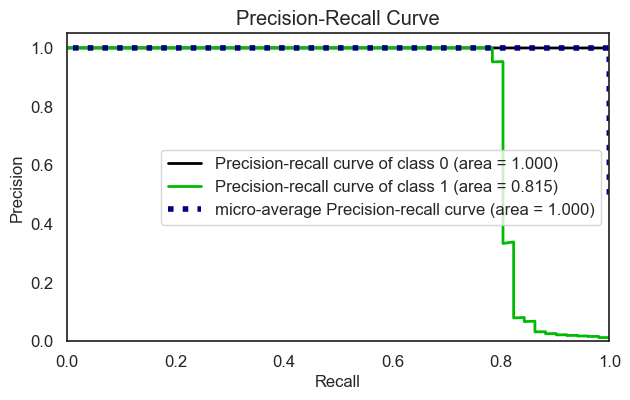

In [139]:
# Get the predicted probabilities for the test data
y_proba = lg_def_smote.predict_proba(X_test_scaled)
plot_precision_recall(y_test, y_proba)
plt.show();

In [140]:
y_pred = lg_def_smote.predict(X_test_scaled)
y_pred_proba = lg_def_smote.predict_proba(X_test_scaled)


rec_lg_def_s = recall_score(y_test, y_pred, labels = [1], average = None)
f1_lg_def_s = f1_score(y_test, y_pred, labels = [1], average = None)
AP_lg_def_s = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)

In [141]:
print(rec_lg_def_s, f1_lg_def_s, AP_lg_def_s)

[0.76470588] [0.86666667] 0.8154944275665065


In [142]:
import pickle
# To save a pipeline using pickle
pickle.dump(lg_def_smote, open("LR_model_smote_d", "wb"))

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [74]:
trying_s = pd.DataFrame(X_resampled_lg, index = y_resampled_lg.index, columns = X_train.columns)
trying_s

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount_ln
0,0.958935,-0.037566,-1.185057,0.149049,0.532765,-0.532562,0.423568,-0.602157,0.012206,0.433718,...,-0.500858,0.404029,0.482835,0.055926,1.005342,0.503496,1.250573,-0.761345,-0.750764,-1.097598
1,-0.659159,0.418472,0.724995,-0.809006,-0.277905,-0.140460,0.847003,0.609040,-0.157855,-1.776945,...,0.449164,0.097035,-0.383239,0.373710,-0.113082,0.912144,-1.088204,-0.869925,-0.093653,0.776550
2,0.521181,-0.156124,0.572680,0.786280,-0.727957,0.324101,-0.682177,0.508050,0.672986,0.085640,...,-0.355211,0.009488,0.043106,0.026935,0.347941,0.509762,-0.642347,0.358173,0.107362,-0.336963
3,0.964535,-0.761152,-0.306246,-0.504450,-0.892230,-0.279861,-0.974956,-0.102970,-0.071758,0.986735,...,0.167532,0.997397,1.079019,0.452843,0.104854,-0.298868,-0.102025,0.023251,-0.501050,-0.069052
4,-0.117155,0.915460,0.504802,1.509918,0.776005,0.632620,0.712530,0.036381,-0.452977,0.411540,...,0.086506,0.106500,0.203365,-0.470043,-0.508666,-0.361256,0.317758,0.515503,0.808200,0.013866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165526,-1.687003,3.291594,-4.777555,3.564691,-2.517991,-1.301333,-4.001897,3.818642,-2.504713,-7.344641,...,0.587073,3.112766,0.923178,-0.075157,-0.570016,-0.687923,-0.067672,2.082619,-2.504075,0.253638
165527,-0.870863,-0.129279,-1.531205,2.329312,-2.691632,0.594521,0.635135,1.090749,-2.211863,-2.799864,...,6.159264,2.708356,0.361373,5.979709,0.210912,0.345055,1.225509,0.538740,1.123321,1.441489
165528,0.517043,0.851565,-0.788148,1.342853,0.650252,-0.752730,0.304577,-0.239483,0.016203,-2.046636,...,0.110921,-0.774592,-0.636394,-0.290138,-0.043669,0.945775,-0.479016,0.621103,0.865077,-1.044513
165529,-0.190109,0.773389,0.527859,0.421154,0.264132,-0.473788,0.741963,-0.408128,-0.159665,-0.791850,...,-0.071920,0.353528,0.434006,-0.728371,0.505594,-0.021092,-0.324617,-1.046660,-0.875077,-0.409801


In [75]:
train_ds = Dataset(trying_s, label=y_resampled_lg)
test_ds = Dataset(trying2, label=y_test)

from deepchecks.tabular.suites import model_evaluation

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, logistic_ev)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.
deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_IYRCTHLOEY0TW7GRNQER06L4R">Model Evaluation S…

### Random Forest Classifier with Unbalanced Data Techniques
   

***i. Model Training***

#### Vanila

In [61]:
#Creating a vanila random forest model without class weight
rf =  RandomForestClassifier(random_state=s)
#Fitting the model with the train data
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=101)

In [62]:
#Seeing the evaluation of the model
eval_metric(rf, X_train, y_train, X_test, y_test)
#From this we can see that there is overfitting situation for the class 1 or it is becasue it is not balanced so
#we got this result, i am going to try class weight balanced and see.

Test_Set
[[55016     4]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.95      0.79      0.86        95

    accuracy                           1.00     55115
   macro avg       0.97      0.89      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[220079      0]
 [     0    378]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220079
           1       1.00      1.00      1.00       378

    accuracy                           1.00    220457
   macro avg       1.00      1.00      1.00    220457
weighted avg       1.00      1.00      1.00    220457



------------
**RF  CV**

In [64]:
from sklearn.model_selection import StratifiedKFold

In [65]:
#Creating crossvalidation to the model
model = RandomForestClassifier(random_state=s)

skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5


scores = cross_validate(
    model, X_train, y_train, scoring=scoring, cv=skf, n_jobs=-1, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]
#From this result, we can notice that there is overfitting

test_precision_Fraud     0.954110
train_precision_Fraud    1.000000
test_recall_Fraud        0.770035
train_recall_Fraud       0.999340
test_f1_Fraud            0.851459
train_f1_Fraud           0.999669
test_AP_Fraud            0.735228
train_AP_Fraud           0.999341
dtype: float64

-------------------
**RF  HalvingGS**

In [68]:
recall_Fraud = make_scorer(recall_score, average=None, labels=[1])


# Grid
param_grid = {'n_estimators':[50, 64,100],
             'max_features':[2, 4, 'sqrt'],
             'max_depth':[3, 5, 7, 8],
             'min_samples_split':[2, 3, 4],
             'min_samples_leaf': [2, 3, 4]
             }

rf_gr = RandomForestClassifier(random_state=s)


grid_rfm = HalvingGridSearchCV(rf_gr, param_grid, random_state=s, scoring=recall_Fraud, return_train_score=True)


grid_rfm.fit(X_train, y_train)

HalvingGridSearchCV(estimator=RandomForestClassifier(random_state=101),
                    param_grid={'max_depth': [3, 5, 7, 8],
                                'max_features': [2, 4, 'sqrt'],
                                'min_samples_leaf': [2, 3, 4],
                                'min_samples_split': [2, 3, 4],
                                'n_estimators': [50, 64, 100]},
                    random_state=101,
                    scoring=make_scorer(recall_score, average=None, labels=[1]))

In [69]:
#Seeing the evaluation of the model
eval_metric(grid_rfm, X_train, y_train, X_test, y_test)
#We can see the same situation here, there is overfitting situation as well.

Test_Set
[[55017     3]
 [   24    71]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.96      0.75      0.84        95

    accuracy                           1.00     55115
   macro avg       0.98      0.87      0.92     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[220074      5]
 [    95    283]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220079
           1       0.98      0.75      0.85       378

    accuracy                           1.00    220457
   macro avg       0.99      0.87      0.92    220457
weighted avg       1.00      1.00      1.00    220457



In [70]:
grid_rfm.best_params_

{'max_depth': 5,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 50}

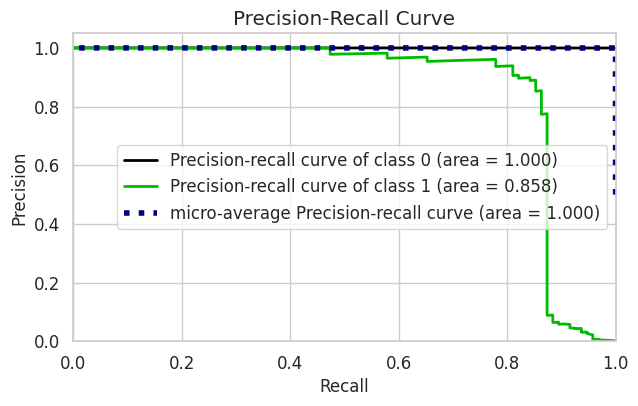

In [71]:
rf_m = RandomForestClassifier(random_state=s, max_depth= 5,max_features= 'sqrt',min_samples_leaf=2, min_samples_split= 3 ,n_estimators= 50)

rf_m.fit(X_train, y_train)


# Get the predicted probabilities for the test data
y_proba = rf_m.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [72]:
y_pred = rf_m.predict(X_test)
y_pred_proba = rf_m.predict_proba(X_test)


rec_rf = recall_score(y_test, y_pred, labels = [1], average = None)
f1_rf = f1_score(y_test, y_pred, labels = [1], average = None)
AP_rf = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)

In [74]:
rec_rf = df_scores.mean()[2:][2]
f1_rf = df_scores.mean()[2:][4]
AP_rf = df_scores.mean()[2:][6]

In [75]:
print(rec_rf, f1_rf, AP_rf)

0.7142456140350877 0.8231456018481721 0.6943611144678052


In [76]:
import pickle
# To save a pipeline using pickle
pickle.dump(rf_m, open("RF_model", "wb"))

---------------------------
**RF SMOTE Vanilla**

In [76]:
under_class0 = int(y_train.value_counts()[0] - (0.2 * y.value_counts()[0]))
over_class1 = int(y_train.value_counts()[1] + (0.2 * y.value_counts()[1]))

In [77]:
over = SMOTE(sampling_strategy={1:over_class1 })
under = RandomUnderSampler(sampling_strategy={0: under_class0})

In [78]:
steps = [('under', under),('over', over)]
pipeline = imbpipeline(steps=steps)

In [79]:
X_resampled_rf,y_resampled_rf = pipeline.fit_resample(X_train_scaled, y_train)

In [80]:
# # Using same resampled data that was used in SMOTE logistic regression
# X_resampled_rf = X_resampled_lg
# y_resampled_rf =  y_resampled_lg

In [81]:
rf_model_smote =  RandomForestClassifier(random_state=s, n_jobs=-1)

rf_model_smote.fit(X_resampled_rf, y_resampled_rf)

RandomForestClassifier(n_jobs=-1, random_state=101)

In [83]:
#Seeing the evaluation of the model
eval_metric(rf_model_smote, X_resampled_rf, y_resampled_rf, X_test, y_test)

Test_Set
[[55014     6]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.93      0.81      0.87        95

    accuracy                           1.00     55115
   macro avg       0.96      0.91      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165059      0]
 [     0    472]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       1.00      1.00      1.00       472

    accuracy                           1.00    165531
   macro avg       1.00      1.00      1.00    165531
weighted avg       1.00      1.00      1.00    165531



------------------
**RF SMOTE CV**

In [72]:
model_scor =  RandomForestClassifier(random_state=s)

skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5
scores = cross_validate(
    model_scor, X_resampled_rf, y_resampled_rf, scoring=scoring, cv=skf, n_jobs=-1, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]

test_precision_Fraud     0.958086
train_precision_Fraud    1.000000
test_recall_Fraud        0.790459
train_recall_Fraud       1.000000
test_f1_Fraud            0.865518
train_f1_Fraud           1.000000
test_AP_Fraud            0.759359
train_AP_Fraud           1.000000
dtype: float64

In [85]:
rec_rf_def = df_scores.mean()[2:][2]
f1_lrf_def = df_scores.mean()[2:][4]
AP_rf_def = df_scores.mean()[2:][6]

------------------
**RF SMOTE HalvingGS**

In [86]:
recall_Fraud = make_scorer(recall_score, average=None, labels=[1])


# Grid
param_grid = {'n_estimators':[50, 64,100],
             'max_features':[2, 4, 'sqrt'],
             'max_depth':[3, 5, 7, 8],
             'min_samples_split':[2, 3, 4],
             'min_samples_leaf': [2, 3, 4]}

model_rf_g = RandomForestClassifier(random_state=s)



grid_rf_s = HalvingGridSearchCV(model_rf_g, param_grid, random_state=s, scoring=recall_Fraud, return_train_score=True, n_jobs=-1)


grid_rf_s.fit(X_resampled_rf, y_resampled_rf)

HalvingGridSearchCV(estimator=RandomForestClassifier(random_state=101),
                    n_jobs=-1,
                    param_grid={'max_depth': [3, 5, 7, 8],
                                'max_features': [2, 4, 'sqrt'],
                                'min_samples_leaf': [2, 3, 4],
                                'min_samples_split': [2, 3, 4],
                                'n_estimators': [50, 64, 100]},
                    random_state=101,
                    scoring=make_scorer(recall_score, average=None, labels=[1]))

In [87]:
#Seeing the evaluation of the model
eval_metric(grid_rf_s, X_resampled_rf, y_resampled_rf, X_test, y_test)

Test_Set
[[55015     5]
 [   21    74]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.94      0.78      0.85        95

    accuracy                           1.00     55115
   macro avg       0.97      0.89      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165055      4]
 [   108    364]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       0.99      0.77      0.87       472

    accuracy                           1.00    165531
   macro avg       0.99      0.89      0.93    165531
weighted avg       1.00      1.00      1.00    165531



In [ ]:
# Create the table that has all folds results
overfit1 = pd.DataFrame(grid_rf_s.cv_results_)

# create a new column that has the difference between mean training and testing scores of a combination
# Then, round it to 3 digits
overfit1["diff"] = round(abs(overfit1["mean_test_score"] -  overfit1["mean_train_score"]),3)

# We don't want time or std or a spicific fold score, so wi will filter our columns
# Then, we will sort the values based on the best scores
df_overfit = overfit1.loc[
   :,["params","mean_test_score", "mean_train_score", "diff", "rank_test_score", "std_test_score"]
].sort_values("rank_test_score")
df_overfit

,params,mean_test_score,mean_train_score,diff,rank_test_score,std_test_score
241,"{'max_depth': 7, 'max_features': 'sqrt', 'min_...",0.94,0.939394,0.001,1,0.04899
215,"{'max_depth': 7, 'max_features': 4, 'min_sampl...",0.94,0.945455,0.005,1,0.04899
214,"{'max_depth': 7, 'max_features': 4, 'min_sampl...",0.94,0.939394,0.001,1,0.04899
213,"{'max_depth': 7, 'max_features': 4, 'min_sampl...",0.94,0.927273,0.013,1,0.04899
212,"{'max_depth': 7, 'max_features': 4, 'min_sampl...",0.94,0.945455,0.005,1,0.04899
...,...,...,...,...,...,...
16,"{'max_depth': 3, 'max_features': 2, 'min_sampl...",0.84,0.812121,0.028,473,0.10198
14,"{'max_depth': 3, 'max_features': 2, 'min_sampl...",0.84,0.812121,0.028,473,0.10198
13,"{'max_depth': 3, 'max_features': 2, 'min_sampl...",0.84,0.812121,0.028,473,0.10198
20,"{'max_depth': 3, 'max_features': 2, 'min_sampl...",0.84,0.818182,0.022,473,0.10198


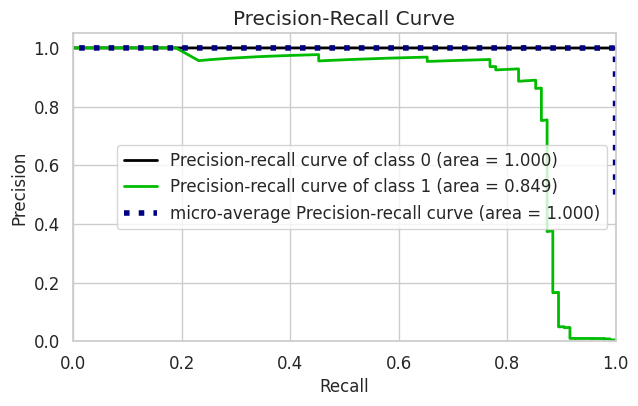

In [90]:
rf_model = RandomForestClassifier(random_state=s, max_depth= 7,max_features= 'sqrt',min_samples_leaf=2, min_samples_split= 4 ,n_estimators= 100)

rf_model.fit(X_resampled_rf, y_resampled_rf)


# Get the predicted probabilities for the test data
y_proba = rf_model.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [91]:
y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)


rec_rf_s = recall_score(y_test, y_pred, labels = [1], average = None)
f1_rf_s = f1_score(y_test, y_pred, labels = [1], average = None)
AP_rf_s= average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)

In [74]:
rec_rf_s = df_scores.mean()[2:][2]
f1_rf_s = df_scores.mean()[2:][4]
AP_rf_s = df_scores.mean()[2:][6]

In [75]:
print(rec_rf_s, f1_rf_s, AP_rf_s)

0.7838745800671892 0.8636537502270543 0.7554040871344686


In [76]:
import pickle
# To save a pipeline using pickle
pickle.dump(rf_model, open("RF_model_s", "wb"))

NameError: name 'rf_model' is not defined

In [83]:
rf_defalut = RandomForestClassifier(random_state=s).fit(X_resampled_rf, y_resampled_rf)

In [84]:
#Seeing the evaluation of the model
eval_metric(rf_defalut, X_resampled_rf, y_resampled_rf, X_test, y_test)

Test_Set
[[55016     4]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.95      0.79      0.86        95

    accuracy                           1.00     55115
   macro avg       0.97      0.89      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165059      0]
 [     0    472]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       1.00      1.00      1.00       472

    accuracy                           1.00    165531
   macro avg       1.00      1.00      1.00    165531
weighted avg       1.00      1.00      1.00    165531



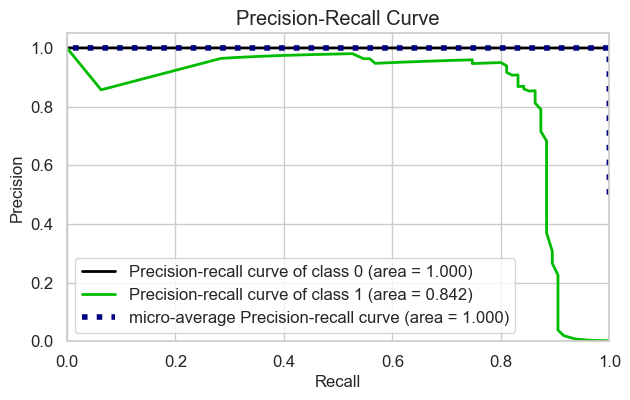

In [85]:
#Seeing the plot
y_proba = rf_defalut.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [86]:
y_pred = rf_defalut.predict(X_test)
y_pred_proba = rf_defalut.predict_proba(X_test)


rec_rf_def = recall_score(y_test, y_pred, labels = [1], average = None)
f1_lrf_def = f1_score(y_test, y_pred, labels = [1], average = None)
AP_rf_def = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)

In [87]:
print(rec_rf_def, f1_lrf_def, AP_rf_def)

[0.78947368] [0.86206897] 0.8422420253800792


In [88]:
import pickle
# To save a pipeline using pickle
pickle.dump(rf_defalut, open("RF_model_def", "wb"))

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [91]:
trying_s = pd.DataFrame(X_resampled_rf, index = y_resampled_rf.index, columns = X_train.columns)
trying_s

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount_ln
0,-0.198998,0.428266,0.033344,0.181253,-0.154171,-0.022633,-0.010063,0.719455,-1.410596,0.834894,...,-0.872621,0.418556,0.957088,-0.558919,-0.017450,-0.333273,-0.301673,2.248793,1.226253,-0.068062
1,0.035087,0.729277,-0.383108,-0.364723,0.885976,-0.290135,0.843843,-0.322556,-0.004209,-0.657641,...,0.296275,-0.727175,-0.758837,0.340169,0.366209,-0.596683,0.302149,0.565317,0.497466,-0.563445
2,-0.617670,0.237467,1.139640,0.230422,0.676696,0.346808,0.015689,-1.311635,-0.032912,-0.304408,...,-0.914387,1.842680,0.028610,-1.219443,0.258232,0.819880,-0.588940,0.128351,-1.531699,-1.044513
3,0.907423,-0.340630,-0.380400,0.144714,-0.137840,0.558299,-0.668116,0.254232,0.932183,0.063470,...,-0.160983,0.599945,0.800596,0.313422,0.421013,-0.055690,-0.329651,0.210943,-0.399096,-0.336963
4,0.936026,-0.878711,-0.510067,-0.653382,-0.512393,0.396451,-0.949103,0.179234,-0.075682,0.927593,...,0.618021,0.078422,-0.185955,0.967824,0.165939,-0.704834,-0.798527,-0.071092,-0.363739,0.476847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165526,-1.130786,3.504659,-3.322147,3.442120,1.272963,-1.772057,-2.822830,-2.710471,-3.977447,-6.621400,...,2.831125,-1.144212,0.160051,-4.268231,-0.670511,0.548599,0.771167,4.692390,4.578012,-1.053413
165527,-1.245631,2.935104,-4.664320,2.677059,-3.731140,-3.409374,-8.218049,3.634206,-2.625571,-13.406391,...,4.674391,4.906723,0.265835,-1.024826,0.440120,1.312989,-0.682247,13.249072,7.984109,-1.065401
165528,-1.008036,0.614035,-2.641054,1.117918,-0.977964,-1.766249,-1.193447,1.487395,-1.487230,-5.346336,...,2.870567,1.792088,-0.297760,0.975286,-0.372638,0.372291,1.374921,2.880490,0.056307,1.084639
165529,-1.139095,2.619535,-2.279007,3.448095,-2.311800,-0.951922,-5.059089,3.572890,-3.817191,-6.102370,...,3.078465,2.980466,-0.126187,0.121359,-0.103700,-0.519802,0.189318,7.244591,4.594200,-0.852986


In [92]:
train_ds = Dataset(trying_s, label=y_resampled_rf)
test_ds = Dataset(X_test, label=y_test)

from deepchecks.tabular.suites import model_evaluation

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, rf_defalut)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.
deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_55WMP2G5RXXGU06CXH9UYXUGE">Model Evaluation S…

In [103]:
fe = df.copy()
fe = fe.drop('Class', axis=1)
fe.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount_ln
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,5.014760
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,1.305626
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,5.939276
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,4.824306
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,4.262539


In [104]:
features = fe.columns
features

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount_ln'],
      dtype='object')

In [105]:
rf_model = RandomForestClassifier(random_state=s).fit(X_resampled_rf, y_resampled_rf)
rf_feature_imp = pd.DataFrame(data=rf_model.feature_importances_,
                              index = features,
                              columns=["Feature Importance"])

rf_feature_imp = rf_feature_imp.sort_values("Feature Importance", ascending=False)
rf_feature_imp

,Feature Importance
V17,0.167556
V12,0.164836
V14,0.143160
V10,0.100534
V16,0.068100
V11,0.066861
V4,0.028559
V9,0.026026
V7,0.024461
V18,0.024164


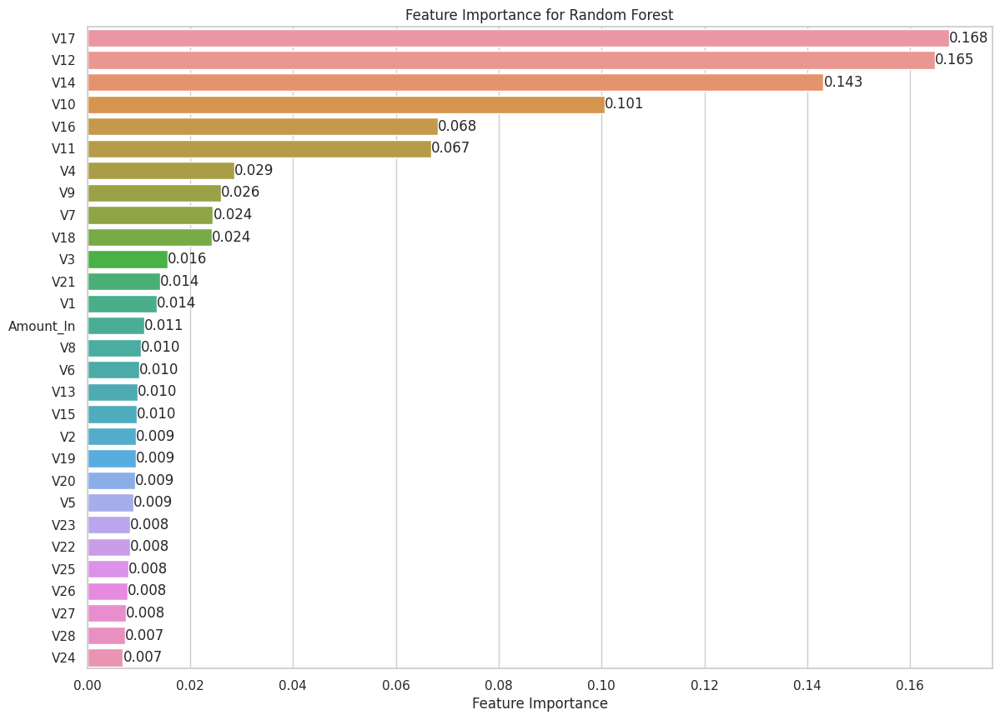

In [106]:
#Plotting the feature importance
plt.figure(figsize=(14, 10), dpi=100)
ax = sns.barplot(x=rf_feature_imp["Feature Importance"],
                 y=rf_feature_imp.index)

ax.bar_label(ax.containers[0],fmt="%.3f")
plt.title("Feature Importance for Random Forest")
plt.show()


***ii. Prediction and Model Evaluating and Tuning***

***iii. Plot Precision and Recall Curve***


***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

### XGBoost Classifier with Unbalanced Data Techniques

***i. Model Training***

In [62]:
# # Initialize an XGBoost classifier with random state and n_jobs
# XGB = XGBClassifier(random_state=s, n_jobs=1)

# XGB.fit(X_train, y_train)

In [277]:
# eval_metric(XGB, X_train, y_train, X_test, y_test)

Test_Set
[[32436     0]
 [   11    35]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     32436
           1       1.00      0.76      0.86        46

    accuracy                           1.00     32482
   macro avg       1.00      0.88      0.93     32482
weighted avg       1.00      1.00      1.00     32482


Train_Set
[[129743      0]
 [     0    182]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    129743
           1       1.00      1.00      1.00       182

    accuracy                           1.00    129925
   macro avg       1.00      1.00      1.00    129925
weighted avg       1.00      1.00      1.00    129925



In [278]:
# # Initialize an XGBoost classifier with random state and n_jobs
# XGB = XGBClassifier(random_state=s, n_jobs=1)

# # Perform 10-fold cross-validation with return_train_score=True
# scores = cross_validate(XGB, X_train, y_train, scoring=scoring, cv=10, return_train_score=True)

# # Convert the scores dictionary to a Pandas DataFrame
# df_scores = pd.DataFrame(scores, index=range(1, 11))

# # Calculate and print the mean of all scoring metrics across folds
# df_scores.mean()


fit_time                 40.443773
score_time                0.065498
test_precision_Fraud      1.000000
train_precision_Fraud     1.000000
test_recall_Fraud         0.862573
train_recall_Fraud        1.000000
test_f1_Fraud             0.925596
train_f1_Fraud            1.000000
test_AP_Fraud             0.862766
train_AP_Fraud            1.000000
dtype: float64

In [279]:
# param_grid = {
#     "n_estimators":np.arange(3,201, step=1),           # Integer
#     "max_depth":np.arange(3,11, step=1),               # Integer
#     "learning_rate": np.arange(0.001,3, step=0.05),    # float
#     "subsample":np.arange(0.5,1, step=0.1),            # float
#     "colsample_bytree": np.arange(0.3, 1, step=0.05),  # float
#     "reg_alpha": np.arange(0, 1, step=0.1),            # float
#     "gamma": np.arange(0, 11,step=0.5),                # float
# }

In [ ]:
# # explicitly require this experimental feature
# from sklearn.experimental import enable_halving_search_cv # noqa
# # now you can import normally from model_selection
# from sklearn.model_selection import HalvingRandomSearchCV

# # Define objective (scoring metric)
# recall_Fraud = make_scorer(recall_score, average=None, labels=[1])

# # Initialize an XGBoost classifier with random state and n_jobs
# XGB = XGBClassifier(random_state=s, n_jobs=-1)

# # Perform Halving Randomized Search CV with recall for fraud as scoring metric
# HRS_XGB = HalvingRandomSearchCV(XGB, param_grid, return_train_score=True, scoring = recall_Fraud, verbose=2)

# # Fit the Halving Randomized Search CV on the training data
# grid_XGB = HRS_XGB.fit(X_train, y_train)

n_iterations: 8
n_required_iterations: 8
n_possible_iterations: 8
min_resources_: 20
max_resources_: 129925
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 6496
n_resources: 20
Fitting 5 folds for each of 6496 candidates, totalling 32480 fits
[CV] END colsample_bytree=0.6499999999999999, gamma=0.0, learning_rate=2.9010000000000002, max_depth=10, n_estimators=41, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.0, learning_rate=2.9010000000000002, max_depth=10, n_estimators=41, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.0, learning_rate=2.9010000000000002, max_depth=10, n_estimators=41, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.0, learning_rate=2.9010000000000002, max_depth=10, n_estimators=41, reg_

In [ ]:
# eval_metric(grid_XGB, X_train, y_train, X_test, y_test)

In [ ]:
# print(grid_XGB.best_params_)
# print(grid_XGB.best_score_)

In [ ]:
# # Create the table that has all folds results
# overfit = pd.DataFrame(grid_XGB.cv_results_)

# # create a new column that has the difference between mean training and testing scores of a combination
# # Then, round it to 3 digits
# overfit["diff"] = round(abs(overfit["mean_test_score"] -  overfit["mean_train_score"]),3)

# # We don t want time or std or a spicific fold score, so wi will filter our columns
# # Then, we will sort the values based on the best scores
# df_overfit = overfit.loc[
#    :,["params","mean_test_score", "mean_train_score", "diff", "rank_test_score"]
# ].sort_values("diff")

In [ ]:
# #
# df_overfit.to_csv( df_overfit_svm.csv , index=False)

In [ ]:
# df_overfit.query( diff< 1 ).sort_values("rank_test_score").head(10)

In [ ]:
# ### Predict test_y values and probabilities based on fitted logistic regression model
# XGB = XGBClassifier(random_state=s, n_jobs=1, subsample= 0.7999999999999999, reg_alpha= 0.0, n_estimators= 90,
#                     max_depth= 4, learning_rate= 0.051000000000000004, gamma= 6.5, colsample_bytree= 0.7)

# XGB.fit(X_train, y_train)

# y_proba = XGB.predict_proba(X_train)
# probs_y= y_proba
#   # probs_y is a 2-D array of probability of being labeled as 0 (first   column of   array) vs 1 (2nd column in array)

# from sklearn.metrics import precision_recall_curve
# precision, recall, thresholds = precision_recall_curve(y_train, probs_y[:, 1])
#    #retrieve probability of being 1(in second column of probs_y)
# pr_auc = auc(recall, precision)

# plt.title("Precision-Recall vs Threshold Chart")
# plt.plot(thresholds, precision[: -1], "b--", label="Precision")
# plt.plot(thresholds, recall[: -1], "r--", label="Recall")
# plt.ylabel("Precision, Recall")
# plt.xticks(np.arange(0, 1.1, step=0.1))
# plt.yticks(np.arange(0, 1, step=0.1))

# plt.xlabel("Threshold")
# plt.legend(loc="lower left")
# plt.ylim([0,1])
# plt.grid(True)

In [ ]:
# from sklearn.metrics import confusion_matrix

# #
# XGB = XGBClassifier(random_state=s, n_jobs=1, subsample= 0.7999999999999999, reg_alpha= 0.0, n_estimators= 90,
#                     max_depth= 4, learning_rate= 0.051000000000000004, gamma= 6.5, colsample_bytree= 0.7)

# XGB.fit(X_train, y_train)

# y_proba = XGB.predict_proba(X_train)


# # eval_metric(logistic_r, X_train_scaled, y_train, X_test_scaled, y_test)

# # Assuming y_proba[:, 1] contains the predicted probabilities of the positive class
# thresholds = [0.05, 0.1, 0.2]  # Set your desired thresholds here

# for threshold in thresholds:
#     y_pred_thresholded = (y_proba[:, 1] > threshold).astype(int)

#     # Create confusion matrix
#     cm = confusion_matrix(y_train, y_pred_thresholded)

#     print(f"Confusion Matrix for Threshold {threshold}:\n")
#     print(cm)
#     print("Total missclassified:", cm[0][1] + cm[1][0])
#     print("\n")

In [ ]:
# print( ---------------------------- )
# print( Test )
# print( ---------------------------- )
# y_pred = (XGB.predict(X_test) > .2).astype("int32")
# print(confusion_matrix(y_test, y_pred))
# print(classification_report(y_test, y_pred))

# print( ---------------------------- )
# print( Train )
# print( ---------------------------- )
# y_pred_train = (XGB.predict(X_train) > .2).astype("int32")
# print(confusion_matrix(y_train, y_pred_train))
# print(classification_report(y_train, y_pred_train))

In [ ]:
# # equalizes or approximates minority classes to the majority class.
# from imblearn.over_sampling import SMOTE

# # equalizes or converges the majority class to the minority class
# from imblearn.under_sampling import RandomUnderSampler
# from imblearn.pipeline import Pipeline as imbpipeline

# over = SMOTE(sampling_strategy={1: 10000})
# under = RandomUnderSampler(sampling_strategy={0: 100000})

In [ ]:
# y_train.value_counts()

In [ ]:
# steps = [("o", over), ("u", under)]


# pipeline = imbpipeline(steps=steps)

# # First the number of hispanic cals will be increased to 1000 as per our instruction,
# # and then the white class will be reduced to 2500.
# X_resampled_XGB, y_resampled_XGB = pipeline.fit_resample(X_train, y_train)

In [ ]:
y_resampled_XGB.value_counts()

----------------------------
***Vanilla XGBoost with SMOTE***

In [99]:
X_resampled_XGB = X_resampled_lg
y_resampled_XGB = y_resampled_lg

# Initialize an XGBoost classifier with random state and n_jobs
XGB = XGBClassifier(random_state=s, n_jobs=1)

XGB.fit(X_resampled_XGB, y_resampled_XGB)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=1,
              num_parallel_tree=None, random_state=101, ...)

In [64]:
eval_metric(XGB, X_resampled_XGB, y_resampled_XGB, X_test, y_test)

Test_Set
[[55015     5]
 [   19    76]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.94      0.80      0.86        95

    accuracy                           1.00     55115
   macro avg       0.97      0.90      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165059      0]
 [     0    472]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       1.00      1.00      1.00       472

    accuracy                           1.00    165531
   macro avg       1.00      1.00      1.00    165531
weighted avg       1.00      1.00      1.00    165531



----------------------------
***CV XGBoost with SMOTE***

In [69]:
# Initialize an XGBoost classifier with random state and n_jobs
XGB = XGBClassifier(random_state=s, n_jobs=-1).fit(X_resampled_XGB, y_resampled_XGB)

skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5

# Perform 10-fold cross-validation with return_train_score=True
scores = cross_validate(XGB, X_resampled_XGB, y_resampled_XGB, scoring=scoring, cv=skf, return_train_score=True)


df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]


# Calculate and print the mean of all scoring metrics across folds
df_scores.mean()[2:]

test_precision_Fraud     0.969906
train_precision_Fraud    1.000000
test_recall_Fraud        0.815722
train_recall_Fraud       1.000000
test_f1_Fraud            0.885919
train_f1_Fraud           1.000000
test_AP_Fraud            0.791903
train_AP_Fraud           1.000000
dtype: float64

In [70]:
rec_Xg = df_scores.mean()[2:][2]
f1_Xg = df_scores.mean()[2:][4]
AP_Xg = df_scores.mean()[2:][6]
print(rec_Xg, f1_Xg, AP_Xg) #With smote

0.8157222844344906 0.885919192856943 0.7919027741711324


-------------------------
***i. Model Training***
<br>
***HalvingRandomSearch XGBoost***

In [71]:
param_grid = {
    "n_estimators":np.arange(3,201, step=1),           # Integer
    "max_depth":np.arange(3,11, step=1),               # Integer
    "learning_rate": np.arange(0.001,3, step=0.05),    # float
    "subsample":np.arange(0.5,1, step=0.1),            # float
    "colsample_bytree": np.arange(0.3, 1, step=0.05),  # float
    "reg_alpha": np.arange(0, 1, step=0.1),            # float
    "gamma": np.arange(0, 11,step=0.5),                # float
}

In [74]:
# Define objective (scoring metric)
recall_Fraud = make_scorer(recall_score, average=None, labels=[1])

# Initialize an XGBoost classifier with random state and n_jobs
XGB = XGBClassifier(random_state=s, n_jobs=-1)

# Perform Halving Randomized Search CV with recall for fraud as scoring metric
HRS_XGB = HalvingRandomSearchCV(XGB, param_grid, return_train_score=True, scoring = recall_Fraud, verbose=2, n_jobs=-1)

# Fit the Halving Randomized Search CV on the training data
grid_XGB = HRS_XGB.fit(X_resampled_XGB, y_resampled_XGB)

n_iterations: 9
n_required_iterations: 9
n_possible_iterations: 9
min_resources_: 20
max_resources_: 165531
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 8276
n_resources: 20
Fitting 5 folds for each of 8276 candidates, totalling 41380 fits
----------
iter: 1
n_candidates: 2759
n_resources: 60
Fitting 5 folds for each of 2759 candidates, totalling 13795 fits
----------
iter: 2
n_candidates: 920
n_resources: 180
Fitting 5 folds for each of 920 candidates, totalling 4600 fits
----------
iter: 3
n_candidates: 307
n_resources: 540
Fitting 5 folds for each of 307 candidates, totalling 1535 fits
----------
iter: 4
n_candidates: 103
n_resources: 1620
Fitting 5 folds for each of 103 candidates, totalling 515 fits
----------
iter: 5
n_candidates: 35
n_resources: 4860
Fitting 5 folds for each of 35 candidates, totalling 175 fits
----------
iter: 6
n_candidates: 12
n_resources: 14580
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 7
n_candi

[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=1.251, max_depth=7, n_estimators=107, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.5, learning_rate=1.201, max_depth=10, n_estimators=199, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.5, learning_rate=1.201, max_depth=10, n_estimators=199, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.5, learning_rate=1.201, max_depth=10, n_estimators=199, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.5, learning_rate=1.201, max_depth=10, n_estimators=199, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.5, learning_rate=1.201, max_depth=10, n_estimators=199, reg_alpha=0.0, subsample=0.799999999

[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=7, n_estimators=60, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=7, n_estimators=60, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=7, n_estimators=60, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=7, n_estimators=60, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=7, n_estimators=60, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=7.0, learning_rate

[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=0.8510000000000001, max_depth=8, n_estimators=26, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=0.8510000000000001, max_depth=8, n_estimators=26, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.9010000000000002, max_depth=4, n_estimators=114, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.9010000000000002, max_depth=4, n_estimators=114, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.9010000000000002, max_depth=4, n_estimators=114, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.9010000000000002, max_depth=4, n_estimators=114, reg_alpha=0.5, subsample=

[CV] END colsample_bytree=0.7499999999999999, gamma=7.0, learning_rate=1.501, max_depth=7, n_estimators=52, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=7.0, learning_rate=1.501, max_depth=7, n_estimators=52, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=7.0, learning_rate=1.501, max_depth=7, n_estimators=52, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=7.0, learning_rate=1.501, max_depth=7, n_estimators=52, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=7.0, learning_rate=1.501, max_depth=7, n_estimators=52, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.5, learning_rate=0.451, max_depth=6, n_estimators=117, reg_alpha=0.7000000000000001, subsample=0.7; t

[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.851, max_depth=3, n_estimators=104, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.851, max_depth=3, n_estimators=104, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.851, max_depth=3, n_estimators=104, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.851, max_depth=3, n_estimators=104, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.851, max_depth=3, n_estimators=104, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=10.5, learning_rate=2.201, max_depth=9, n_estimators=116, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=10.5, learning_rate=2.201, max_depth=9, n_estimators=116,

[CV] END colsample_bytree=0.49999999999999994, gamma=6.5, learning_rate=0.101, max_depth=7, n_estimators=104, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=6.5, learning_rate=0.101, max_depth=7, n_estimators=104, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=6.5, learning_rate=0.101, max_depth=7, n_estimators=104, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=5.0, learning_rate=0.451, max_depth=9, n_estimators=41, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=5.0, learning_rate=0.451, max_depth=9, n_estimators=41, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=5.0, learning_rate=0.451, max_depth=9, n_estimators=41, reg_alpha=0.70000000000000

[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=2.001, max_depth=9, n_estimators=33, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=2.001, max_depth=9, n_estimators=33, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=9.0, learning_rate=1.351, max_depth=3, n_estimators=43, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=9.0, learning_rate=1.351, max_depth=3, n_estimators=43, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=9.0, learning_rate=1.351, max_depth=3, n_estimators=43, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=9.0, learning_rate=1.351, max_depth=3, n_estimators=43, reg_alpha=0.30000000000000004, subsample=0

[CV] END colsample_bytree=0.8499999999999999, gamma=3.0, learning_rate=0.6010000000000001, max_depth=5, n_estimators=176, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=112, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=112, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=112, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=112, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=112, reg_alpha=0.8, subsample=0.899999

[CV] END colsample_bytree=0.49999999999999994, gamma=4.0, learning_rate=2.301, max_depth=4, n_estimators=173, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=4.0, learning_rate=2.301, max_depth=4, n_estimators=173, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=4.0, learning_rate=2.301, max_depth=4, n_estimators=173, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.451, max_depth=8, n_estimators=200, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.451, max_depth=8, n_estimators=200, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.451, max_depth=8, n_estimators=200, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV]

[CV] END colsample_bytree=0.35, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=133, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=133, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.5, learning_rate=2.501, max_depth=3, n_estimators=33, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.5, learning_rate=2.501, max_depth=3, n_estimators=33, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.5, learning_rate=2.501, max_depth=3, n_estimators=33, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.5, learning_rate=2.501, max_depth=3, n_estimators=33, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytre

[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=1.601, max_depth=7, n_estimators=111, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=1.601, max_depth=7, n_estimators=111, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=1.601, max_depth=7, n_estimators=111, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=1.601, max_depth=7, n_estimators=111, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=4.0, learning_rate=2.851, max_depth=3, n_estimators=81, reg_alpha=0.30000000000000004, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=4.0, learning_rate=2.851, max_depth=3, n_estimators=81, reg_alpha=0.30000000000000004, subsample=0.6; total time=

[CV] END colsample_bytree=0.35, gamma=2.0, learning_rate=2.701, max_depth=10, n_estimators=168, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.0, learning_rate=2.701, max_depth=10, n_estimators=168, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.0, learning_rate=2.701, max_depth=10, n_estimators=168, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.0, learning_rate=2.701, max_depth=10, n_estimators=168, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.0, learning_rate=2.701, max_depth=10, n_estimators=168, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=1.5, learning_rate=2.301, max_depth=3, n_estimators=64, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.849999999999999

[CV] END colsample_bytree=0.44999999999999996, gamma=0.0, learning_rate=0.001, max_depth=8, n_estimators=196, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=0.0, learning_rate=0.001, max_depth=8, n_estimators=196, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=0.0, learning_rate=0.001, max_depth=8, n_estimators=196, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=0.0, learning_rate=0.001, max_depth=8, n_estimators=196, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=0.0, learning_rate=0.001, max_depth=8, n_estimators=196, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.0, learning_rate=2.301, max_depth=3, n_estimators=121, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.0, learn

[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=2.601, max_depth=3, n_estimators=161, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=2.601, max_depth=3, n_estimators=161, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=2.601, max_depth=3, n_estimators=161, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=0.5, learning_rate=0.901, max_depth=5, n_estimators=43, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=0.5, learning_rate=0.901, max_depth=5, n_estimators=43, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=0.5, learning_rate=0.901, max_depth=5, n_estimators=43, reg_alpha=0.1, subsample=0

[CV] END colsample_bytree=0.7, gamma=8.0, learning_rate=2.751, max_depth=8, n_estimators=45, reg_alpha=0.4, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=2.051, max_depth=9, n_estimators=101, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=2.051, max_depth=9, n_estimators=101, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=2.051, max_depth=9, n_estimators=101, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=2.051, max_depth=9, n_estimators=101, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=2.051, max_depth=9, n_estimators=101, reg_alpha=0.7000000000000001, subsample=0.6; total time= 

[CV] END colsample_bytree=0.35, gamma=0.5, learning_rate=1.851, max_depth=10, n_estimators=21, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.30100000000000005, max_depth=9, n_estimators=176, reg_alpha=0.9, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.30100000000000005, max_depth=9, n_estimators=176, reg_alpha=0.9, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.30100000000000005, max_depth=9, n_estimators=176, reg_alpha=0.9, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.30100000000000005, max_depth=9, n_estimators=176, reg_alpha=0.9, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=0.5, learning_rate=0.30100000000000005, max_depth=9, n_estimators=176, reg_alpha=0.9, subsample=0.6; 

[CV] END colsample_bytree=0.6499999999999999, gamma=9.0, learning_rate=0.30100000000000005, max_depth=9, n_estimators=162, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=9.0, learning_rate=0.30100000000000005, max_depth=9, n_estimators=162, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=9.0, learning_rate=0.30100000000000005, max_depth=9, n_estimators=162, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=9.0, learning_rate=0.30100000000000005, max_depth=9, n_estimators=162, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=9.0, learning_rate=0.30100000000000005, max_depth=9, n_estimators=162, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=8.0, learning_rate=0.6010000

[CV] END colsample_bytree=0.3, gamma=8.5, learning_rate=2.701, max_depth=7, n_estimators=34, reg_alpha=0.6000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=8.5, learning_rate=2.701, max_depth=7, n_estimators=34, reg_alpha=0.6000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=9.0, learning_rate=0.401, max_depth=7, n_estimators=175, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=9.0, learning_rate=0.401, max_depth=7, n_estimators=175, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=9.0, learning_rate=0.401, max_depth=7, n_estimators=175, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=9.0, learning_rate=0.401, max_depth=7, n_estimators=175, reg_alpha=0.2, subsample=0.7999999999999999; total time=  

[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=1.201, max_depth=9, n_estimators=108, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=1.201, max_depth=9, n_estimators=108, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=1.201, max_depth=9, n_estimators=108, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.0, learning_rate=1.201, max_depth=9, n_estimators=108, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.5, learning_rate=1.651, max_depth=5, n_estimators=39, reg_alpha=0.6000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.5, learning_rate=1.651, max_depth=5, n_estimators=39, reg_alpha=0.6000000000000001, subsample=0.7999999999999999; total time=  

[CV] END colsample_bytree=0.5999999999999999, gamma=0.0, learning_rate=1.601, max_depth=10, n_estimators=115, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.0, learning_rate=1.601, max_depth=10, n_estimators=115, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.5, learning_rate=0.051000000000000004, max_depth=9, n_estimators=27, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.5, learning_rate=0.051000000000000004, max_depth=9, n_estimators=27, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.5, learning_rate=0.051000000000000004, max_depth=9, n_estimators=27, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.5, learning_rate=0.051000000000000004, max_depth=9, n_estimators=27, reg_alpha=0.1, subsample=0.8

[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, learning_rate=0.401, max_depth=3, n_estimators=95, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, learning_rate=0.401, max_depth=3, n_estimators=95, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, learning_rate=0.401, max_depth=3, n_estimators=95, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, learning_rate=0.401, max_depth=3, n_estimators=95, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, learning_rate=0.551, max_depth=7, n_estimators=77, reg_alpha=0.9, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, learning_rate=0.551, max_depth=7, n_estimators=77, reg_alpha=0.9, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=9.5, l

[CV] END colsample_bytree=0.8999999999999999, gamma=8.5, learning_rate=2.151, max_depth=10, n_estimators=177, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=5.0, learning_rate=2.351, max_depth=5, n_estimators=58, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=5.0, learning_rate=2.351, max_depth=5, n_estimators=58, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=5.0, learning_rate=2.351, max_depth=5, n_estimators=58, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=5.0, learning_rate=2.351, max_depth=5, n_estimators=58, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=5.0, learning_rate=2.351, max_depth=5, n_estimators=58, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_by

[CV] END colsample_bytree=0.8999999999999999, gamma=4.5, learning_rate=2.4010000000000002, max_depth=9, n_estimators=130, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=4.5, learning_rate=2.4010000000000002, max_depth=9, n_estimators=130, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=1.201, max_depth=9, n_estimators=85, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=1.201, max_depth=9, n_estimators=85, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=1.201, max_depth=9, n_estimators=85, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=1.201, max_depth=9, n_estimators=85, 

[CV] END colsample_bytree=0.8999999999999999, gamma=0.0, learning_rate=0.801, max_depth=4, n_estimators=150, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=0.0, learning_rate=0.801, max_depth=4, n_estimators=150, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=0.0, learning_rate=0.801, max_depth=4, n_estimators=150, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=182, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=182, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=182, reg_alpha=0.7000000000000001, subsampl

[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=2.251, max_depth=6, n_estimators=116, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=2.251, max_depth=6, n_estimators=116, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=2.251, max_depth=6, n_estimators=116, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=2.251, max_depth=6, n_estimators=116, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=2.5, learning_rate=0.7010000000000001, max_depth=7, n_estimators=154, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=2.5, learning_rate=0.7010000000000001, max_depth=7, n_estimators=154, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=2.5, learning_rate=0.7010000000000001, max_depth=7, n_estimators=154, reg_alpha

[CV] END colsample_bytree=0.8999999999999999, gamma=3.0, learning_rate=0.9510000000000001, max_depth=8, n_estimators=78, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=3.0, learning_rate=0.9510000000000001, max_depth=8, n_estimators=78, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=3.0, learning_rate=0.9510000000000001, max_depth=8, n_estimators=78, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=3.0, learning_rate=0.9510000000000001, max_depth=8, n_estimators=78, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=1.051, max_depth=8, n_estimators=25, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=1.051, max_depth=8, n_estimators

[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.8510000000000001, max_depth=9, n_estimators=199, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.8510000000000001, max_depth=9, n_estimators=199, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.8510000000000001, max_depth=9, n_estimators=199, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.8510000000000001, max_depth=9, n_estimators=199, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.8510000000000001, max_depth=9, n_estimators=199, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.0, learning_rate=1.451, max_depth=10, n_estimators=197, reg_alpha=0.4, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.0, lear

[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=1.801, max_depth=5, n_estimators=114, reg_alpha=0.1, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=1.801, max_depth=5, n_estimators=114, reg_alpha=0.1, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=1.801, max_depth=5, n_estimators=114, reg_alpha=0.1, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=1.801, max_depth=5, n_estimators=114, reg_alpha=0.1, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=1.801, max_depth=5, n_estimators=114, reg_alpha=0.1, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=2.551, max_depth=10, n_estimators=178, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=2.551, m

[CV] END colsample_bytree=0.49999999999999994, gamma=10.0, learning_rate=0.15100000000000002, max_depth=9, n_estimators=13, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=10.0, learning_rate=0.15100000000000002, max_depth=9, n_estimators=13, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=10.0, learning_rate=0.15100000000000002, max_depth=9, n_estimators=13, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=10.0, learning_rate=0.15100000000000002, max_depth=9, n_estimators=13, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=10.0, learning_rate=0.15100000000000002, max_depth=9, n_estimators=13, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=8.5, learning_rate=2.801, max_depth=6, n_estimators=130, reg_alpha=0.2, subsample=

[CV] END colsample_bytree=0.8499999999999999, gamma=3.5, learning_rate=1.201, max_depth=5, n_estimators=189, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=3.5, learning_rate=1.201, max_depth=5, n_estimators=189, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=3.5, learning_rate=1.201, max_depth=5, n_estimators=189, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=3.5, learning_rate=1.201, max_depth=5, n_estimators=189, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=7.5, learning_rate=0.551, max_depth=3, n_estimators=167, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=7.5, learning_rate=0.551, max_depth=3, n_estimators=167, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_byt

[CV] END colsample_bytree=0.39999999999999997, gamma=5.5, learning_rate=2.951, max_depth=7, n_estimators=153, reg_alpha=0.6000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=1.0, learning_rate=0.801, max_depth=7, n_estimators=56, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=1.0, learning_rate=0.801, max_depth=7, n_estimators=56, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=1.0, learning_rate=0.801, max_depth=7, n_estimators=56, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=1.0, learning_rate=0.801, max_depth=7, n_estimators=56, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=1.0, learning_rate=0.8

[CV] END colsample_bytree=0.7, gamma=3.5, learning_rate=2.001, max_depth=5, n_estimators=130, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=3.5, learning_rate=2.001, max_depth=5, n_estimators=130, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=3.5, learning_rate=2.001, max_depth=5, n_estimators=130, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=3.5, learning_rate=2.001, max_depth=5, n_estimators=130, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.5, learning_rate=0.251, max_depth=10, n_estimators=197, reg_alpha=0.8, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.5, learning_rate=0.251, max_depth=10, n_estimators=197, reg_alpha=0.8, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamm

[CV] END colsample_bytree=0.8499999999999999, gamma=3.0, learning_rate=0.101, max_depth=7, n_estimators=20, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=3.0, learning_rate=0.101, max_depth=7, n_estimators=20, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=3.0, learning_rate=0.101, max_depth=7, n_estimators=20, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.0, learning_rate=1.401, max_depth=9, n_estimators=50, reg_alpha=0.30000000000000004, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.0, learning_rate=1.401, max_depth=9, n_estimators=50, reg_alpha=0.30000000000000004, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=4.0, learning_rate=1.401, max_depth=9, n_estimators=50, reg_alpha=0.30000000000000004,

[CV] END colsample_bytree=0.95, gamma=1.5, learning_rate=1.901, max_depth=10, n_estimators=16, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=1.5, learning_rate=1.901, max_depth=10, n_estimators=16, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=3.0, learning_rate=2.801, max_depth=6, n_estimators=174, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=3.0, learning_rate=2.801, max_depth=6, n_estimators=174, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=3.0, learning_rate=2.801, max_depth=6, n_estimators=174, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=3.0, learning_rate=2.801, max_depth=6, n_estimators=174, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=3.0, learning_rate=2.801, ma

[CV] END colsample_bytree=0.39999999999999997, gamma=7.5, learning_rate=0.501, max_depth=4, n_estimators=22, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=7.5, learning_rate=0.501, max_depth=4, n_estimators=22, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=7.5, learning_rate=0.501, max_depth=4, n_estimators=22, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=7.5, learning_rate=0.501, max_depth=4, n_estimators=22, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=10.5, learning_rate=2.151, max_depth=8, n_estimators=52, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=10.5, learning_rate=2.151, max_depth=8, n_estimators=52, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=10.5, learning_rate=2.151, max_depth=8, n_

[CV] END colsample_bytree=0.7499999999999999, gamma=4.0, learning_rate=1.301, max_depth=8, n_estimators=110, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=4.0, learning_rate=1.301, max_depth=8, n_estimators=110, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=4.0, learning_rate=1.301, max_depth=8, n_estimators=110, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=4.0, learning_rate=1.301, max_depth=8, n_estimators=110, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=4.0, learning_rate=1.301, max_depth=8, n_estimators=110, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=5.5, learning_rate=2.9010000000000002, max_depth=4, n_estimators=26, reg_alpha=0.7000000000000001

[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=1.951, max_depth=10, n_estimators=198, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=1.951, max_depth=10, n_estimators=198, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=1.951, max_depth=10, n_estimators=198, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=1.951, max_depth=10, n_estimators=198, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=5.0, learning_rate=2.751, max_depth=10, n_estimators=135, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=5.0, learning_rate=2.751, max_depth=10, n_estimators=135, reg_alpha=0.9, subsa

[CV] END colsample_bytree=0.3, gamma=5.5, learning_rate=2.751, max_depth=4, n_estimators=183, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=5.5, learning_rate=2.751, max_depth=4, n_estimators=183, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=5.5, learning_rate=2.751, max_depth=4, n_estimators=183, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=5.5, learning_rate=2.751, max_depth=4, n_estimators=183, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=5.5, learning_rate=2.751, max_depth=4, n_estimators=183, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=8.0, learning_rate=1.401, max_depth=5, n_estimators=92, reg_alpha=0.6000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=8.0, learning_rate=1.401, max_depth=5, n_estim

[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=0.35100000000000003, max_depth=4, n_estimators=98, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=0.35100000000000003, max_depth=4, n_estimators=98, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=3.0, learning_rate=1.951, max_depth=4, n_estimators=173, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=3.0, learning_rate=1.951, max_depth=4, n_estimators=173, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=3.0, learning_rate=1.951, max_depth=4, n_estimators=173, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=3.0, learning_rate=1.951, max_depth=4, n_estimators=173, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=3.0, learning_rate=1.951, max_depth=4, n_est

[CV] END colsample_bytree=0.3, gamma=2.5, learning_rate=1.801, max_depth=6, n_estimators=64, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=2.5, learning_rate=1.801, max_depth=6, n_estimators=64, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=2.5, learning_rate=1.801, max_depth=6, n_estimators=64, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=2.5, learning_rate=1.801, max_depth=6, n_estimators=64, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=4.0, learning_rate=1.101, max_depth=3, n_estimators=128, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=4.0, learning_rate=1.101, max_depth=3, n_estimators=128, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=4.0, learning_rate=1.101, max_dept

[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=2.4010000000000002, max_depth=3, n_estimators=160, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=2.4010000000000002, max_depth=3, n_estimators=160, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=2.4010000000000002, max_depth=3, n_estimators=160, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=2.4010000000000002, max_depth=3, n_estimators=160, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=2.4010000000000002, max_depth=3, n_estimators=160, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=1.0, learning_rate

[CV] END colsample_bytree=0.8999999999999999, gamma=5.0, learning_rate=2.601, max_depth=8, n_estimators=118, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=9, n_estimators=108, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=9, n_estimators=108, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=9, n_estimators=108, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, max_depth=9, n_estimators=108, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=7.0, learning_rate=2.4010000000000002, ma

[CV] END colsample_bytree=0.5999999999999999, gamma=5.0, learning_rate=0.001, max_depth=5, n_estimators=93, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.0, learning_rate=0.001, max_depth=5, n_estimators=93, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.0, learning_rate=0.001, max_depth=5, n_estimators=93, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.5, learning_rate=2.351, max_depth=8, n_estimators=194, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.5, learning_rate=2.351, max_depth=8, n_estimators=194, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=0.5, learning_rate=2.351, max_depth=8, n_estimators=194, reg_alpha=0.7000000000000001, subsample=0.79

[CV] END colsample_bytree=0.8999999999999999, gamma=9.0, learning_rate=2.601, max_depth=6, n_estimators=165, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.5, learning_rate=2.501, max_depth=9, n_estimators=185, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.5, learning_rate=2.501, max_depth=9, n_estimators=185, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.5, learning_rate=2.501, max_depth=9, n_estimators=185, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.5, learning_rate=2.501, max_depth=9, n_estimators=185, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.5, learning_rate=2.501, max_depth=9, n_estimators=185, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.549999999

[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=0.35100000000000003, max_depth=8, n_estimators=186, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=0.35100000000000003, max_depth=8, n_estimators=186, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=0.35100000000000003, max_depth=8, n_estimators=186, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=4.5, learning_rate=0.35100000000000003, max_depth=8, n_estimators=186, reg_alpha=0.5, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=8.5, learning_rate=0.001, max_depth=6, n_estimators=200, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=8.5, learning_rate=0.

[CV] END colsample_bytree=0.95, gamma=0.0, learning_rate=1.601, max_depth=9, n_estimators=141, reg_alpha=0.9, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.351, max_depth=8, n_estimators=163, reg_alpha=0.6000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.351, max_depth=8, n_estimators=163, reg_alpha=0.6000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.351, max_depth=8, n_estimators=163, reg_alpha=0.6000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.351, max_depth=8, n_estimators=163, reg_alpha=0.6000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.351, max_depth=8, n_estimators=163, reg_alpha=0.6000000000000001, subsample=

[CV] END colsample_bytree=0.5999999999999999, gamma=4.5, learning_rate=2.6510000000000002, max_depth=5, n_estimators=163, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.5, learning_rate=2.6510000000000002, max_depth=5, n_estimators=163, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=4.5, learning_rate=2.6510000000000002, max_depth=5, n_estimators=163, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=3.5, learning_rate=2.301, max_depth=8, n_estimators=184, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=3.5, learning_rate=2.301, max_depth=8, n_estimators=184, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=3.5, learning_rate=2.301, max_depth=8, n_

[CV] END colsample_bytree=0.7999999999999998, gamma=5.5, learning_rate=0.101, max_depth=8, n_estimators=27, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=5.5, learning_rate=0.101, max_depth=8, n_estimators=27, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=5.5, learning_rate=0.501, max_depth=6, n_estimators=59, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=5.5, learning_rate=0.501, max_depth=6, n_estimators=59, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=5.5, learning_rate=0.501, max_depth=6, n_estimators=59, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=5.5, learning_rate=0.501, max_depth=6, n_estimators=59, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytre

[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=0.201, max_depth=8, n_estimators=78, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=0.201, max_depth=8, n_estimators=78, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=0.201, max_depth=8, n_estimators=78, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=0.201, max_depth=8, n_estimators=78, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=7.0, learning_rate=2.151, max_depth=5, n_estimators=64, reg_alpha=0.30000000000000004, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=7.0, learning_rate=2.151, max_depth=5, n_estimators=64, reg_alpha=0.300000000

[CV] END colsample_bytree=0.8999999999999999, gamma=10.5, learning_rate=2.451, max_depth=6, n_estimators=80, reg_alpha=0.9, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.5, learning_rate=2.4010000000000002, max_depth=7, n_estimators=199, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.5, learning_rate=2.4010000000000002, max_depth=7, n_estimators=199, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.5, learning_rate=2.4010000000000002, max_depth=7, n_estimators=199, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.5, learning_rate=2.4010000000000002, max_depth=7, n_estimators=199, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.5, learning_rate=2.4010000000000002, max_depth=7, n_estimators=199, reg_alpha=0.5, subsample=0.899999999

[CV] END colsample_bytree=0.95, gamma=4.5, learning_rate=2.6510000000000002, max_depth=10, n_estimators=170, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=4.5, learning_rate=2.6510000000000002, max_depth=10, n_estimators=170, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=4.5, learning_rate=2.6510000000000002, max_depth=10, n_estimators=170, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=4.5, learning_rate=2.6510000000000002, max_depth=10, n_estimators=170, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=2.5, learning_rate=1.451, max_depth=7, n_estimators=116, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=2.5, learning_rate=1.451, max_depth=7, n_estimators=116, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_byt

[CV] END colsample_bytree=0.8999999999999999, gamma=5.5, learning_rate=1.751, max_depth=8, n_estimators=30, reg_alpha=0.4, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=5.5, learning_rate=1.751, max_depth=8, n_estimators=30, reg_alpha=0.4, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=5.5, learning_rate=1.751, max_depth=8, n_estimators=30, reg_alpha=0.4, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=5.5, learning_rate=1.751, max_depth=8, n_estimators=30, reg_alpha=0.4, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=5.0, learning_rate=0.401, max_depth=6, n_estimators=55, reg_alpha=0.9, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=5.0, learning_rate=0.401, max_depth=6, n_estimators=55, reg_alpha=0.9, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=5.0, l

[CV] END colsample_bytree=0.95, gamma=0.5, learning_rate=1.301, max_depth=3, n_estimators=144, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=0.5, learning_rate=1.301, max_depth=3, n_estimators=144, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=0.5, learning_rate=1.301, max_depth=3, n_estimators=144, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=8.0, learning_rate=2.501, max_depth=9, n_estimators=15, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=8.0, learning_rate=2.501, max_depth=9, n_estimators=15, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=8.0, learning_rate=2.501, max_depth=9, n_estimators=15, reg_alpha=0.9, subsample=0.5; total time=   0.0s
[CV]

[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=1.051, max_depth=5, n_estimators=87, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=0.5, learning_rate=1.051, max_depth=5, n_estimators=87, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.501, max_depth=5, n_estimators=117, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.501, max_depth=5, n_estimators=117, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.501, max_depth=5, n_estimators=117, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.501, max_depth=5, n_estimators=117, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_b

[CV] END colsample_bytree=0.39999999999999997, gamma=10.0, learning_rate=1.451, max_depth=9, n_estimators=3, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=2.0, learning_rate=1.401, max_depth=9, n_estimators=115, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=2.0, learning_rate=1.401, max_depth=9, n_estimators=115, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=2.0, learning_rate=1.401, max_depth=9, n_estimators=115, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=2.0, learning_rate=1.401, max_depth=9, n_estimators=115, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=2.0, learning_rate=1.401, max_depth=9, n_estimators=115, reg_alpha=0.70000000000000

[CV] END colsample_bytree=0.39999999999999997, gamma=2.0, learning_rate=0.001, max_depth=10, n_estimators=108, reg_alpha=0.6000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=2.0, learning_rate=0.001, max_depth=10, n_estimators=108, reg_alpha=0.6000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=2.0, learning_rate=0.001, max_depth=10, n_estimators=108, reg_alpha=0.6000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=10.0, learning_rate=2.801, max_depth=3, n_estimators=132, reg_alpha=0.8, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=10.0, learning_rate=2.801, max_depth=3, n_estimators=132, reg_alpha=0.8, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=10.0, learning_rate=2.801, max_depth=3, n_estimators=132, re

[CV] END colsample_bytree=0.6499999999999999, gamma=5.5, learning_rate=2.101, max_depth=9, n_estimators=176, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.351, max_depth=9, n_estimators=161, reg_alpha=0.7000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.351, max_depth=9, n_estimators=161, reg_alpha=0.7000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.351, max_depth=9, n_estimators=161, reg_alpha=0.7000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.351, max_depth=9, n_estimators=161, reg_alpha=0.7000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.351, max_depth=9, n_estimators=161, reg_alpha=0.7000000000000001, subsample=0.89999999999999

[CV] END colsample_bytree=0.3, gamma=10.5, learning_rate=2.101, max_depth=6, n_estimators=190, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=10.5, learning_rate=2.101, max_depth=6, n_estimators=190, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=10.5, learning_rate=2.101, max_depth=6, n_estimators=190, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=8.5, learning_rate=0.401, max_depth=7, n_estimators=32, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=8.5, learning_rate=0.401, max_depth=7, n_estimators=32, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=8.5, learning_rate=0.401, max_depth=7, n_estimators=32, reg_alpha=0.1, subsample=0.8999999999999999; total time=   0.0s
[CV]

[CV] END colsample_bytree=0.7499999999999999, gamma=10.0, learning_rate=1.951, max_depth=5, n_estimators=157, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=10.0, learning_rate=1.951, max_depth=5, n_estimators=157, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=10.0, learning_rate=1.951, max_depth=5, n_estimators=157, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.0, learning_rate=1.901, max_depth=9, n_estimators=28, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.0, learning_rate=1.901, max_depth=9, n_estimators=28, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.0, learning_rate=1.901, max_depth=9, n_estimators=28, reg_alpha=0.2, subsample=0.7999999999999999; total time=   0.0s
[CV] EN

[CV] END colsample_bytree=0.5999999999999999, gamma=10.5, learning_rate=1.451, max_depth=7, n_estimators=162, reg_alpha=0.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=1.151, max_depth=7, n_estimators=185, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=1.151, max_depth=7, n_estimators=185, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=1.151, max_depth=7, n_estimators=185, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=1.151, max_depth=7, n_estimators=185, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=1.151, max_depth=7, n_estimators=185, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=3.0, learning_rate=0.001, max_depth=6, n_estimators=31, reg_alpha=0.4, sub

[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=1.201, max_depth=3, n_estimators=16, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=1.201, max_depth=3, n_estimators=16, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=1.201, max_depth=3, n_estimators=16, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=1.201, max_depth=3, n_estimators=16, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=6.5, learning_rate=1.201, max_depth=3, n_estimators=16, reg_alpha=0.30000000000000004, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=8.0, learning_rate=2.8

[CV] END colsample_bytree=0.8499999999999999, gamma=10.0, learning_rate=1.701, max_depth=7, n_estimators=197, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=10.0, learning_rate=1.701, max_depth=7, n_estimators=197, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=10.0, learning_rate=1.701, max_depth=7, n_estimators=197, reg_alpha=0.8, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=6.0, learning_rate=0.201, max_depth=6, n_estimators=98, reg_alpha=0.9, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=6.0, learning_rate=0.201, max_depth=6, n_estimators=98, reg_alpha=0.9, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=6.0, learning_rate=0.201, max_depth=6, n_estimators=98, reg_alpha=0.9, subsampl

[CV] END colsample_bytree=0.8499999999999999, gamma=1.5, learning_rate=1.951, max_depth=7, n_estimators=183, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=1.5, learning_rate=1.951, max_depth=7, n_estimators=183, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=16, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=16, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=16, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=2.5, learning_rate=0.651, max_depth=5, n_estimators=16, reg_alpha=0.4, subsample=0.7999999999999999; total time=

[CV] END colsample_bytree=0.7, gamma=10.5, learning_rate=1.451, max_depth=6, n_estimators=186, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=10.5, learning_rate=1.451, max_depth=6, n_estimators=186, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=10.5, learning_rate=1.451, max_depth=6, n_estimators=186, reg_alpha=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=1.651, max_depth=9, n_estimators=44, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=1.651, max_depth=9, n_estimators=44, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=1.651, max_depth=9, n_estimators=44, reg_alpha=0.2, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=6.0, learning_rate=1.651, max_depth=9, n_estimators=44, reg_alpha=0.2, subsample=0.5; total time=   0.0s


[CV] END colsample_bytree=0.7499999999999999, gamma=6.5, learning_rate=1.551, max_depth=8, n_estimators=58, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=6.5, learning_rate=1.551, max_depth=8, n_estimators=58, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=6.5, learning_rate=1.551, max_depth=8, n_estimators=58, reg_alpha=0.0, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=0.0, learning_rate=2.351, max_depth=3, n_estimators=67, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=0.0, learning_rate=2.351, max_depth=3, n_estimators=67, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.49999999999999994, gamma=0.0, learning_rate=2.351, max_depth=3, n_estimators=67, reg_alpha=0.5, subsample=0.6; total time=   0.0s
[CV] END c

[CV] END colsample_bytree=0.39999999999999997, gamma=8.0, learning_rate=2.751, max_depth=4, n_estimators=143, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=8.0, learning_rate=2.751, max_depth=4, n_estimators=143, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=1.301, max_depth=9, n_estimators=90, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=1.301, max_depth=9, n_estimators=90, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=1.301, max_depth=9, n_estimators=90, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=1.301, max_depth=9, n_estimators=90, reg_alpha=0.4, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=3.5, learning_rate=1.301, max_depth=9, n_e

[CV] END colsample_bytree=0.44999999999999996, gamma=9.0, learning_rate=0.751, max_depth=10, n_estimators=149, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=9.0, learning_rate=0.751, max_depth=10, n_estimators=149, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=9.0, learning_rate=0.751, max_depth=10, n_estimators=149, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.6510000000000002, max_depth=7, n_estimators=180, reg_alpha=0.7000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.6510000000000002, max_depth=7, n_estimators=180, reg_alpha=0.7000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=5.5, learning_rate=2.6510000000000002, max_depth=7,

[CV] END colsample_bytree=0.5499999999999999, gamma=1.5, learning_rate=1.851, max_depth=3, n_estimators=76, reg_alpha=0.9, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.5, learning_rate=2.701, max_depth=10, n_estimators=182, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.5, learning_rate=2.701, max_depth=10, n_estimators=182, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.5, learning_rate=2.701, max_depth=10, n_estimators=182, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.5, learning_rate=2.701, max_depth=10, n_estimators=182, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=3.5, learning_rate=2.701, max_depth=10, n_estimators=182, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=0.0, learning_rate=2.951, max_depth=7, n_estimators=8, reg_alpha=0.9, 

[CV] END colsample_bytree=0.95, gamma=9.5, learning_rate=2.351, max_depth=4, n_estimators=27, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=9.5, learning_rate=2.351, max_depth=4, n_estimators=27, reg_alpha=0.7000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.251, max_depth=4, n_estimators=199, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.251, max_depth=4, n_estimators=199, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.251, max_depth=4, n_estimators=199, reg_alpha=0.6000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamma=9.5, learning_rate=2.251, max_depth=4, n_estimators=199, reg_alpha=0.6000000000000001, subsample=0.5; total time=

[CV] END colsample_bytree=0.5999999999999999, gamma=10.0, learning_rate=1.351, max_depth=5, n_estimators=49, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=10.0, learning_rate=1.351, max_depth=5, n_estimators=49, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=10.0, learning_rate=1.351, max_depth=5, n_estimators=49, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=10.0, learning_rate=1.351, max_depth=5, n_estimators=49, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=10.0, learning_rate=1.351, max_depth=5, n_estimators=49, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7999999999999998, gamma=1.0, learning_rate=0.551, max_depth=4, n_estimators=17, reg_alpha=0.700000000000000

[CV] END colsample_bytree=0.39999999999999997, gamma=3.0, learning_rate=1.951, max_depth=7, n_estimators=34, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=3.0, learning_rate=1.951, max_depth=7, n_estimators=34, reg_alpha=0.4, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=1.301, max_depth=9, n_estimators=197, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=1.301, max_depth=9, n_estimators=197, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=1.301, max_depth=9, n_estimators=197, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=1.301, max_depth=9, n_estimators=197, reg_alpha=0.1, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=4.0, learning_rate=1.301, max_depth=9, n

[CV] END colsample_bytree=0.8499999999999999, gamma=8.5, learning_rate=1.501, max_depth=8, n_estimators=99, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=8.5, learning_rate=1.501, max_depth=8, n_estimators=99, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=1.451, max_depth=5, n_estimators=12, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=1.451, max_depth=5, n_estimators=12, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=1.451, max_depth=5, n_estimators=12, reg_alpha=0.9, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=1.451, max_depth=5, n_estimators=12

[CV] END colsample_bytree=0.6499999999999999, gamma=8.0, learning_rate=0.101, max_depth=10, n_estimators=177, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.0, learning_rate=0.101, max_depth=10, n_estimators=177, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.0, learning_rate=0.101, max_depth=10, n_estimators=177, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.0, learning_rate=0.101, max_depth=10, n_estimators=177, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.6499999999999999, gamma=8.0, learning_rate=0.101, max_depth=10, n_estimators=177, reg_alpha=0.8, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=2.0, learning_rate=2.4010000000000002, max_depth=8, n_estimators=129, reg_alph

[CV] END colsample_bytree=0.7499999999999999, gamma=2.5, learning_rate=2.9010000000000002, max_depth=4, n_estimators=9, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=1.251, max_depth=9, n_estimators=188, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=1.251, max_depth=9, n_estimators=188, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=1.251, max_depth=9, n_estimators=188, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=1.251, max_depth=9, n_estimators=188, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=3.5, learning_rate=1.251, max_depth=9, n_estimators=188, reg_alpha=0.8, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.4999999999999

[CV] END colsample_bytree=0.49999999999999994, gamma=3.0, learning_rate=0.501, max_depth=10, n_estimators=186, reg_alpha=0.1, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=9.0, learning_rate=1.201, max_depth=10, n_estimators=29, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=9.0, learning_rate=1.201, max_depth=10, n_estimators=29, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=9.0, learning_rate=1.201, max_depth=10, n_estimators=29, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=9.0, learning_rate=1.201, max_depth=10, n_estimators=29, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=9.0, learning_rate=1.201, max_depth=10, n_estimators=29, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7499999999999999, gamm

[CV] END colsample_bytree=0.8999999999999999, gamma=0.5, learning_rate=0.551, max_depth=8, n_estimators=176, reg_alpha=0.6000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=0.5, learning_rate=0.551, max_depth=8, n_estimators=176, reg_alpha=0.6000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=10.0, learning_rate=2.151, max_depth=4, n_estimators=174, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=10.0, learning_rate=2.151, max_depth=4, n_estimators=174, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=10.0, learning_rate=2.151, max_depth=4, n_estimators=174, reg_alpha=0.7000000000000001, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=10.0, learning_rate=2.151, max_depth=4, n_estimators=174, reg_alpha=0.7000000000000001, sub

Exception ignored on calling ctypes callback function: <bound method DataIter._next_wrapper of <xgboost.data.SingleBatchInternalIter object at 0x000001C90704AC50>>
Traceback (most recent call last):
  File "C:\Users\habob\anaconda3\Lib\site-packages\xgboost\core.py", line 640, in _next_wrapper
    return self._handle_exception(lambda: self.next(input_data), 0)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\habob\anaconda3\Lib\site-packages\xgboost\core.py", line 556, in _handle_exception
    return fn()
           ^^^^
  File "C:\Users\habob\anaconda3\Lib\site-packages\xgboost\core.py", line 640, in <lambda>
    return self._handle_exception(lambda: self.next(input_data), 0)
                                          ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\habob\anaconda3\Lib\site-packages\xgboost\data.py", line 1280, in next
    input_data(**self.kwargs)
  File "C:\Users\habob\anaconda3\Lib\site-packages\xgboost\core.py", line 729, in inner_f
    re

[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=160, reg_alpha=0.7000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=160, reg_alpha=0.7000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.95, gamma=8.0, learning_rate=0.35100000000000003, max_depth=3, n_estimators=160, reg_alpha=0.7000000000000001, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=2.951, max_depth=3, n_estimators=29, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=2.951, max_depth=3, n_estimators=29, reg_alpha=0.30000000000000004, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=5.0, learning_rate=2.951, max_depth=3, n_estimators=29, reg_alpha=0.30000000000000004, subsample=0

[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=27, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=27, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=27, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=27, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5999999999999999, gamma=0.5, learning_rate=2.501, max_depth=8, n_estimators=27, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=7.5, learning_rate=2.051, max_depth=6, n_estimators=41, reg_alpha=0.2, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=7.5, l

[CV] END colsample_bytree=0.44999999999999996, gamma=7.5, learning_rate=0.501, max_depth=3, n_estimators=136, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=7.5, learning_rate=0.501, max_depth=3, n_estimators=136, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=7.5, learning_rate=0.501, max_depth=3, n_estimators=136, reg_alpha=0.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=1.751, max_depth=4, n_estimators=129, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=1.751, max_depth=4, n_estimators=129, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=1.751, max_depth=4, n_estimators=129, reg_alpha=0.2, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gam

[CV] END colsample_bytree=0.44999999999999996, gamma=8.0, learning_rate=2.6510000000000002, max_depth=6, n_estimators=122, reg_alpha=0.2, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=8.0, learning_rate=2.6510000000000002, max_depth=6, n_estimators=122, reg_alpha=0.2, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=10.0, learning_rate=1.651, max_depth=6, n_estimators=137, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=10.0, learning_rate=1.651, max_depth=6, n_estimators=137, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=10.0, learning_rate=1.651, max_depth=6, n_estimators=137, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=10.0, learning_rate=1.651, max_depth=6, n_estimators=137, reg_alpha=0.8, subsample=0.7; total tim

[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=2.451, max_depth=6, n_estimators=47, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8999999999999999, gamma=6.5, learning_rate=2.451, max_depth=6, n_estimators=47, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.0, learning_rate=0.551, max_depth=5, n_estimators=13, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.0, learning_rate=0.551, max_depth=5, n_estimators=13, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.0, learning_rate=0.551, max_depth=5, n_estimators=13, reg_alpha=0.4, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=2.0, learning_rate=0.551, max_depth=5, n_estimators=13, reg_alpha=0.4, subsample=0.79999

[CV] END colsample_bytree=0.8499999999999999, gamma=5.5, learning_rate=1.101, max_depth=9, n_estimators=185, reg_alpha=0.0, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.0, learning_rate=1.851, max_depth=5, n_estimators=193, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.0, learning_rate=1.851, max_depth=5, n_estimators=193, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.0, learning_rate=1.851, max_depth=5, n_estimators=193, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.0, learning_rate=1.851, max_depth=5, n_estimators=193, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=0.0, learning_rate=1.851, max_depth=5, n_estimators=193, reg_alpha=0.1, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=7.5, learning_rate=1.251, max_depth=8, n_estimators=116, reg_alpha=0.1, sub

[CV] END colsample_bytree=0.95, gamma=8.5, learning_rate=1.201, max_depth=3, n_estimators=143, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.801, max_depth=7, n_estimators=10, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.801, max_depth=7, n_estimators=10, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.801, max_depth=7, n_estimators=10, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.801, max_depth=7, n_estimators=10, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=9.0, learning_rate=0.801, max_depth=7, n_estimators=10, reg_alpha=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=9.0, learning_rate=2.6510000000000002, max_depth=6, n_estimators=139, reg_alpha

[CV] END colsample_bytree=0.8499999999999999, gamma=7.5, learning_rate=1.551, max_depth=10, n_estimators=27, reg_alpha=0.6000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.8499999999999999, gamma=7.5, learning_rate=1.551, max_depth=10, n_estimators=27, reg_alpha=0.6000000000000001, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.0, learning_rate=0.551, max_depth=5, n_estimators=107, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.0, learning_rate=0.551, max_depth=5, n_estimators=107, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.0, learning_rate=0.551, max_depth=5, n_estimators=107, reg_alpha=0.7000000000000001, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.7, gamma=9.0, learning_rate=0.551, max_depth=5, n_estimators=107, reg_alpha=0.7000000000000001, subsample=0.6; total time=

[CV] END colsample_bytree=0.44999999999999996, gamma=10.0, learning_rate=2.751, max_depth=9, n_estimators=161, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=10.0, learning_rate=2.751, max_depth=9, n_estimators=161, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=10.0, learning_rate=2.751, max_depth=9, n_estimators=161, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=10.0, learning_rate=2.751, max_depth=9, n_estimators=161, reg_alpha=0.8, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=2.201, max_depth=10, n_estimators=41, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.5499999999999999, gamma=0.0, learning_rate=2.201, max_depth=10, n_estimators=41, reg_alpha=0.5, subsample=0.8999999999999999; total time=   0.0s
[CV] END colsa

[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=2.801, max_depth=3, n_estimators=121, reg_alpha=0.30000000000000004, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=2.801, max_depth=3, n_estimators=121, reg_alpha=0.30000000000000004, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=2.801, max_depth=3, n_estimators=121, reg_alpha=0.30000000000000004, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.44999999999999996, gamma=3.0, learning_rate=2.801, max_depth=3, n_estimators=121, reg_alpha=0.30000000000000004, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=1.5, learning_rate=0.651, max_depth=6, n_estimators=145, reg_alpha=0.1, subsample=0.7999999999999999; total time=   0.0s
[CV] END colsample_bytree=0.39999999999999997, gamma=1.5, learning_rate=0.651, max_depth=6, n_estimators=145, reg_alpha=0.1, s

[CV] END colsample_bytree=0.49999999999999994, gamma=1.5, learning_rate=1.351, max_depth=9, n_estimators=171, reg_alpha=0.6000000000000001, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.451, max_depth=10, n_estimators=106, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.451, max_depth=10, n_estimators=106, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.451, max_depth=10, n_estimators=106, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.451, max_depth=10, n_estimators=106, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.3, gamma=1.0, learning_rate=2.451, max_depth=10, n_estimators=106, reg_alpha=0.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.35, gamma=6.0, learning_rate=0.551, max_depth=8, n_estimators=162, reg_alpha=0

KeyboardInterrupt: 

***ii. Prediction and Model Evaluating and Tuning***

In [75]:
eval_metric(grid_XGB, X_resampled_XGB, y_resampled_XGB, X_test, y_test)

Test_Set
[[55013     7]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.92      0.81      0.86        95

    accuracy                           1.00     55115
   macro avg       0.96      0.91      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165057      2]
 [    76    396]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       0.99      0.84      0.91       472

    accuracy                           1.00    165531
   macro avg       1.00      0.92      0.96    165531
weighted avg       1.00      1.00      1.00    165531



In [76]:
print(grid_XGB.best_params_)
print(grid_XGB.best_score_)

{'subsample': 0.7999999999999999, 'reg_alpha': 0.2, 'n_estimators': 36, 'max_depth': 5, 'learning_rate': 0.15100000000000002, 'gamma': 2.0, 'colsample_bytree': 0.95}
0.8098647114085225


In [83]:
# Create the table that has all folds results
overfit = pd.DataFrame(grid_XGB.cv_results_)

# create a new column that has the difference between mean training and testing scores of a combination
# Then, round it to 3 digits
overfit["diff"] = round(abs(overfit["mean_test_score"] -  overfit["mean_train_score"]),3)

# We don t want time or std or a spicific fold score, so wi will filter our columns
# Then, we will sort the values based on the best scores

#overfit.sort_values(["rank_test_score", "diff"])
df_overfit = overfit.loc[
   :,["params","mean_test_score", "mean_train_score" ,"diff", "rank_test_score"]
].sort_values(["rank_test_score", "diff"])
df_overfit.query("diff	<0.02")


,params,mean_test_score,mean_train_score,diff,rank_test_score
12413,"{'subsample': 0.8999999999999999, 'reg_alpha':...",0.821902,0.809158,0.013,34
12412,"{'subsample': 0.7999999999999999, 'reg_alpha':...",0.812152,0.807075,0.005,35
12403,"{'subsample': 0.7999999999999999, 'reg_alpha':...",0.761111,0.775365,0.014,42
12306,"{'subsample': 0.8999999999999999, 'reg_alpha':...",0.400000,0.413333,0.013,54
12349,"{'subsample': 0.6, 'reg_alpha': 0.5, 'n_estima...",0.400000,0.413333,0.013,54
...,...,...,...,...,...
12346,"{'subsample': 0.6, 'reg_alpha': 0.5, 'n_estima...",0.000000,0.000000,0.000,122
12347,"{'subsample': 0.5, 'reg_alpha': 0.9, 'n_estima...",0.000000,0.000000,0.000,122
12352,"{'subsample': 0.5, 'reg_alpha': 0.8, 'n_estima...",0.000000,0.000000,0.000,122
12356,"{'subsample': 0.6, 'reg_alpha': 0.9, 'n_estima...",0.000000,0.000000,0.000,122


In [84]:
df_overfit.query("rank_test_score ==34 ").values

array([[{'subsample': 0.8999999999999999, 'reg_alpha': 0.0, 'n_estimators': 66, 'max_depth': 5, 'learning_rate': 0.051000000000000004, 'gamma': 1.0, 'colsample_bytree': 0.7},
        0.8219019138755981, 0.8091578208324288, 0.013, 34]], dtype=object)

In [85]:
y_resampled_XGB = y_resampled_lg

# Initialize an XGBoost classifier with random state and n_jobs
XGB = XGBClassifier(random_state=s, n_jobs=-1,  subsample= 0.8999999999999999,  reg_alpha= 0.0,  n_estimators= 66,  max_depth= 5,
                    learning_rate= 0.051000000000000004,  gamma= 1.0,  colsample_bytree= 0.7)

XGB.fit(X_resampled_XGB, y_resampled_XGB)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1.0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.051000000000000004,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=66, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=101, ...)

In [86]:
eval_metric(XGB, X_resampled_XGB, y_resampled_XGB, X_test, y_test)

Test_Set
[[55014     6]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.93      0.79      0.85        95

    accuracy                           1.00     55115
   macro avg       0.96      0.89      0.93     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165055      4]
 [    78    394]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       0.99      0.83      0.91       472

    accuracy                           1.00    165531
   macro avg       0.99      0.92      0.95    165531
weighted avg       1.00      1.00      1.00    165531



In [ ]:
# Initialize an XGBoost classifier with random state and n_jobs
XGB = XGBClassifier(random_state=s, n_jobs=-1,  subsample= 0.8999999999999999,  reg_alpha= 0.0,  n_estimators= 66,  max_depth= 5,
                    learning_rate= 0.051000000000000004,  gamma= 1.0,  colsample_bytree= 0.7)

skf = StratifiedKFold(n_splits=5, random_state=s, shuffle=True)
#skf = 5

# Perform 10-fold cross-validation with return_train_score=True
scores = cross_validate(XGB, X_resampled_XGB, y_resampled_XGB, scoring=scoring, cv=skf, return_train_score=True)


df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]


# Calculate and print the mean of all scoring metrics across folds
df_scores.mean()[2:]

**Overfitted**

***iii. Plot Precision and Recall Curve***


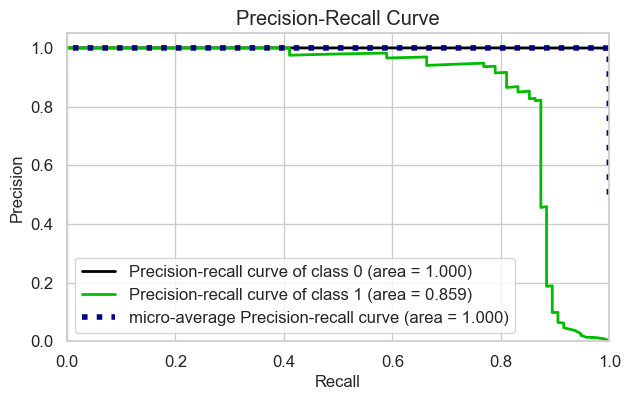

In [87]:
#XGB_pl = XGBClassifier(random_state=s, n_jobs=1).fit(X_resampled_XGB, y_resampled_XGB)
# Get the predicted probabilities for the test data
y_proba = XGB.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [88]:
y_pred = XGB.predict(X_test)
y_pred_proba = XGB.predict_proba(X_test)


rec_Xg = recall_score(y_test, y_pred, labels = [1], average = None)
f1_Xg = f1_score(y_test, y_pred, labels = [1], average = None)
AP_Xg = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)

In [89]:
print(rec_Xg, f1_Xg, AP_Xg)

[0.78947368] [0.85227273] 0.8591921457906371


In [91]:
import pickle
# To save a pipeline using pickle
pickle.dump(XGB, open("XG_model_s", "wb"))

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [100]:
XGB_ev = XGBClassifier(random_state=s, n_jobs=1).fit(X_resampled_XGB, y_resampled_XGB)

In [95]:
# train_ds = Dataset(X_resampled_XGB, label=y_resampled_XGB)
# test_ds = Dataset(X_test, label=y_test)

# from deepchecks.tabular.suites import model_evaluation

# evaluation_suite = model_evaluation()
# suite_result = evaluation_suite.run(train_ds, test_ds, XGB_ev)
# # Note: the result can be saved as html using suite_result.save_as_html()
# # or exported to json using suite_result.to_json()
# suite_result.show()

In [101]:
trying = pd.DataFrame(X_resampled_XGB, index = y_resampled_XGB.index, columns = X_train.columns)
trying
trying2 = pd.DataFrame(X_test_scaled, index = y_test.index, columns = X_train.columns)
trying2

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount_ln
150240,-2.049535,-2.865625,0.881902,-1.719478,1.419161,1.575163,-0.754163,0.978759,4.035789,-2.117060,...,-3.093987,-1.245213,1.215428,6.210049,-1.239875,2.388813,-0.910193,1.999324,3.299520,0.452170
138517,-1.046913,0.891395,-0.088807,-0.494532,0.747534,1.024256,0.283989,1.238604,0.096549,-0.292971,...,-1.814494,0.091006,-0.186273,-1.134597,-2.211663,0.782650,-1.040460,-7.816345,-1.424435,-0.110280
282036,-0.017625,-0.174187,-0.110716,-1.340410,0.202686,1.796138,-0.893989,1.925996,-0.672750,-0.008906,...,-0.189941,1.784358,1.887214,-0.400073,-1.151605,-0.456236,0.325343,-0.215425,-0.701198,-0.180987
58933,-0.342923,0.793823,0.715630,0.095660,-0.415476,-0.601536,0.168061,0.439276,-0.447717,-0.562239,...,-0.178204,0.211876,0.007269,0.122160,0.884434,-0.312765,0.373240,-1.312279,-0.111775,-0.427837
145202,0.969652,-0.510235,-0.998683,-1.216090,-0.137976,-0.770131,-0.045531,-0.562365,1.743855,-1.036180,...,-0.490855,0.577762,0.987122,-0.460285,-0.369557,0.851389,-0.873358,0.184750,-0.651799,-1.246389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76267,0.596491,0.334918,-0.421910,0.569682,0.033175,-1.056648,0.234915,-0.486967,0.093198,-0.574544,...,-0.296907,-0.351360,-0.486952,-0.168365,0.241022,0.763080,0.752336,-0.256650,0.208375,-1.097598
75767,-0.137707,0.719524,0.644927,0.109228,-0.090150,-0.791403,0.560347,-0.163864,-0.218008,-0.401791,...,0.360685,-0.539508,-0.643918,0.144332,0.766093,-0.346257,0.191603,1.442499,0.661167,-0.790170
139410,0.520278,0.062957,0.172298,0.941322,-0.204147,-0.083862,0.050580,-0.128062,0.259318,-0.043281,...,-0.292784,-0.104239,-0.013994,-0.079143,0.469774,0.899440,-0.486946,0.207903,0.079982,0.047230
47866,-0.646246,-0.411700,1.033267,-1.308189,-0.758966,1.426574,0.391328,1.394843,1.224150,-1.907902,...,0.927669,1.332944,1.198029,1.148863,-0.949402,0.368120,-0.861751,1.954603,0.976642,0.964828


In [103]:
train_ds = Dataset(trying, label=y_resampled_XGB)
test_ds = Dataset(trying2, label=y_test)

from deepchecks.tabular.suites import model_evaluation

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, XGB_ev)



deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.
deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 0 categorical features were inferred.


### Neural Network

In the final step, you will make classification with Neural Network which is a Deep Learning algorithm.

Neural networks are a series of algorithms that mimic the operations of a human brain to recognize relationships between vast amounts of data. They are used in a variety of applications in financial services, from forecasting and marketing research to fraud detection and risk assessment.

A neural network contains layers of interconnected nodes. Each node is a perceptron and is similar to a multiple linear regression. The perceptron feeds the signal produced by a multiple linear regression into an activation function that may be nonlinear.

In a multi-layered perceptron (MLP), perceptrons are arranged in interconnected layers. The input layer collects input patterns. The output layer has classifications or output signals to which input patterns may map.

Hidden layers fine-tune the input weightings until the neural network’s margin of error is minimal. It is hypothesized that hidden layers extrapolate salient features in the input data that have predictive power regarding the outputs.

You will discover **[how to create](https://towardsdatascience.com/building-our-first-neural-network-in-keras-bdc8abbc17f5)** your deep learning neural network model in Python using **[Keras](https://keras.io/about/)**. Keras is a powerful and easy-to-use free open source Python library for developing and evaluating deep learning models.

- The steps you are going to cover for this algorithm are as follows:

   *i. Import Libraries*
   
   *ii. Define Model*
    
   *iii. Compile Model*
   
   *iv. Fit Model*
   
   *v. Prediction and Model Evaluating*
   
   *vi. Plot Precision and Recall Curve*

In [90]:
import os

# Set TF log level to ignore INFOs
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

In [91]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# import warnings
# warnings.filterwarnings("ignore")
# warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option("display.max_columns", None)

In [92]:
import tensorflow as tf

if tf.config.list_physical_devices("GPU"):
    print("GPU support is enabled for this session.")
else:
    print("CPU will be used for this session.")

GPU support is enabled for this session.


In [93]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Assuming you have features (X) and labels (y)
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.15,
                                                    random_state=s)
X_train_, X_val, y_train_, y_val = train_test_split(X_train,
                                                  y_train,
                                                  stratify=y_train,
                                                  test_size=0.1,
                                                  random_state=s)


print("Shape of full X_train:", X_train.shape)
print("Shape of full y_train:", y_train.shape)
print("Shape of partial X_train:", X_train_.shape)
print("Shape of partial y_train:", y_train_.shape)
print("Shape of  X_test:", X_test.shape)
print("Shape of  y_test:", y_test.shape)
print("Shape of  X_val:", X_val.shape)
print("Shape of  y_val:", y_val.shape)


Shape of full X_train: (234236, 29)
Shape of full y_train: (234236,)
Shape of partial X_train: (210812, 29)
Shape of partial y_train: (210812,)
Shape of  X_test: (41336, 29)
Shape of  y_test: (41336,)
Shape of  X_val: (23424, 29)
Shape of  y_val: (23424,)


In [94]:
# Apply scaling to your training data
scaler = StandardScaler()
X_train_scaled_ = scaler.fit_transform(X_train_)
X_val_scaled = scaler.transform(X_val)
X_test_scaled_ = scaler.transform(X_test)

In [95]:
print("Shape of  scaled partial X_train:", X_train_scaled_.shape)
print("Shape of  X_val:", X_val_scaled.shape)
print("Shape of  X_test:", X_test_scaled_.shape)


Shape of  scaled partial X_train: (210812, 29)
Shape of  X_val: (23424, 29)
Shape of  X_test: (41336, 29)


In [96]:
# Now you can use these samplers on your training data
X_train_resampled, y_train_resampled = over.fit_resample(X_train_scaled_, y_train_)
X_train_resampled, y_train_resampled = under.fit_resample(X_train_resampled, y_train_resampled)

***i. Import Libraries***

In [128]:
#!pip install livelossplot

In [97]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import recall_score,\
                            f1_score, precision_recall_curve,\
                            average_precision_score
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV,\
                                    HalvingGridSearchCV,\
                                    RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,\
                                  OneHotEncoder
from sklearn.compose import ColumnTransformer
from livelossplot import PlotLossesKerasTF

***ii. Define Model***

In [98]:
model = Sequential()
model.add(Dense(64, activation="relu", input_dim=(X_train_resampled.shape[1])))
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(4, activation="relu"))
model.add(Dense(2, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

***iii. Compile Model***

In [99]:
model.compile(optimizer=Adam(learning_rate=1e-4), loss="binary_crossentropy", metrics=["Recall"])

***iv. Fit Model***

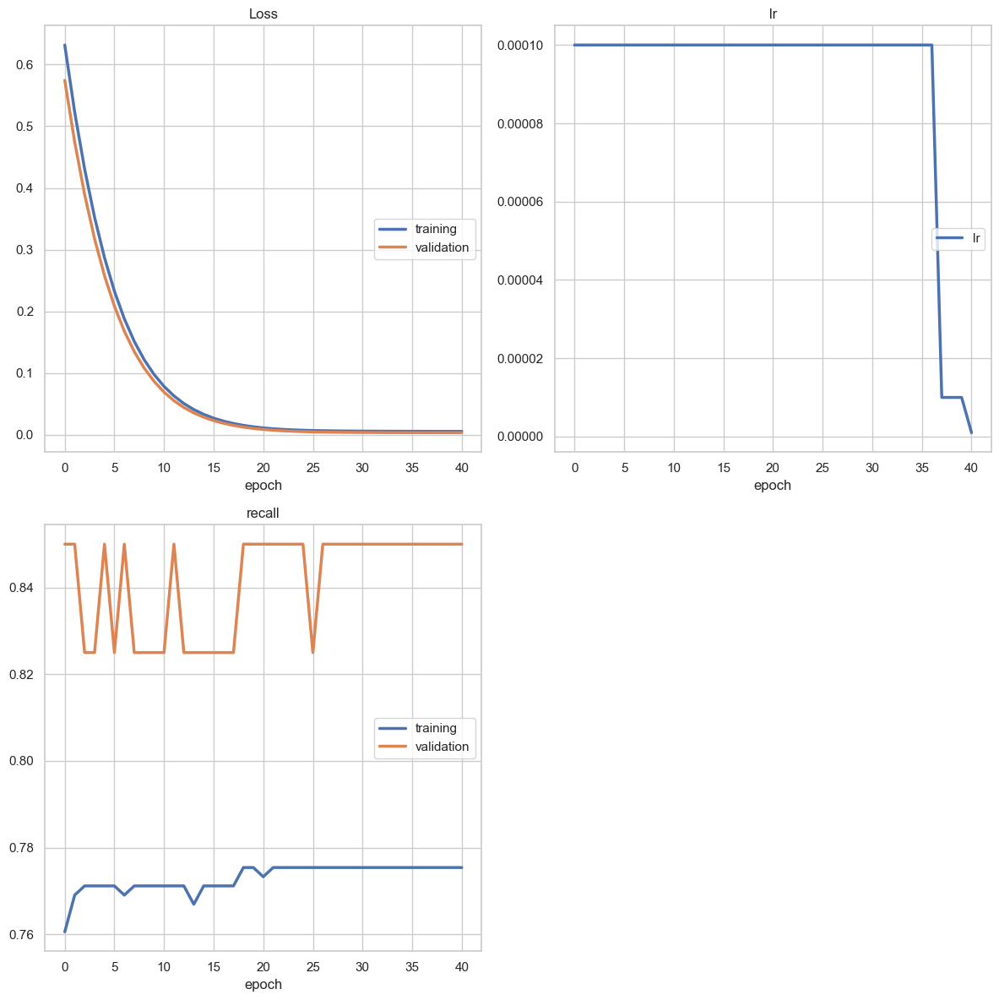

Loss
	training         	 (min:    0.005, max:    0.632, cur:    0.005)
	validation       	 (min:    0.003, max:    0.574, cur:    0.003)
lr
	lr               	 (min:    0.000, max:    0.000, cur:    0.000)
recall
	training         	 (min:    0.761, max:    0.775, cur:    0.775)
	validation       	 (min:    0.825, max:    0.850, cur:    0.850)
2587/2587 [==============================] - 16s 6ms/step - loss: 0.0055 - recall: 0.7754 - val_loss: 0.0033 - val_recall: 0.8500 - lr: 1.0000e-06
Epoch 41: early stopping


In [100]:
from keras.callbacks import ReduceLROnPlateau
model.fit(x=X_train_resampled,
          y=y_train_resampled,
          validation_data=(X_val_scaled, y_val),
          batch_size=64,
          epochs=50,
          callbacks=[ReduceLROnPlateau(patience=3, verbose=1, min_lr=1e-6),
                               EarlyStopping(patience=5, verbose=1), PlotLossesKerasTF()])

***v. Prediction and Model Evaluating***

In [101]:
print( "----------------------------" )
print( "Test" )
print( "----------------------------" )
y_pred_test = (model.predict(X_test_scaled_) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred_test))
print(classification_report(y_test, y_pred_test))

print( "----------------------------" )
print( "Train" )
print( "----------------------------" )
y_pred_train = (model.predict(X_train_resampled) > 0.5).astype("int32")
print(confusion_matrix(y_train_resampled, y_pred_train))
print(classification_report(y_train_resampled, y_pred_train))

----------------------------
Test
----------------------------
1292/1292 [==============================] - 2s 2ms/step
[[41260     5]
 [   14    57]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     41265
           1       0.92      0.80      0.86        71

    accuracy                           1.00     41336
   macro avg       0.96      0.90      0.93     41336
weighted avg       1.00      1.00      1.00     41336

----------------------------
Train
----------------------------
5173/5173 [==============================] - 8s 2ms/step
[[165059      0]
 [   106    366]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       1.00      0.78      0.87       472

    accuracy                           1.00    165531
   macro avg       1.00      0.89      0.94    165531
weighted avg       1.00      1.00      1.00    165531



***vi. Plot Precision and Recall Curve***

1292/1292 [==============================] - 2s 2ms/step


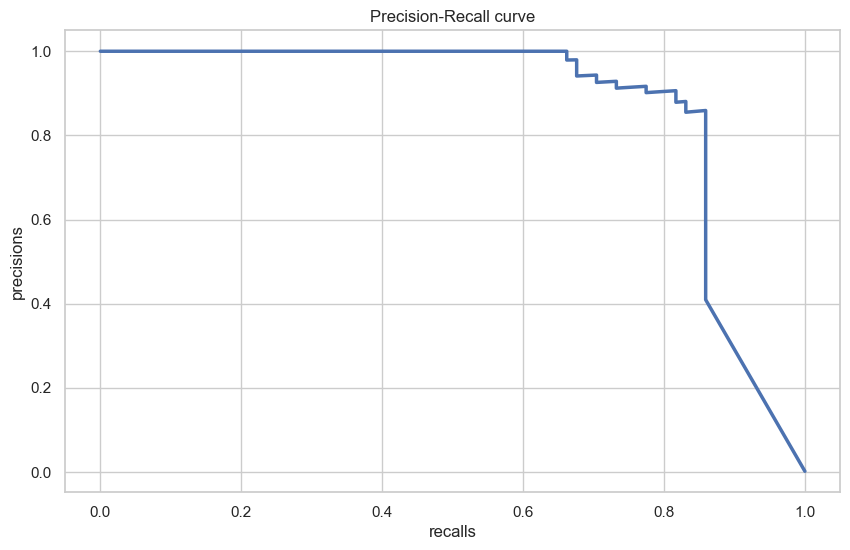

In [103]:
y_pred_proba = model.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label= "ANN" )
plt.xlabel( "recalls" )
plt.ylabel( "precisions" )
plt.title( "Precision-Recall curve" )
plt.show()

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

##optona

In [ ]:
# !pip install optuna


In [104]:
import optuna
# optimizers for gradient descent to use in backpropagation
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [105]:
SEED = s
import os

# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) `tensorflow` random seed
# 3) `python` random seed
seed = 42
keras.utils.set_random_seed(seed)

# This will make TensorFlow ops as deterministic as possible, but it will
# affect the overall performance, so it s not enabled by default.
# `enable_op_determinism()` is introduced in TensorFlow 2.9.

tf.config.experimental.enable_op_determinism()
# os.environ["TF_DETERMINISTIC_OPS"] = "1"

In [106]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=4,
                           restore_best_weights=True)

In [107]:
import optuna
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation
from keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from keras.callbacks import EarlyStopping
trial_metric = "accuracy"
batch_size = 32
def create_model(trial):
    # Some hyperparameters we want to optimize
    first_hidden_layer = trial.suggest_int("input_layer_units", 8, 420)
    first_hidden_layer_dropout = trial.suggest_float("input_layer_dropout", 0, 0.5)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1.3e-1)
    optimizer = trial.suggest_categorical("optimizer", [Adam, Adadelta, RMSprop, Nadam])
    tf.random.set_seed(seed)
    model = Sequential()
    model.add(Dense(first_hidden_layer, input_dim=X_train_resampled.shape[1], activation="relu"))
    # you can add the hidden layers automatically, see the example below:
    hidden_layers = trial.suggest_int("hidden_layers", 1, 6, log=True)
    for i in range(hidden_layers):
      hidden_layer_units = "hidden_layer_units_" + str(i)
      hidden_layer_units = trial.suggest_int(hidden_layer_units, 4, 128, log=True)
      dropout= "dropout_" + str(i)
      dropout = trial.suggest_float(dropout, 0, 0.5)
      model.add(Dense(hidden_layer_units, activation="relu"))
      model.add(Dropout(dropout))
    # we decided to use one neuron with sigmoid func in the output layer
    model.add(Dense(1, activation="sigmoid"))
    model.compile(
      loss="binary_crossentropy",
      optimizer=optimizer(learning_rate=learning_rate),
      metrics=[trial_metric],
    )
    return model
def objective(trial):
  early_stop = EarlyStopping(
  monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True)
  model = create_model(trial)
  w0 = trial.suggest_loguniform("w0", 0.00001, 5)
  w1 = trial.suggest_loguniform("w1", 1, 1000)
  model.fit(
      X_train_resampled,
      y_train_resampled,
      validation_split=0.1,
      batch_size=batch_size,
      epochs=500,
      callbacks=[early_stop],
      class_weight={0: w0, 1: w1},
      verbose=0,
  )
  score = model.evaluate(X_test_scaled_, y_test, verbose=0)[1]
  return score

In [81]:
study1 = optuna.create_study(direction="maximize")
study1.optimize(objective, n_trials=10)
study1.best_params

In [110]:
# # build model with optuna parameters
# hidden_layers = study1.best_params["hidden_layers"]
# input_layer_units = study1.best_params["input_layer_units"]
# input_layer_dropout = study1.best_params["input_layer_dropout"]
# optimizer = study1.best_params["optimizer"]
# hidden_layer_units_0 = study1.best_params["hidden_layer_units_0"]
# hidden_layer_units_1 = study1.best_params["hidden_layer_units_1"]
# hidden_layer_units_2 = study1.best_params["hidden_layer_units_2"]
# #hidden_layer_units_3 = study1.best_params["hidden_layer_units_3"]
# # hidden_layer_units_4 = study.best_params["hidden_layer_units_4"]
# # hidden_layer_units_5 = study.best_params["hidden_layer_units_5"]
# dropout_0 = study1.best_params["dropout_0"]
# dropout_1 = study1.best_params["dropout_1"]
# dropout_2 = study1.best_params["dropout_2"]
# #dropout_3 = study1.best_params["dropout_3"]
# # dropout_4 = study.best_params["dropout_4"]
# # dropout_5 = study.best_params["dropout_5"]
# learning_rate = study1.best_params["learning_rate"]
# w0 = study1.best_params["w0"]
# w1 = study1.best_params["w1"]

hidden_layers =4
input_layer_units = 66
input_layer_dropout = 0.31093478620463094

optimizer = Adam  # <class 'keras.optimizers.optimizer_v2.adam.Adam'>

hidden_layer_units_0 = 84
hidden_layer_units_1 = 5
hidden_layer_units_2 = 14
hidden_layer_units_3 = 112


dropout_0 = 0.4231410196601905
dropout_1 = 0.28800867696735294
dropout_2 = 0.2678424938302036
dropout_3 = 0.3561732914377801

learning_rate = 0.003758824087446088

w0 = 0.0006213968667144795
w1 =  5.617955991505343

In [112]:
print("hidden_layers: ", hidden_layers )
print("input_layer_units ", input_layer_units )
print("input_layer_dropout", input_layer_dropout)
print("optimizer ", optimizer )
print("hidden_layer_units_0", hidden_layer_units_0 )
print("hidden_layer_units_1", hidden_layer_units_1 )
print("hidden_layer_units_2", hidden_layer_units_2 )
print("hidden_layer_units_3", hidden_layer_units_3 )
# print("hidden_layer_units_4", hidden_layer_units_4 )
# print("hidden_layer_units_5", hidden_layer_units_5 )
print("dropout_0", dropout_0 )
print("dropout_1", dropout_1 )
print("dropout_2", dropout_1 )
print("dropout_3", dropout_3 )
# print("dropout_4", dropout_4 )
# print("dropout_5", dropout_5 )
print("learning_rate", learning_rate )
print("w0", w0)
print("w1", w1 )

hidden_layers:  4
input_layer_units  66
input_layer_dropout 0.31093478620463094
optimizer  <class 'keras.optimizers.optimizer_v2.adam.Adam'>
hidden_layer_units_0 84
hidden_layer_units_1 5
hidden_layer_units_2 14
hidden_layer_units_3 112
dropout_0 0.4231410196601905
dropout_1 0.28800867696735294
dropout_2 0.28800867696735294
dropout_3 0.3561732914377801
learning_rate 0.003758824087446088
w0 0.0006213968667144795
w1 5.617955991505343


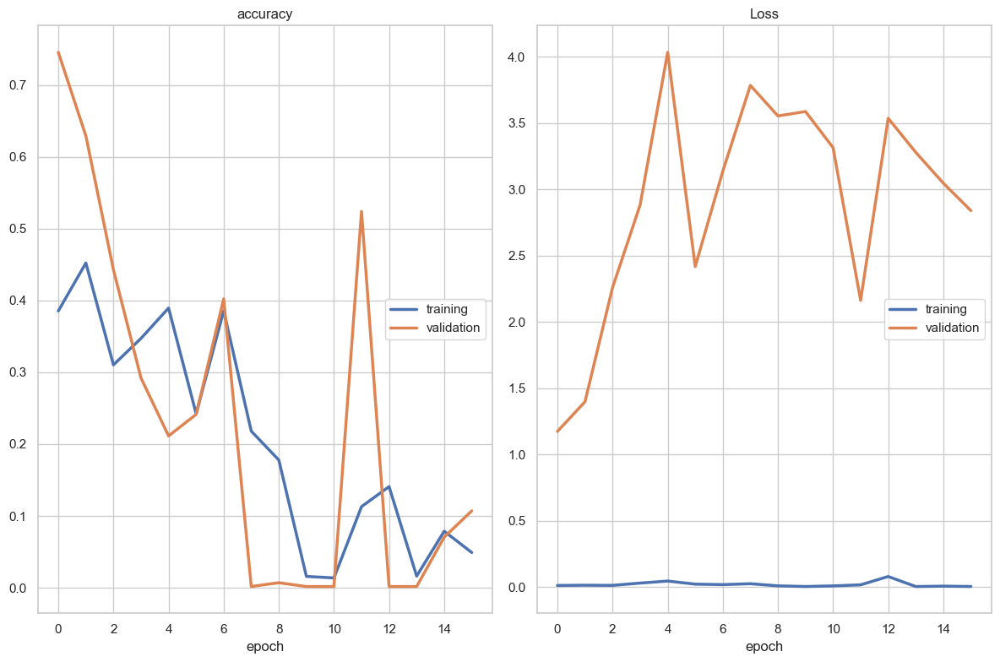

accuracy
	training         	 (min:    0.014, max:    0.452, cur:    0.049)
	validation       	 (min:    0.002, max:    0.746, cur:    0.107)
Loss
	training         	 (min:    0.003, max:    0.078, cur:    0.003)
	validation       	 (min:    1.173, max:    4.033, cur:    2.839)
Restoring model weights from the end of the best epoch: 1.
2587/2587 [==============================] - 15s 6ms/step - loss: 0.0030 - accuracy: 0.0490 - val_loss: 2.8388 - val_accuracy: 0.1071
Epoch 16: early stopping


In [113]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation
from keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from keras.callbacks import EarlyStopping
# In each minibatch during the training, 0.2 of the nuerons will set to be = 0, it helps to redcue the overfitting potential
tf.random.set_seed(seed)

Optuna_New2 = Sequential(
    [
        Input(shape= X_train_resampled.shape[1]),  # Number of inputs [feature]
        Dense(hidden_layer_units_0, activation="relu"),
        Dropout(dropout_0),
        Dense(hidden_layer_units_1, activation="relu"),
        Dropout(dropout_1),
        Dense(hidden_layer_units_2, activation="relu"),
        Dropout(dropout_2),
        Dense(hidden_layer_units_3, activation="relu"),
        Dropout(dropout_3),
        # Dense(hidden_layer_units_4, activation="relu"),
        # Dropout(dropout_4),
        # Dense(hidden_layer_units_5, activation="relu"),
        # Dropout(dropout_5),
        Dense(units=1, activation= "sigmoid" ),  #  1 neuron and Sigmoid because it is a bianry classification problem
    ]
)
# Complie
Optuna_New2.compile(optimizer=optimizer(learning_rate=learning_rate),
                     loss= "binary_crossentropy" ,
                     metrics= "accuracy" )
#  live training loss plot
from livelossplot import PlotLossesKeras
# Stop training when a monitored metric has stopped improving.
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True
)
# We are readt to fit the data
Optuna_New2.fit(
    x=X_train_resampled, y=y_train_resampled, validation_data=[X_val_scaled, y_val], batch_size=64, epochs=1000, verbose=1,  # 1000 epoch since there is early stopping
    class_weight={0: w0, 1: w1},
    callbacks=[PlotLossesKeras(), early_stop]  # We add the erarly stop
)

In [114]:
print( "----------------------------" )
print( "Test" )
print( "----------------------------" )
y_pred_test = (Optuna_New2.predict(X_test_scaled_) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred_test))
print(classification_report(y_test, y_pred_test))

print( "----------------------------" )
print( "Train" )
print( "----------------------------" )
y_pred_train = (Optuna_New2.predict(X_train_resampled) > 0.5).astype("int32")
print(confusion_matrix(y_train_resampled, y_pred_train))
print(classification_report(y_train_resampled, y_pred_train))

----------------------------
Test
----------------------------
1292/1292 [==============================] - 2s 1ms/step
[[30762 10503]
 [    2    69]]
              precision    recall  f1-score   support

           0       1.00      0.75      0.85     41265
           1       0.01      0.97      0.01        71

    accuracy                           0.75     41336
   macro avg       0.50      0.86      0.43     41336
weighted avg       1.00      0.75      0.85     41336

----------------------------
Train
----------------------------
5173/5173 [==============================] - 7s 1ms/step
[[122058  43001]
 [    14    458]]
              precision    recall  f1-score   support

           0       1.00      0.74      0.85    165059
           1       0.01      0.97      0.02       472

    accuracy                           0.74    165531
   macro avg       0.51      0.85      0.44    165531
weighted avg       1.00      0.74      0.85    165531



1292/1292 [==============================] - 2s 2ms/step


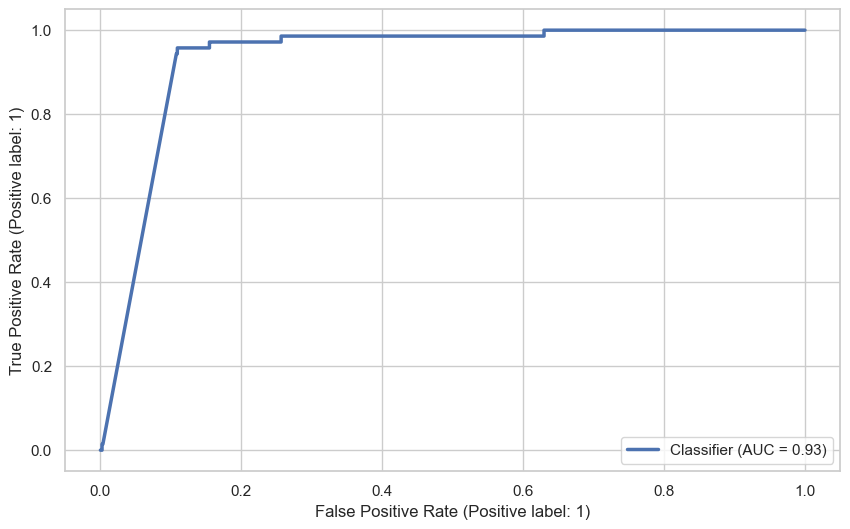

In [115]:
# Since this is without early stopping, we will just use 500 epoch

from sklearn.metrics import roc_curve, RocCurveDisplay
# eval_metric(model_Optuna_New2, X_train, y_train, X_test, y_test)

# ROC curve as the question satted, even though it is clearly imbalanced which means Precsion Vs Recall curve is better
y_pred_proba = Optuna_New2.predict(X_test_scaled_)
RocCurveDisplay.from_predictions(y_test, y_pred_proba)

1292/1292 [==============================] - 2s 1ms/step


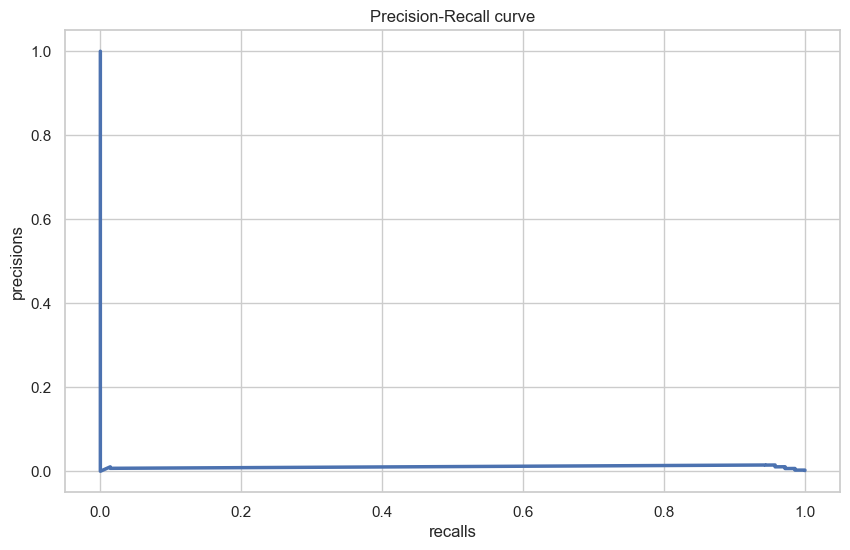

In [116]:
y_pred_proba = Optuna_New2.predict(X_test_scaled_)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label= "ANN" )
plt.xlabel( "recalls" )
plt.ylabel( "precisions" )
plt.title( "Precision-Recall curve" )
plt.show()

**VERY BAD**

## Comparing

In [ ]:
print(rec_lg, f1_lg, AP_lg) #Without smote
print(rec_lg_def_s, f1_lg_def_s, AP_lg_def_s) #Smote
print(rec_rf, f1_rf, AP_rf) #Without smote
print(rec_rf_def, f1_lrf_def, AP_rf_def) #With smote and default
print(rec_rf_s, f1_rf_s, AP_rf_s) #With smote and hyper
print(rec_Xg, f1_Xg, AP_Xg) #With smote

In [83]:
# To not lose them

compare = pd.DataFrame({
    "Model": ["LG Without SMOTE", "LG With SMOTE",  "RF Without SMOTE" , "RF With SMOTE Def","XG With SMOTE (overfitted)", "MLP"],
    "F1": [ 0.854, 0.848, .96, 0.94,  0.881232, 0.92],
    "Recall": [0.764, 0.767, 0.75, 0.78,  0.805174, .80],
    "AP": [0.7421, 0.7302,0.858, 0.849,  0.785209, 0.7384]
})

compare

,Model,F1,Recall,AP
0,LG Without SMOTE,0.854000,0.764000,0.742100
1,LG With SMOTE,0.848000,0.767000,0.730200
2,RF Without SMOTE,0.960000,0.750000,0.858000
3,RF With SMOTE Def,0.940000,0.780000,0.849000
4,XG With SMOTE (overfitted),0.881232,0.805174,0.785209
5,MLP,0.920000,0.800000,0.738400


In [ ]:
compare = pd.DataFrame({
    "Model": ["LG Without SMOTE", "LG With SMOTE",  RF Without SMOTE , "RF With SMOTE Def", "RF With SMOTE Hyper", "XG With SMOTE"],
    "F1": [f1_lg, f1_lg_def_s, f1_rf, f1_lrf_def, f1_rf_s, f1_Xg],
    "Recall": [rec_lg, rec_lg_def_s, rec_rf, rec_rf_def, rec_rf_s, rec_Xg],
    "AP": [AP_lg, AP_lg_def_s,AP_rf, AP_rf_def, AP_rf_s, AP_Xg]
})

compare

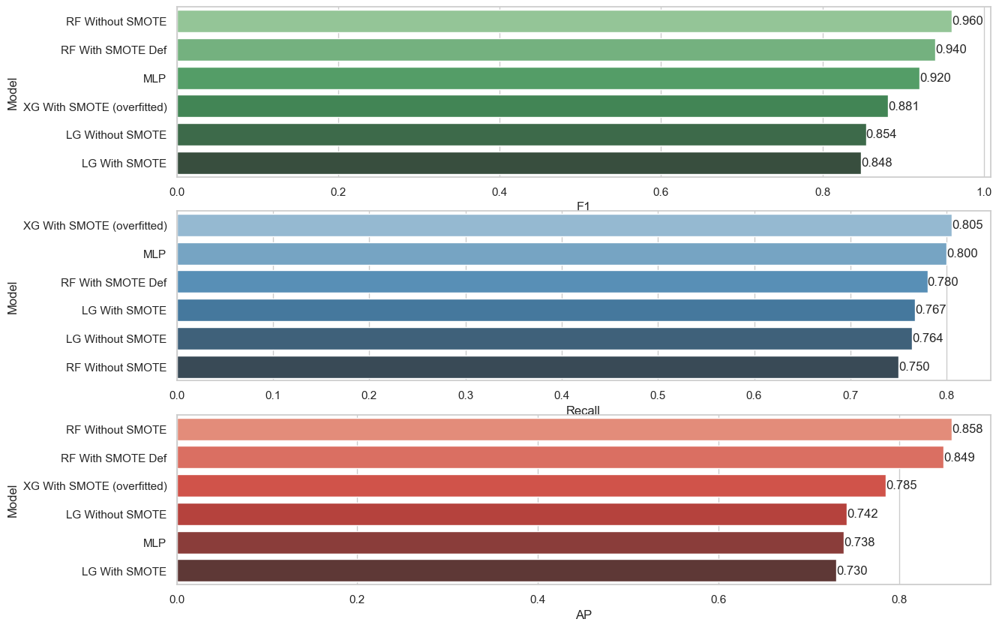

In [88]:
def labels(ax):
    for p in ax.patches:
        width = p.get_width()  # get bar length
        ax.text(
            width,  # set the text at 1 unit right of the bar
            p.get_y() +
            p.get_height() / 2,  # get Y coordinate + X coordinate / 2
             '{:1.3f}' .format(width),  # set variable to display, 2 decimals
            ha= "left" ,  # horizontal alignment
            va= "center" )  # vertical alignment


plt.figure(figsize=(14, 10))
plt.subplot(311)
compare = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot(x="F1", y="Model", data=compare, palette="Greens_d")
labels(ax)

plt.subplot(312)
compare = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(313)
compare = compare.sort_values(by="AP", ascending=False)
ax = sns.barplot(x="AP", y="Model", data=compare, palette="Reds_d")
labels(ax)
plt.show()


In [ ]:
y.value_counts()[0] / (y.value_counts()[0] + y.value_counts()[1])

## Final Model

In [ ]:
df.columns

In [ ]:
# XG:
# V14, V19, V12, V6, Amount_ln

# RF:
# V14, V10, V12, V17, V11

In [ ]:
#Dropping the unnecessary columns
df_xgg = df.drop([ "V1" ,  "V2" ,  "V3" ,  "V4" ,  "V5" ,  "V7" ,  "V8" ,  "V9" ,  "V10" ,  "V11" ,  "V13" ,  "V15" ,  "V16" ,  "V17" ,  "V18" ,  "V20" ,  "V21" ,
        "V22" ,  "V23" ,  "V24" ,  "V25" ,  "V26" ,  "V27" ,  "V28" ], axis=1)
#Seeing the head
df_xgg.head()

## Building the model with new XG

In [ ]:
X = df_xgg.drop( "Class" , axis = 1)
y = df_xgg[ "Class" ]

In [ ]:
print( "The shape of X:"  , X.shape)
print( "The shape of y: " , y.shape)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = t, stratify=y, random_state=s)

In [ ]:
df_xgg.Class.value_counts()

In [ ]:
# equalizes or approximates minority classes to the majority class.
from imblearn.over_sampling import SMOTE

# equalizes or converges the majority class to the minority class
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline

over = SMOTE(sampling_strategy={1: 10000})
under = RandomUnderSampler(sampling_strategy={0: 100000})

In [ ]:
y_train.value_counts()

In [ ]:
steps = [("o", over), ("u", under)]


pipeline = imbpipeline(steps=steps)

# First the number of hispanic cals will be increased to 1000 as per our instruction,
# and then the white class will be reduced to 2500.
X_resampled_XGB2, y_resampled_XGB2 = pipeline.fit_resample(X_train, y_train)

In [ ]:
y_resampled_XGB2.value_counts()

Class
0    100000
1     10000
Name: count, dtype: int64

In [ ]:
XGB_new = XGBClassifier(random_state=s, n_jobs=1).fit(X_resampled_XGB2, y_resampled_XGB2)

In [ ]:
eval_metric(XGB_new, X_resampled_XGB2, y_resampled_XGB2, X_test, y_test)

Test_Set
[[32417    19]
 [   11    35]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     32436
           1       0.65      0.76      0.70        46

    accuracy                           1.00     32482
   macro avg       0.82      0.88      0.85     32482
weighted avg       1.00      1.00      1.00     32482


Train_Set
[[99990    10]
 [   76  9924]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    100000
           1       1.00      0.99      1.00     10000

    accuracy                           1.00    110000
   macro avg       1.00      1.00      1.00    110000
weighted avg       1.00      1.00      1.00    110000



In [ ]:
# Initialize an XGBoost classifier with random state and n_jobs
XGB_2 = XGBClassifier(random_state=s, n_jobs=1)

# Perform 10-fold cross-validation with return_train_score=True
scores = cross_validate(XGB_2, X_resampled_XGB2, y_resampled_XGB2, scoring=scoring, cv=10, return_train_score=True)

# Convert the scores dictionary to a Pandas DataFrame
df_scores = pd.DataFrame(scores, index=range(1, 11))

# Calculate and print the mean of all scoring metrics across folds
df_scores.mean()[2:]

test_precision_Fraud     0.990230
train_precision_Fraud    0.999273
test_recall_Fraud        0.971400
train_recall_Fraud       0.993211
test_f1_Fraud            0.980711
train_f1_Fraud           0.996233
test_AP_Fraud            0.964506
train_AP_Fraud           0.993107
dtype: float64

## Building the model with new RF

In [106]:
df_rff = df[["V4", "V7", "V9", "V10", "V11", "V12", "V14", "V16", "V17", "Class"]]
df_rff.head()

,V4,V7,V9,V10,V11,V12,V14,V16,V17,Class
0,1.378155,0.239599,0.363787,0.090794,-0.551600,-0.617801,-0.311169,-0.470401,0.207971,0
1,0.448154,-0.078803,-0.255425,-0.166974,1.612727,1.065235,-0.143772,0.463917,-0.114805,0
2,0.379780,0.791461,-1.514654,0.207643,0.624501,0.066084,-0.165946,-2.890083,1.109969,0
3,-0.863291,0.237609,-1.387024,-0.054952,-0.226487,0.178228,-0.287924,-1.059647,-0.684093,0
4,0.403034,0.592941,0.817739,0.753074,-0.822843,0.538196,-1.119670,-0.451449,-0.237033,0


In [108]:
X_f = df_rff.drop( 'Class' , axis = 1)
y_f = df_rff[ 'Class' ]

In [110]:
print( 'The shape of X:'  , X_f.shape)
print( 'The shape of y:'  , y_f.shape)

The shape of X: (275572, 9)
The shape of y: (275572,)


In [111]:
X_trainf, X_testf, y_trainf, y_testf = train_test_split(X_f, y_f, test_size = t, stratify=y, random_state=s)

In [112]:
df_rff.Class.value_counts()

Class
0    275099
1       473
Name: count, dtype: int64

In [113]:
# equalizes or approximates minority classes to the majority class.
from imblearn.over_sampling import SMOTE

# equalizes or converges the majority class to the minority class
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline

# over = SMOTE(sampling_strategy={1: 10000})
# under = RandomUnderSampler(sampling_strategy={0: 100000})

under_class0 = int(y_train.value_counts()[0] - (0.2 * y.value_counts()[0]))
over_class1 = int(y_train.value_counts()[1] + (0.2 * y.value_counts()[1]))


over = SMOTE(sampling_strategy={1:over_class1})
under = RandomUnderSampler(sampling_strategy={0: under_class0})

In [114]:
y_trainf.value_counts()

Class
0    220079
1       378
Name: count, dtype: int64

In [115]:
steps = [("o", over), ("u", under)]


pipeline = imbpipeline(steps=steps)

# First the number of hispanic cals will be increased to 1000 as per our instruction,
# and then the white class will be reduced to 2500.
X_resampled_RF2, y_resampled_RF2 = pipeline.fit_resample(X_trainf, y_trainf)

In [116]:
y_resampled_RF2.value_counts()

Class
0    165059
1       472
Name: count, dtype: int64

In [117]:
rf_new = RandomForestClassifier(random_state=s).fit(X_resampled_RF2, y_resampled_RF2)

In [118]:
eval_metric(rf_new, X_resampled_RF2, y_resampled_RF2, X_testf, y_testf)

Test_Set
[[55014     6]
 [   17    78]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55020
           1       0.93      0.82      0.87        95

    accuracy                           1.00     55115
   macro avg       0.96      0.91      0.94     55115
weighted avg       1.00      1.00      1.00     55115


Train_Set
[[165059      0]
 [     0    472]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    165059
           1       1.00      1.00      1.00       472

    accuracy                           1.00    165531
   macro avg       1.00      1.00      1.00    165531
weighted avg       1.00      1.00      1.00    165531



In [119]:
# Initialize an XGBoost classifier with random state and n_jobs
rf_2 = RandomForestClassifier(random_state=s, n_jobs=1)

# Perform 10-fold cross-validation with return_train_score=True
scores = cross_validate(rf_2, X_resampled_RF2, y_resampled_RF2, scoring=scoring, cv=10, return_train_score=True)

# Convert the scores dictionary to a Pandas DataFrame
df_scores = pd.DataFrame(scores, index=range(1, 11))

# Calculate and print the mean of all scoring metrics across folds
df_scores.mean()[2:]

test_precision_Fraud     0.977408
train_precision_Fraud    1.000000
test_recall_Fraud        0.811525
train_recall_Fraud       0.998588
test_f1_Fraud            0.886314
train_f1_Fraud           0.999293
test_AP_Fraud            0.793880
train_AP_Fraud           0.998592
dtype: float64

## Final Model

In [121]:
rf_final = RandomForestClassifier(random_state=s).fit(X_f, y_f)

### Prediction

In [122]:
df_rff.head()

,V4,V7,V9,V10,V11,V12,V14,V16,V17,Class
0,1.378155,0.239599,0.363787,0.090794,-0.551600,-0.617801,-0.311169,-0.470401,0.207971,0
1,0.448154,-0.078803,-0.255425,-0.166974,1.612727,1.065235,-0.143772,0.463917,-0.114805,0
2,0.379780,0.791461,-1.514654,0.207643,0.624501,0.066084,-0.165946,-2.890083,1.109969,0
3,-0.863291,0.237609,-1.387024,-0.054952,-0.226487,0.178228,-0.287924,-1.059647,-0.684093,0
4,0.403034,0.592941,0.817739,0.753074,-0.822843,0.538196,-1.119670,-0.451449,-0.237033,0


In [124]:
X_f.head()

,V4,V7,V9,V10,V11,V12,V14,V16,V17
0,1.378155,0.239599,0.363787,0.090794,-0.551600,-0.617801,-0.311169,-0.470401,0.207971
1,0.448154,-0.078803,-0.255425,-0.166974,1.612727,1.065235,-0.143772,0.463917,-0.114805
2,0.379780,0.791461,-1.514654,0.207643,0.624501,0.066084,-0.165946,-2.890083,1.109969
3,-0.863291,0.237609,-1.387024,-0.054952,-0.226487,0.178228,-0.287924,-1.059647,-0.684093
4,0.403034,0.592941,0.817739,0.753074,-0.822843,0.538196,-1.119670,-0.451449,-0.237033


In [ ]:
"V4", "V7", "V9", "V10", "V11", "V12", "V14", "V16", "V17"

In [125]:
my_dict = {
     "V4": 1.378155,
     "V7": 0.239599,
     "V9": 0.363787,
     "V10": 0.090794,
     "V11": -0.551600,
     "V12": -0.617801,
     "V14": -0.311169,
     "V16": -0.470401,
     "V17":0.207971
}
data = pd.DataFrame.from_dict([my_dict])
data

,V4,V7,V9,V10,V11,V12,V14,V16,V17
0,1.378155,0.239599,0.363787,0.090794,-0.5516,-0.617801,-0.311169,-0.470401,0.207971


In [126]:
prediction = rf_final.predict(data)
print(prediction)

[0]


In [127]:
print("The Class is {}. ".format(int(prediction[0])))

The Class is 0. 


## 4. Model Deployement
You cooked the food in the kitchen and moved on to the serving stage. The question is how do you showcase your work to others? Model Deployement helps you showcase your work to the world and make better decisions with it. But, deploying a model can get a little tricky at times. Before deploying the model, many things such as data storage, preprocessing, model building and monitoring need to be studied.

Deployment of machine learning models, means making your models available to your other business systems. By deploying models, other systems can send data to them and get their predictions, which are in turn populated back into the company systems. Through machine learning model deployment, can begin to take full advantage of the model you built.

Data science is concerned with how to build machine learning models, which algorithm is more predictive, how to design features, and what variables to use to make the models more accurate. However, how these models are actually used is often neglected. And yet this is the most important step in the machine learning pipline. Only when a model is fully integrated with the business systems, real values ​​can be extract from its predictions.

After doing the following operations in this notebook, jump to a proper IDE and create your web app with Streamlit API.

### Save and Export the Best Model


In [128]:
pickle.dump(rf_final, open( 'final_rf' ,  'wb' ))

### Save and Export Variables

In [129]:
new_model = pickle.load(open( 'final_rf' ,  'rb' ))

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___